In [1]:
import pandas as pd
import numpy as np
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from scipy import stats
from collections import defaultdict
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import mannwhitneyu
from statannotations.Annotator import Annotator

In [2]:
models = ['PDBbind_minimized_v18_subset','PLANet_v18', 'PDBbind_minimized_v18_subset_union_PLANet_v18']
tps = ['cmx', 'lig_alone']

In [3]:
test_dir = '/pubhome/xli02/project/PLIM/deep_learning/FAST/fast_plim/hold_out_2019/test_result'

In [4]:
PLANet_hold = pd.read_csv('/pubhome/xli02/project/PLIM/deep_learning/FAST/fast_plim/hold_out_2019/index/minimized/PLANet_hold_out_2019.csv', sep='\t')
PLANet_hold

,unique_identify,-logAffi
0,CHEMBL1075159_5vfd_CHEMBL4298137,6.163784
1,CHEMBL1075317_6dar_CHEMBL4276691,5.899629
2,CHEMBL1075317_6dar_CHEMBL4276791,6.732828
3,CHEMBL1075317_6dar_CHEMBL4276998,5.407823
4,CHEMBL1075317_6dar_CHEMBL4277278,5.142065
...,...,...
5878,CHEMBL6154_5nut_CHEMBL4290134,8.060481
5879,CHEMBL6154_5nut_CHEMBL4447252,7.978811
5880,CHEMBL6154_5nut_CHEMBL4455904,7.920819
5881,CHEMBL6154_5nut_CHEMBL4475367,7.886057


In [5]:
PLANet_property = pd.read_csv('/pubhome/xli02/project/PLIM/analysis/20220812_paper/distribution/property/PLANet_property.csv', sep='\t')
PLANet_property

,unique_identify,-logAffi,Target_chembl_id,Cry_lig_name,Cry_lig_smiles,Cry_lig_an,Similar_compnd_name,Similar_compnd_smiles,Similar_compnd_an,Similarity,...,MCS_smarts,target_compnd,mw,logp,rotb,hbd,hba,q,HA,dataset
0,CHEMBL1075026_1swr_CHEMBL857,14.000000,CHEMBL1075026,1swr,O=C(O)CCCC[C@@H]1SC[C@@H]2NC(=O)N[C@H]12,16,CHEMBL857,O=C(O)CCCC[C@@H]1SC[C@@H]2NC(=O)N[C@H]12,16,1.000000,...,[#6](-&!@[#6]-&!@[#6]-&!@[#6]-&!@[#6]-&!@[#6]1...,CHEMBL1075026_CHEMBL857,243.308,-0.5379,5.0,2.0,4.0,-1.0,16.0,PLANet
1,CHEMBL1075027_1hp5_CHEMBL257158,4.698970,CHEMBL1075027,1hp5,CC1=N[C@H]2[C@H](O[C@H](CO)[C@@H](O)[C@@H]2O)S1,14,CHEMBL257158,CC1=N[C@H]2[C@H](O[C@H](CO)[C@@H](O)[C@@H]2O)S1,14,1.000000,...,[#6]12-&@[#6](-&@[#16]-&@[#6](=&@[#7]-&@1)-&!@...,CHEMBL1075027_CHEMBL257158,219.262,-1.0408,1.0,3.0,6.0,0.0,14.0,PLANet
2,CHEMBL1075027_1hp5_CHEMBL403756,4.000000,CHEMBL1075027,1hp5,CC1=N[C@H]2[C@H](O[C@H](CO)[C@@H](O)[C@@H]2O)S1,14,CHEMBL403756,CC1=N[C@H]2[C@H](O[C@H](CO)[C@H](O)[C@@H]2O)S1,14,1.000000,...,[#6]12-&@[#6](-&@[#16]-&@[#6](=&@[#7]-&@1)-&!@...,CHEMBL1075027_CHEMBL403756,219.262,-1.0408,1.0,3.0,6.0,0.0,14.0,PLANet
3,CHEMBL1075027_1hp5_CHEMBL404356,3.698970,CHEMBL1075027,1hp5,CC1=N[C@H]2[C@H](O[C@H](CO)[C@@H](O)[C@@H]2O)S1,14,CHEMBL404356,CC1=N[C@@H]2[C@@H](O)[C@H](O)[C@@H](CO)O[C@]2(...,15,0.824870,...,[#6]12-&@[#6](-&@[#16]-&@[#6](=&@[#7]-&@1)-&!@...,CHEMBL1075027_CHEMBL404356,233.289,-0.6507,1.0,3.0,6.0,0.0,15.0,PLANet
4,CHEMBL1075027_1jak_CHEMBL253537,4.677781,CHEMBL1075027,1jak,CC(=O)N[C@H]1[NH2+]C[C@H](CO)[C@H](O)[C@@H]1O,14,CHEMBL253537,CC(=O)N[C@@H]1NC[C@H](CO)[C@H](O)[C@@H]1O,14,1.000000,...,[#6]1(-&@[#7]-&@[#6]-&@[#6](-&@[#6](-&@[#6]-&@...,CHEMBL1075027_CHEMBL253537,205.234,-3.6441,2.0,5.0,4.0,1.0,14.0,PLANet
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69811,CHEMBL6166_4zk5_CHEMBL3623138,8.431798,CHEMBL6166,4zk5,Nc1ncc(C(=O)NC2CN(C(=O)C3C=C3)C2)c2ccc(-c3cccc...,30,CHEMBL3623138,Nc1ncc(C(=O)NC2CN(C(=O)C3CC3)C2)c2ccc(-c3cccc(...,30,0.966205,...,[#6]1:&@[#6](:&@[#6]:&@[#6]:&@[#6]:&@[#6]:&@1-...,CHEMBL6166_CHEMBL3623138,405.433,2.3687,4.0,2.0,5.0,0.0,30.0,PLANet
69812,CHEMBL6166_4zk5_CHEMBL3623139,8.795880,CHEMBL6166,4zk5,Nc1ncc(C(=O)NC2CN(C(=O)C3C=C3)C2)c2ccc(-c3cccc...,30,CHEMBL3623139,CNC(=O)N1CC(NC(=O)c2cnc(N)c3nc(-c4cccc(F)c4)cc...,29,0.920581,...,[#6](=&!@[#8])-&!@[#7]1-&@[#6]-&@[#6](-&@[#6]-...,CHEMBL6166_CHEMBL3623139,394.410,1.7715,3.0,3.0,5.0,0.0,29.0,PLANet
69813,CHEMBL6166_5di1_CHEMBL3754283,7.588909,CHEMBL6166,5di1,CS(=O)(=O)c1ccc(-c2cc(-c3ccc(O)cc3)cnc2N)cc1,24,CHEMBL3754283,CS(=O)(=O)c1ccc(-c2cc(-c3ccc(O)cc3)cnc2N)cc1,24,1.000000,...,[#6]1(-&!@[#6]2:&@[#6]:&@[#6]:&@[#6](:&@[#6]:&...,CHEMBL6166_CHEMBL3754283,340.404,3.1069,3.0,2.0,5.0,0.0,24.0,PLANet
69814,CHEMBL6166_5di1_CHEMBL3754304,6.285285,CHEMBL6166,5di1,CS(=O)(=O)c1ccc(-c2cc(-c3ccc(O)cc3)cnc2N)cc1,24,CHEMBL3754304,CS(=O)(=O)c1ccc(-c2cc(-c3ccc(C(N)=O)cc3)cnc2N)cc1,26,0.838403,...,[#6]1(-&!@[#6]2:&@[#6]:&@[#6]:&@[#6]:&@[#6]:&@...,CHEMBL6166_CHEMBL3754304,367.430,2.5002,4.0,2.0,5.0,0.0,26.0,PLANet


In [6]:
PLANet_hold_property = PLANet_property[PLANet_property['unique_identify'].isin(PLANet_hold['unique_identify'])]
len(PLANet_hold_property)

5883

# 1. metrics 

In [8]:
mean_pred_df = pd.DataFrame.from_dict({})
label_to_res_dict = defaultdict(list)
for model in models:
    for tp in tps:
        res_df = pd.read_csv(f'{test_dir}/test_on_PLANet_hold_out_2019/{model}_{tp}/test.csv', sep='\t')
        # print(len(res_df_heavy_atom))
        # res_df_with_prop_Mw_pAffi = res_df_with_prop[(res_df_with_prop['y_true'] < 10) & (res_df_with_prop['y_true'] >0) & (res_df_with_prop['mw'] < 800)].copy()
        for i in range(5):
            r2 = r2_score(y_true=res_df['y_true'], y_pred=res_df[f'{model}_{tp}_{i+1}_pred'])
            mae = mean_absolute_error(y_true=res_df['y_true'], y_pred=res_df[f'{model}_{tp}_{i+1}_pred'])
            mse = mean_squared_error(y_true=res_df['y_true'], y_pred=res_df[f'{model}_{tp}_{i+1}_pred'])
            pearsonr = stats.pearsonr(res_df['y_true'], res_df[f'{model}_{tp}_{i+1}_pred'])[0]
            spearmanr = stats.spearmanr(res_df['y_true'], res_df[f'{model}_{tp}_{i+1}_pred'])[0]
            label_to_res_dict[f'{model}_{tp}_{i+1}']=[r2, mae, mse, pearsonr, spearmanr]

        res_df[f'{model}_{tp}_mean'] = res_df[[f'{model}_{tp}_{i+1}_pred' for i in range(5)]].mean(axis=1)
        if mean_pred_df.empty:
            mean_pred_df = res_df[['unique_identify', 'y_true', f'{model}_{tp}_mean']].copy()
        else:
            mean_pred_df = pd.merge(mean_pred_df, res_df[['unique_identify', 'y_true', f'{model}_{tp}_mean']], on=['unique_identify', 'y_true'])

In [9]:
sum_df = pd.DataFrame.from_dict(label_to_res_dict, orient='index', columns=['r2', 'mae', 'mse', 'pearsonr', 'spearmanr']).reset_index()
sum_df.rename(columns={"index": "model_names_test_type"}, inplace=True)
sum_df['rmse'] = np.sqrt(sum_df['mse'])
sum_df['model_tp'] = sum_df['model_names_test_type'].str.rsplit('_', n=1).str[0]
sum_df['type'] = ['cmx' if 'cmx' in m else 'ligand_alone' for m in sum_df['model_tp']]
sum_df['dataset'] = ['_'.join(m.split('_')[:-1]) if 'cmx' in m else '_'.join(m.split('_')[:-2]) for m in sum_df['model_tp']]
sum_df.to_csv('/pubhome/xli02/project/PLIM/deep_learning/FAST/fast_plim/hold_out_2019/4-evaluation/test_on_PLANet_hold_out_2019/6_models_5_repeats_metrics_heavy_atom_filtered.csv', sep='\t', index=False)
sum_df

,model_names_test_type,r2,mae,mse,pearsonr,spearmanr,rmse,model_tp,type,dataset
0,PDBbind_minimized_v18_subset_cmx_1,-0.083945,1.124521,2.039945,0.270040,0.208547,1.428266,PDBbind_minimized_v18_subset_cmx,cmx,PDBbind_minimized_v18_subset
1,PDBbind_minimized_v18_subset_cmx_2,-0.165778,1.163756,2.193950,0.286098,0.249846,1.481199,PDBbind_minimized_v18_subset_cmx,cmx,PDBbind_minimized_v18_subset
2,PDBbind_minimized_v18_subset_cmx_3,0.000389,1.057116,1.881232,0.343419,0.310718,1.371580,PDBbind_minimized_v18_subset_cmx,cmx,PDBbind_minimized_v18_subset
3,PDBbind_minimized_v18_subset_cmx_4,0.034203,1.049123,1.817595,0.325355,0.280486,1.348182,PDBbind_minimized_v18_subset_cmx,cmx,PDBbind_minimized_v18_subset
4,PDBbind_minimized_v18_subset_cmx_5,-0.160534,1.151264,2.184083,0.296285,0.251683,1.477864,PDBbind_minimized_v18_subset_cmx,cmx,PDBbind_minimized_v18_subset
5,PDBbind_minimized_v18_subset_lig_alone_1,0.091203,1.012972,1.710323,0.383248,0.359471,1.307793,PDBbind_minimized_v18_subset_lig_alone,ligand_alone,PDBbind_minimized_v18_subset
6,PDBbind_minimized_v18_subset_lig_alone_2,0.006070,1.070905,1.870539,0.316476,0.284949,1.367677,PDBbind_minimized_v18_subset_lig_alone,ligand_alone,PDBbind_minimized_v18_subset
7,PDBbind_minimized_v18_subset_lig_alone_3,-0.007823,1.047527,1.896686,0.360467,0.297390,1.377202,PDBbind_minimized_v18_subset_lig_alone,ligand_alone,PDBbind_minimized_v18_subset
8,PDBbind_minimized_v18_subset_lig_alone_4,0.009933,1.064229,1.863269,0.307282,0.291257,1.365016,PDBbind_minimized_v18_subset_lig_alone,ligand_alone,PDBbind_minimized_v18_subset
9,PDBbind_minimized_v18_subset_lig_alone_5,-0.067957,1.100974,2.009855,0.319312,0.318522,1.417694,PDBbind_minimized_v18_subset_lig_alone,ligand_alone,PDBbind_minimized_v18_subset


In [10]:
grouped_median = sum_df.groupby(['dataset', 'type']).median().reset_index()
grouped_median['model_name'] = [f'{row.dataset}_{row.type}' for row in grouped_median.itertuples()]
grouped_median

,dataset,type,r2,mae,mse,pearsonr,spearmanr,rmse,model_name
0,PDBbind_minimized_v18_subset,cmx,-0.083945,1.124521,2.039945,0.296285,0.251683,1.428266,PDBbind_minimized_v18_subset_cmx
1,PDBbind_minimized_v18_subset,ligand_alone,0.006070,1.064229,1.870539,0.319312,0.297390,1.367677,PDBbind_minimized_v18_subset_ligand_alone
2,PDBbind_minimized_v18_subset_union_PLANet_v18,cmx,-0.010549,1.079561,1.901815,0.425251,0.399145,1.379063,PDBbind_minimized_v18_subset_union_PLANet_v18_cmx
3,PDBbind_minimized_v18_subset_union_PLANet_v18,ligand_alone,-0.005715,1.062078,1.892718,0.402786,0.367025,1.375761,PDBbind_minimized_v18_subset_union_PLANet_v18_...
4,PLANet_v18,cmx,-0.042637,1.094725,1.962205,0.382276,0.361786,1.400787,PLANet_v18_cmx
5,PLANet_v18,ligand_alone,0.015393,1.066013,1.852994,0.395304,0.358433,1.361247,PLANet_v18_ligand_alone


# pearsonr

In [258]:
metric='pearsonr'

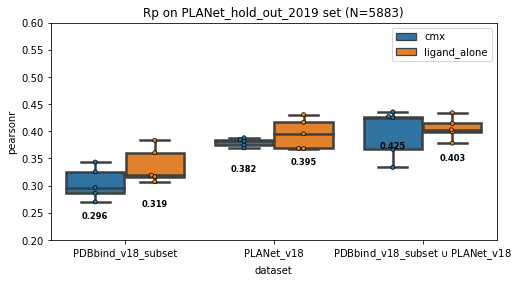

In [11]:
fig, ax= plt.subplots(figsize=(8,4))
sns.boxplot(x="dataset", y=metric, data=sum_df, hue="type", order = models, linewidth=2.5)
sns.swarmplot(x="dataset", y=metric, data=sum_df, hue="type", order = models, size = 4, dodge=True, edgecolor="black", linewidth=0.7)
ax.set_title(f'Rp on PLANet_hold_out_2019 set (N={len(PLANet_hold)})')
# fig.autofmt_xdate()
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles[:2], labels[:2])
vertical_offset = sum_df[metric].median() * 0.15 # offset from median for display
for i, modl in enumerate(models):
    for tp in ['cmx', 'ligand_alone']:
        median_metric = round(grouped_median.loc[(grouped_median['model_name'] == f'{modl}_{tp}')][metric].values[0], 3)
        if tp == 'cmx':
            ax.text(i-.2, median_metric-vertical_offset, median_metric, horizontalalignment='center',size='small', weight='semibold')
        else:
            ax.text(i+.2, median_metric-vertical_offset, median_metric, horizontalalignment='center',size='small',weight='semibold')
ax.set_ylim(0.2,0.6)
ax.set_xticklabels(['PDBbind_v18_subset', 'PLANet_v18', 'PDBbind_v18_subset '+r'$\cup{}$' + ' PLANet_v18'])
plt.savefig(f'/pubhome/xli02/project/PLIM/deep_learning/FAST/fast_plim/hold_out_2019/4-evaluation/test_on_PLANet_hold_out_2019/scaled/{metric}_all_5_repeat_models.png', dpi=300, bbox_inches='tight')
# plt.close()

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

PDBbind_minimized_v18_subset_ligand_alone vs. PLANet_v18_ligand_alone: t-test independent samples, P_val:1.633e-02 t=-3.029e+00
PDBbind_minimized_v18_subset_cmx vs. PLANet_v18_cmx: t-test independent samples, P_val:5.732e-04 t=-5.501e+00


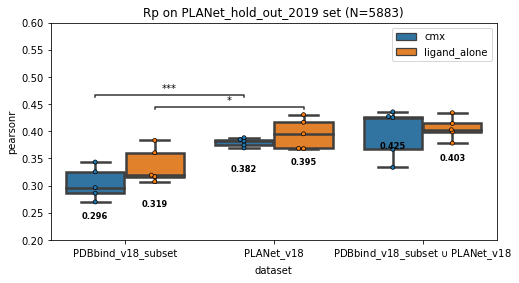

In [259]:
fig, ax= plt.subplots(figsize=(8,4))
sns.boxplot(x="dataset", y=metric, data=sum_df, hue="type", order = models, linewidth=2.5)
sns.swarmplot(x="dataset", y=metric, data=sum_df, hue="type", order = models, size = 4, dodge=True, edgecolor="black", linewidth=0.7)
ax.set_title(f'Rp on PLANet_hold_out_2019 set (N={len(PLANet_hold)})')
# fig.autofmt_xdate()

pairs = [(("PLANet_v18", "ligand_alone"), ("PDBbind_minimized_v18_subset", "ligand_alone")), 
    (("PLANet_v18", "cmx"), ("PDBbind_minimized_v18_subset", "cmx")), 
    ]
annotator = Annotator(ax, pairs, x="dataset", y=metric, data=sum_df, hue="type", order = models)
annotator.configure(test='t-test_ind').apply_and_annotate()

handles, labels = ax.get_legend_handles_labels()
ax.legend(handles[:2], labels[:2])
vertical_offset = sum_df[metric].median() * 0.15 # offset from median for display
for i, modl in enumerate(models):
    for tp in ['cmx', 'ligand_alone']:
        median_metric = round(grouped_median.loc[(grouped_median['model_name'] == f'{modl}_{tp}')][metric].values[0], 3)
        if tp == 'cmx':
            ax.text(i-.2, median_metric-vertical_offset, median_metric, horizontalalignment='center',size='small', weight='semibold')
        else:
            ax.text(i+.2, median_metric-vertical_offset, median_metric, horizontalalignment='center',size='small',weight='semibold')
ax.set_ylim(0.2,0.6)
ax.set_xticklabels(['PDBbind_v18_subset', 'PLANet_v18', 'PDBbind_v18_subset '+r'$\cup{}$' + ' PLANet_v18'])
plt.savefig(f'/pubhome/xli02/project/PLIM/deep_learning/FAST/fast_plim/hold_out_2019/4-evaluation/test_on_PLANet_hold_out_2019/scaled/{metric}_all_5_repeat_models_with_sig.png', dpi=300, bbox_inches='tight')
# plt.close()

# spearmanr

In [12]:
metric='spearmanr'

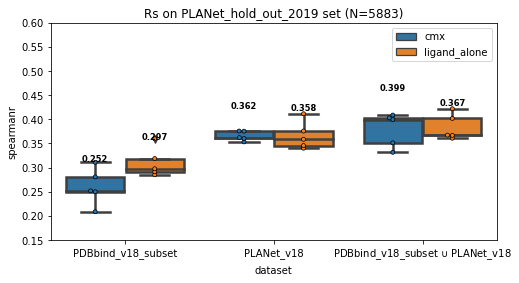

In [15]:
fig, ax= plt.subplots(figsize=(8,4))
sns.boxplot(x="dataset", y=metric, data=sum_df, hue="type", order = models, linewidth=2.5)
sns.swarmplot(x="dataset", y=metric, data=sum_df, hue="type", order = models, size = 4, dodge=True, edgecolor="black", linewidth=0.7)
ax.set_title(f'Rs on PLANet_hold_out_2019 set (N={len(PLANet_hold)})')
# fig.autofmt_xdate()
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles[:2], labels[:2])
vertical_offset = sum_df[metric].median() * 0.17 # offset from median for display
for i, modl in enumerate(models):
    for tp in ['cmx', 'ligand_alone']:
        median_metric = round(grouped_median.loc[(grouped_median['model_name'] == f'{modl}_{tp}')][metric].values[0], 3)
        if tp == 'cmx':
            ax.text(i-.2, median_metric+vertical_offset, median_metric, horizontalalignment='center',size='small', weight='semibold')
        else:
            ax.text(i+.2, median_metric+vertical_offset, median_metric, horizontalalignment='center',size='small',weight='semibold')
ax.set_ylim(0.15,0.6)
ax.set_xticklabels(['PDBbind_v18_subset', 'PLANet_v18', 'PDBbind_v18_subset '+r'$\cup{}$' + ' PLANet_v18'])
plt.savefig(f'/pubhome/xli02/project/PLIM/deep_learning/FAST/fast_plim/hold_out_2019/4-evaluation/test_on_PLANet_hold_out_2019/scaled/{metric}_all_5_repeat_models.png', dpi=300, bbox_inches='tight')
# plt.close()

# rmse

In [16]:
metric='rmse'

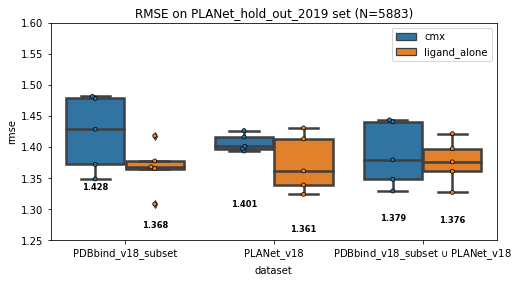

In [19]:
fig, ax= plt.subplots(figsize=(8,4))
sns.boxplot(x="dataset", y=metric, data=sum_df, hue="type", order = models, linewidth=2.5)
sns.swarmplot(x="dataset", y=metric, data=sum_df, hue="type", order = models, size = 4, dodge=True, edgecolor="black", linewidth=0.7)
ax.set_title(f'RMSE on PLANet_hold_out_2019 set (N={len(PLANet_hold)})')
# fig.autofmt_xdate()
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles[:2], labels[:2])
vertical_offset = sum_df[metric].median() * 0.07 # offset from median for display
for i, modl in enumerate(models):
    for tp in ['cmx', 'ligand_alone']:
        median_metric = round(grouped_median.loc[(grouped_median['model_name'] == f'{modl}_{tp}')][metric].values[0], 3)
        if tp == 'cmx':
            ax.text(i-.2, median_metric-vertical_offset, median_metric, horizontalalignment='center',size='small', weight='semibold')
        else:
            ax.text(i+.2, median_metric-vertical_offset, median_metric, horizontalalignment='center',size='small',weight='semibold')
ax.set_ylim(1.25,1.6)
ax.set_xticklabels(['PDBbind_v18_subset', 'PLANet_v18', 'PDBbind_v18_subset '+r'$\cup{}$' + ' PLANet_v18'])
plt.savefig(f'/pubhome/xli02/project/PLIM/deep_learning/FAST/fast_plim/hold_out_2019/4-evaluation/test_on_PLANet_hold_out_2019/scaled/{metric}_all_5_repeat_models.png', dpi=300, bbox_inches='tight')
# plt.close()

# mae

In [260]:
metric='mae'

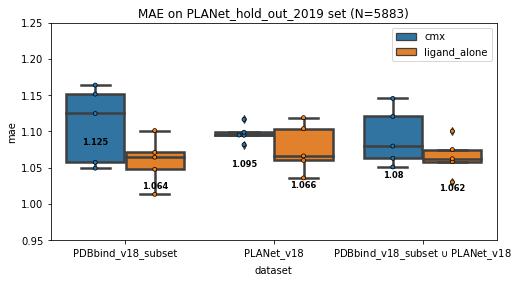

In [21]:
fig, ax= plt.subplots(figsize=(8,4))
sns.boxplot(x="dataset", y=metric, data=sum_df, hue="type", order = models, linewidth=2.5)
sns.swarmplot(x="dataset", y=metric, data=sum_df, hue="type", order = models, size = 4, dodge=True, edgecolor="black", linewidth=0.7)
ax.set_title(f'MAE on PLANet_hold_out_2019 set (N={len(PLANet_hold)})')
# fig.autofmt_xdate()
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles[:2], labels[:2])
vertical_offset = sum_df[metric].median() * 0.04 # offset from median for display
for i, modl in enumerate(models):
    for tp in ['cmx', 'ligand_alone']:
        median_metric = round(grouped_median.loc[(grouped_median['model_name'] == f'{modl}_{tp}')][metric].values[0], 3)
        if tp == 'cmx':
            ax.text(i-.2, median_metric-vertical_offset, median_metric, horizontalalignment='center',size='small', weight='semibold')
        else:
            ax.text(i+.2, median_metric-vertical_offset, median_metric, horizontalalignment='center',size='small',weight='semibold')
ax.set_ylim(0.95,1.25)
ax.set_xticklabels(['PDBbind_v18_subset', 'PLANet_v18', 'PDBbind_v18_subset '+r'$\cup{}$' + ' PLANet_v18'])
plt.savefig(f'/pubhome/xli02/project/PLIM/deep_learning/FAST/fast_plim/hold_out_2019/4-evaluation/test_on_PLANet_hold_out_2019/scaled/{metric}_all_5_repeat_models.png', dpi=300, bbox_inches='tight')
# plt.close()

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

PDBbind_minimized_v18_subset_ligand_alone vs. PLANet_v18_ligand_alone: t-test independent samples, P_val:4.290e-01 t=-8.329e-01
PDBbind_minimized_v18_subset_cmx vs. PLANet_v18_cmx: t-test independent samples, P_val:6.364e-01 t=4.913e-01


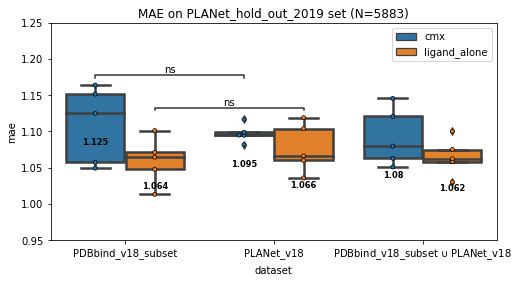

In [261]:
fig, ax= plt.subplots(figsize=(8,4))
sns.boxplot(x="dataset", y=metric, data=sum_df, hue="type", order = models, linewidth=2.5)
sns.swarmplot(x="dataset", y=metric, data=sum_df, hue="type", order = models, size = 4, dodge=True, edgecolor="black", linewidth=0.7)
ax.set_title(f'MAE on PLANet_hold_out_2019 set (N={len(PLANet_hold)})')
# fig.autofmt_xdate()

pairs = [(("PLANet_v18", "ligand_alone"), ("PDBbind_minimized_v18_subset", "ligand_alone")), 
    (("PLANet_v18", "cmx"), ("PDBbind_minimized_v18_subset", "cmx")), 
    ]
annotator = Annotator(ax, pairs, x="dataset", y=metric, data=sum_df, hue="type", order = models)
annotator.configure(test='t-test_ind').apply_and_annotate()

handles, labels = ax.get_legend_handles_labels()
ax.legend(handles[:2], labels[:2])
vertical_offset = sum_df[metric].median() * 0.04 # offset from median for display
for i, modl in enumerate(models):
    for tp in ['cmx', 'ligand_alone']:
        median_metric = round(grouped_median.loc[(grouped_median['model_name'] == f'{modl}_{tp}')][metric].values[0], 3)
        if tp == 'cmx':
            ax.text(i-.2, median_metric-vertical_offset, median_metric, horizontalalignment='center',size='small', weight='semibold')
        else:
            ax.text(i+.2, median_metric-vertical_offset, median_metric, horizontalalignment='center',size='small',weight='semibold')
ax.set_ylim(0.95,1.25)
ax.set_xticklabels(['PDBbind_v18_subset', 'PLANet_v18', 'PDBbind_v18_subset '+r'$\cup{}$' + ' PLANet_v18'])
plt.savefig(f'/pubhome/xli02/project/PLIM/deep_learning/FAST/fast_plim/hold_out_2019/4-evaluation/test_on_PLANet_hold_out_2019/scaled/{metric}_all_5_repeat_models_with_sig.png', dpi=300, bbox_inches='tight')
# plt.close()

# 2. mean of 5 models

In [7]:
mean_pred_df = pd.read_csv('/pubhome/xli02/project/PLIM/deep_learning/FAST/fast_plim/hold_out_2019/4-evaluation/test_on_PLANet_hold_out_2019/mean_of_5_models/6models.csv', sep='\t')
mean_pred_df.shape

(5848, 8)

In [23]:
mean_pred_df.to_csv('/pubhome/xli02/project/PLIM/deep_learning/FAST/fast_plim/hold_out_2019/4-evaluation/test_on_PLANet_hold_out_2019/mean_of_5_models/6models.csv', sep='\t', index=False)
mean_pred_df

,unique_identify,y_true,PDBbind_minimized_v18_subset_cmx_mean,PDBbind_minimized_v18_subset_lig_alone_mean,PLANet_v18_cmx_mean,PLANet_v18_lig_alone_mean,PDBbind_minimized_v18_subset_union_PLANet_v18_cmx_mean,PDBbind_minimized_v18_subset_union_PLANet_v18_lig_alone_mean
0,CHEMBL1075159_5vfd_CHEMBL4298137,6.163784,4.591891,7.908953,5.659244,5.233912,4.765364,6.715659
1,CHEMBL1075317_6dar_CHEMBL4276691,5.899630,7.148279,7.256918,6.614680,6.303780,6.458558,6.291597
2,CHEMBL1075317_6dar_CHEMBL4276791,6.732828,6.990443,6.792884,6.210856,6.567381,6.282051,6.112818
3,CHEMBL1075317_6dar_CHEMBL4276998,5.407823,6.434730,6.496401,5.903846,6.366563,5.755158,5.860175
4,CHEMBL1075317_6dar_CHEMBL4277278,5.142065,6.021873,6.171808,5.457045,6.042192,5.348868,5.876974
...,...,...,...,...,...,...,...,...
5843,CHEMBL6154_5nut_CHEMBL4290134,8.060481,6.792353,6.682149,7.112633,6.723481,7.886823,7.019833
5844,CHEMBL6154_5nut_CHEMBL4447252,7.978811,7.319710,7.187959,7.482897,8.028251,7.786588,8.174462
5845,CHEMBL6154_5nut_CHEMBL4455904,7.920819,7.477999,7.167456,7.315966,7.304956,7.739625,7.760959
5846,CHEMBL6154_5nut_CHEMBL4475367,7.886056,7.019939,6.873158,7.303941,8.132612,7.411905,7.366419


In [12]:
res_dict={}
for model in models:
    for tp in tps:
        r2 = r2_score(y_true=mean_pred_df['y_true'], y_pred=mean_pred_df[f'{model}_{tp}_mean'])
        mae = mean_absolute_error(y_true=mean_pred_df['y_true'], y_pred=mean_pred_df[f'{model}_{tp}_mean'])
        mse = mean_squared_error(y_true=mean_pred_df['y_true'], y_pred=mean_pred_df[f'{model}_{tp}_mean'])
        pearsonr = stats.pearsonr(mean_pred_df['y_true'], mean_pred_df[f'{model}_{tp}_mean'])[0]
        spearmanr = stats.spearmanr(mean_pred_df['y_true'], mean_pred_df[f'{model}_{tp}_mean'])[0]
        res_dict[f'{model}_{tp}']=[r2, mae, mse, pearsonr, spearmanr]

com_sum_df = pd.DataFrame.from_dict(res_dict, orient='index', columns=['r2', 'mae', 'mse', 'pearsonr', 'spearmanr']).reset_index()
com_sum_df.rename(columns={"index": "model_names_test_type"}, inplace=True)
com_sum_df['type'] = ['cmx' if 'cmx' in m else 'lig_alone' for m in com_sum_df['model_names_test_type']]
com_sum_df['dataset'] = ['_'.join(m.split('_')[:-1]) if 'cmx' in m else '_'.join(m.split('_')[:-2]) for m in com_sum_df['model_names_test_type']]
com_sum_df.to_csv('/pubhome/xli02/project/PLIM/deep_learning/FAST/fast_plim/hold_out_2019/4-evaluation/test_on_PLANet_hold_out_2019/mean_of_5_models/6models_metric.csv', sep='\t', index=False)
com_sum_df

,model_names_test_type,r2,mae,mse,pearsonr,spearmanr,type,dataset
0,PDBbind_minimized_v18_subset_cmx,0.025826,1.046493,1.833360,0.342732,0.295599,cmx,PDBbind_minimized_v18_subset
1,PDBbind_minimized_v18_subset_lig_alone,0.075572,1.022028,1.739739,0.381517,0.355823,lig_alone,PDBbind_minimized_v18_subset
2,PLANet_v18_cmx,0.112144,1.008229,1.670913,0.440995,0.421022,cmx,PLANet_v18
3,PLANet_v18_lig_alone,0.172846,0.976529,1.556673,0.469723,0.427757,lig_alone,PLANet_v18
4,PDBbind_minimized_v18_subset_union_PLANet_v18_cmx,0.139085,0.999196,1.620211,0.462867,0.438877,cmx,PDBbind_minimized_v18_subset_union_PLANet_v18
5,PDBbind_minimized_v18_subset_union_PLANet_v18_...,0.191044,0.953835,1.522426,0.483646,0.455463,lig_alone,PDBbind_minimized_v18_subset_union_PLANet_v18


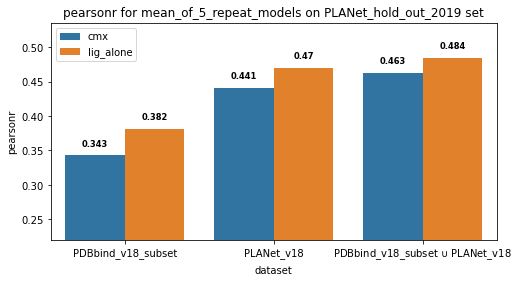

In [28]:
metric='pearsonr'
fig, ax= plt.subplots(figsize=(8,4))
sns.barplot(x="dataset", y=metric, hue='type', data=com_sum_df)

ax.set_title(f'{metric} for mean_of_5_repeat_models on PLANet_hold_out_2019 set')
vertical_offset = com_sum_df[metric].median() * 0.03 # offset from median for display
for i, modl in enumerate(models):
    for tp in ['cmx', 'lig_alone']:
        median_metric = round(com_sum_df.loc[(com_sum_df['model_names_test_type'] == f'{modl}_{tp}')][metric].values[0], 3)
        if tp == 'cmx':
            ax.text(i-.2, median_metric+vertical_offset, median_metric, horizontalalignment='center',size='small', weight='semibold')
        else:
            ax.text(i+.2, median_metric+vertical_offset, median_metric, horizontalalignment='center',size='small',weight='semibold')
ax.set_ylim(min(sum_df[metric])-0.05, min(max(sum_df[metric])+0.1, 1))
ax.legend(loc='upper left')
ax.set_xticklabels(['PDBbind_v18_subset', 'PLANet_v18', 'PDBbind_v18_subset '+r'$\cup{}$' + ' PLANet_v18'])
plt.savefig(f'/pubhome/xli02/project/PLIM/deep_learning/FAST/fast_plim/hold_out_2019/4-evaluation/test_on_PLANet_hold_out_2019/mean_of_5_models/{metric}_mean_of_5_repeat_models.png', dpi=300, bbox_inches='tight')
# plt.close()

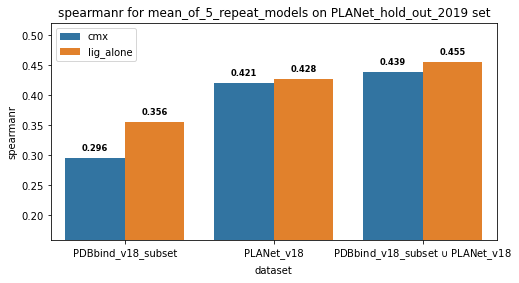

In [13]:
metric='spearmanr'
fig, ax= plt.subplots(figsize=(8,4))
sns.barplot(x="dataset", y=metric, hue='type', data=com_sum_df)

ax.set_title(f'{metric} for mean_of_5_repeat_models on PLANet_hold_out_2019 set')
vertical_offset = com_sum_df[metric].median() * 0.03 # offset from median for display
for i, modl in enumerate(models):
    for tp in ['cmx', 'lig_alone']:
        median_metric = round(com_sum_df.loc[(com_sum_df['model_names_test_type'] == f'{modl}_{tp}')][metric].values[0], 3)
        if tp == 'cmx':
            ax.text(i-.2, median_metric+vertical_offset, median_metric, horizontalalignment='center',size='small', weight='semibold')
        else:
            ax.text(i+.2, median_metric+vertical_offset, median_metric, horizontalalignment='center',size='small',weight='semibold')
ax.set_ylim(min(sum_df[metric])-0.05, min(max(sum_df[metric])+0.1, 1))
ax.legend(loc='upper left')
ax.set_xticklabels(['PDBbind_v18_subset', 'PLANet_v18', 'PDBbind_v18_subset '+r'$\cup{}$' + ' PLANet_v18'])
plt.savefig(f'/pubhome/xli02/project/PLIM/deep_learning/FAST/fast_plim/hold_out_2019/4-evaluation/test_on_PLANet_hold_out_2019/mean_of_5_models/{metric}_mean_of_5_repeat_models.png', dpi=300, bbox_inches='tight')
# plt.close()

# 散点图

In [6]:
from scipy.stats import gaussian_kde

In [15]:
simple_dict = {'PDBbind_minimized_v18_subset':'PDBbind_v18_subset', 'PDBbind_minimized_v18_subset_union_PLANet_v18':'PDBbind_v18_subset '+r'$\cup{}$' + ' PLANet_v18','PLANet_v18':'PLANet_v18'}

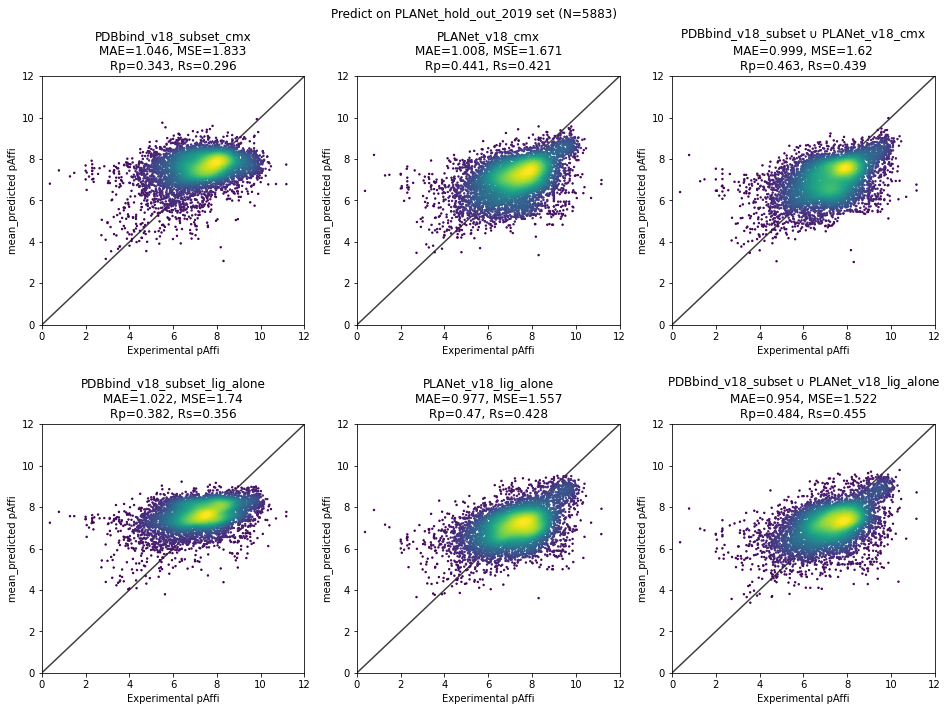

In [31]:
fig = plt.figure(figsize=(16,16))
for i, model in enumerate(models):
    for j, tp in enumerate(tps):
        # print((i+1)+6*j)
        ax = fig.add_subplot(3, 3, (i+1)+3*j)
        # fig, ax = plt.subplots(figsize=(6,6))
        y_true = mean_pred_df['y_true']
        y_pred = mean_pred_df[f'{model}_{tp}_mean']

        xy = np.vstack([y_true.T, y_pred.T])
        z = gaussian_kde(xy)(xy)

        # Sort the points by density, so that the densest points are plotted last
        idx = z.argsort()
        y_true_, y_pred_, z = y_true[idx], y_pred[idx], z[idx]

        #https://github.com/hnlab/handbook/blob/41ad374cd0f9dc3ef882a7724eaac3d1f748fc05/0-General-computing-skills/MISC/vsfig.py#L83-L134
        # fig, ax = plt.subplots()
        ax.scatter(y_true_, y_pred_, s=2, c=z, zorder=2)

        # sns.scatterplot(x='y_true', y=f'{model}_{tp}_mean', data=mean_pred_df)
        lims = [0,12]
        ax.set_xlim(lims)
        ax.set_ylim(lims)
        ax.plot(lims, lims, "k-", alpha=0.75, zorder=0)
        ax.set_ylabel(f'mean_predicted pAffi')
        ax.set_xlabel('Experimental pAffi')
        ax.set_title(f'{simple_dict[model]}_{tp}\nMAE={round(com_sum_df[com_sum_df["model_names_test_type"]==f"{model}_{tp}"]["mae"].values[0], 3)}, MSE={round(com_sum_df[com_sum_df["model_names_test_type"]==f"{model}_{tp}"]["mse"].values[0], 3)}\nRp={round(com_sum_df[com_sum_df["model_names_test_type"]==f"{model}_{tp}"]["pearsonr"].values[0], 3)}, Rs={round(com_sum_df[com_sum_df["model_names_test_type"]==f"{model}_{tp}"]["spearmanr"].values[0], 3)}')
# plt.subplots_adjust(left=0.125,
#                     bottom=0.1, 
#                     right=0.9, 
#                     top=0.87, 
#                     wspace=1, 
#                     hspace=0.8)
plt.subplots_adjust(left=0.125,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.92, 
                    wspace=0.2, 
                    hspace=0.4)
plt.suptitle(f'Predict on PLANet_hold_out_2019 set (N={len(PLANet_hold)})')
plt.savefig('/pubhome/xli02/project/PLIM/deep_learning/FAST/fast_plim/hold_out_2019/4-evaluation/test_on_PLANet_hold_out_2019/mean_of_5_models/scatter_6_models.png', dpi=300, bbox_inches='tight')

# PDBbind_v18_subset vs PLANet_v18

# Mw - mean_predicted_pAffi

In [8]:
mean_pred_df_with_prop = pd.merge(mean_pred_df.round({'y_true': 2}), PLANet_hold_property.rename(columns={'-logAffi':'y_true'}).round({'y_true': 2}), on=['unique_identify', 'y_true'])
mean_pred_df_with_prop

,unique_identify,y_true,PDBbind_minimized_v18_subset_cmx_mean,PDBbind_minimized_v18_subset_lig_alone_mean,PLANet_v18_cmx_mean,PLANet_v18_lig_alone_mean,PDBbind_minimized_v18_subset_union_PLANet_v18_cmx_mean,PDBbind_minimized_v18_subset_union_PLANet_v18_lig_alone_mean,Target_chembl_id,Cry_lig_name,...,MCS_smarts,target_compnd,mw,logp,rotb,hbd,hba,q,HA,dataset
0,CHEMBL1075159_5vfd_CHEMBL4298137,6.16,4.591891,7.908953,5.659244,5.233912,4.765364,6.715659,CHEMBL1075159,5vfd,...,[#6]1=&@[#6]-&@[#6](-&!@[#6](=&!@[#8])-&!@[#7]...,CHEMBL1075159_CHEMBL4298137,276.250,-1.7018,3.0,1.0,6.0,-1.0,18.0,PLANet
1,CHEMBL1075317_6dar_CHEMBL4276691,5.90,7.148279,7.256918,6.614680,6.303780,6.458558,6.291597,CHEMBL1075317,6dar,...,[#8]=&!@[#6](-&!@[#6]1:&@[#6]:&@[#6]:&@[#6]:&@...,CHEMBL1075317_CHEMBL4276691,415.537,4.9474,7.0,0.0,4.0,0.0,31.0,PLANet
2,CHEMBL1075317_6dar_CHEMBL4276791,6.73,6.990443,6.792884,6.210856,6.567381,6.282051,6.112818,CHEMBL1075317,6dar,...,[#6]-&!@[#8]-&!@[#6]1:&@[#6]:&@[#6]:&@[#6]:&@[...,CHEMBL1075317_CHEMBL4276791,390.487,3.5009,6.0,1.0,5.0,0.0,29.0,PLANet
3,CHEMBL1075317_6dar_CHEMBL4276998,5.41,6.434730,6.496401,5.903846,6.366563,5.755158,5.860175,CHEMBL1075317,6dar,...,[#8]=&!@[#6](-&!@[#7]-&!@[#6]-&!@[#6]1:&@[#6]:...,CHEMBL1075317_CHEMBL4276998,318.380,2.8213,4.0,1.0,4.0,0.0,24.0,PLANet
4,CHEMBL1075317_6dar_CHEMBL4277278,5.14,6.021873,6.171808,5.457045,6.042192,5.348868,5.876974,CHEMBL1075317,6dar,...,[#8]=&!@[#6](-&!@[#7]-&!@[#6]-&!@[#6]1:&@[#6]:...,CHEMBL1075317_CHEMBL4277278,317.392,3.4263,4.0,1.0,3.0,0.0,24.0,PLANet
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5843,CHEMBL6154_5nut_CHEMBL4290134,8.06,6.792353,6.682149,7.112633,6.723481,7.886823,7.019833,CHEMBL6154,5nut,...,[#6]1:&@[#6]:&@[#6]:&@[#6](:&@[#6]:&@[#6]:&@1)...,CHEMBL6154_CHEMBL4290134,278.355,3.8876,1.0,1.0,2.0,0.0,21.0,PLANet
5844,CHEMBL6154_5nut_CHEMBL4447252,7.98,7.319710,7.187959,7.482897,8.028251,7.786588,8.174462,CHEMBL6154,5nut,...,[#6]1:&@[#6]:&@[#6]:&@[#6](:&@[#6]:&@[#6]:&@1)...,CHEMBL6154_CHEMBL4447252,298.317,2.9566,2.0,2.0,3.0,0.0,22.0,PLANet
5845,CHEMBL6154_5nut_CHEMBL4455904,7.92,7.477999,7.167456,7.315966,7.304956,7.739625,7.760959,CHEMBL6154,5nut,...,[#6]1:&@[#6]:&@[#6]:&@[#6](:&@[#6]:&@[#6]:&@1)...,CHEMBL6154_CHEMBL4455904,339.394,1.0639,2.0,2.0,3.0,1.0,25.0,PLANet
5846,CHEMBL6154_5nut_CHEMBL4475367,7.89,7.019939,6.873158,7.303941,8.132612,7.411905,7.366419,CHEMBL6154,5nut,...,[#6]1:&@[#6]:&@[#6]:&@[#6](:&@[#6]:&@[#6]:&@1)...,CHEMBL6154_CHEMBL4475367,280.327,2.8175,2.0,2.0,3.0,0.0,21.0,PLANet


In [9]:
max(mean_pred_df_with_prop['mw'])

866.4509999999989

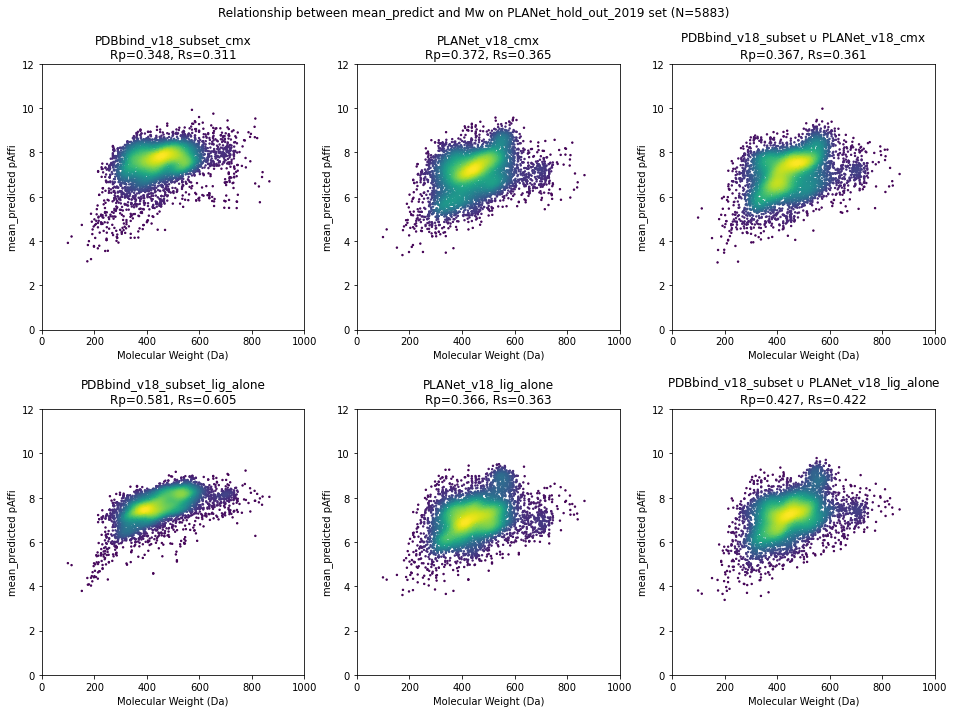

In [34]:
fig = plt.figure(figsize=(16,16))
for i, model in enumerate(models):
    for j, tp in enumerate(tps):
        # print((i+1)+6*j)
        ax = fig.add_subplot(3, 3, (i+1)+3*j)
        # fig, ax = plt.subplots(figsize=(6,6))

        y_true = mean_pred_df_with_prop['mw']
        y_pred = mean_pred_df_with_prop[f'{model}_{tp}_mean']

        xy = np.vstack([y_true.T, y_pred.T])
        z = gaussian_kde(xy)(xy)

        # Sort the points by density, so that the densest points are plotted last
        idx = z.argsort()
        y_true_, y_pred_, z = y_true[idx], y_pred[idx], z[idx]

        #https://github.com/hnlab/handbook/blob/41ad374cd0f9dc3ef882a7724eaac3d1f748fc05/0-General-computing-skills/MISC/vsfig.py#L83-L134
        # fig, ax = plt.subplots()
        ax.scatter(y_true_, y_pred_, s=2, c=z, zorder=2)

        # sns.scatterplot(x='mw', y=f'{model}_{tp}_mean', data=mean_pred_df_with_prop)

        # if model=='PDBbind_minimized_intersected_Uw':
        #     ax.axvline(x=800, color='black', linestyle='--')

        ax.set_xlim(0, 1000)
        ax.set_ylim(0, 12)

        ax.set_ylabel(f'mean_predicted pAffi')
        ax.set_xlabel('Molecular Weight (Da)')
        ax.set_title(f'{simple_dict[model]}_{tp}\nRp={round(stats.pearsonr(mean_pred_df_with_prop[f"{model}_{tp}_mean"], mean_pred_df_with_prop["mw"])[0], 3)}, Rs={round(stats.spearmanr(mean_pred_df_with_prop[f"{model}_{tp}_mean"], mean_pred_df_with_prop["mw"])[0], 3)}')
plt.subplots_adjust(left=0.125,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.93, 
                    wspace=0.2, 
                    hspace=0.3)
plt.suptitle(f'Relationship between mean_predict and Mw on PLANet_hold_out_2019 set (N={len(PLANet_hold_property)})')
plt.savefig('/pubhome/xli02/project/PLIM/deep_learning/FAST/fast_plim/hold_out_2019/4-evaluation/test_on_PLANet_hold_out_2019/mean_of_5_models/mw/scatter_for_12_models.png', dpi=300, bbox_inches='tight')

# HA

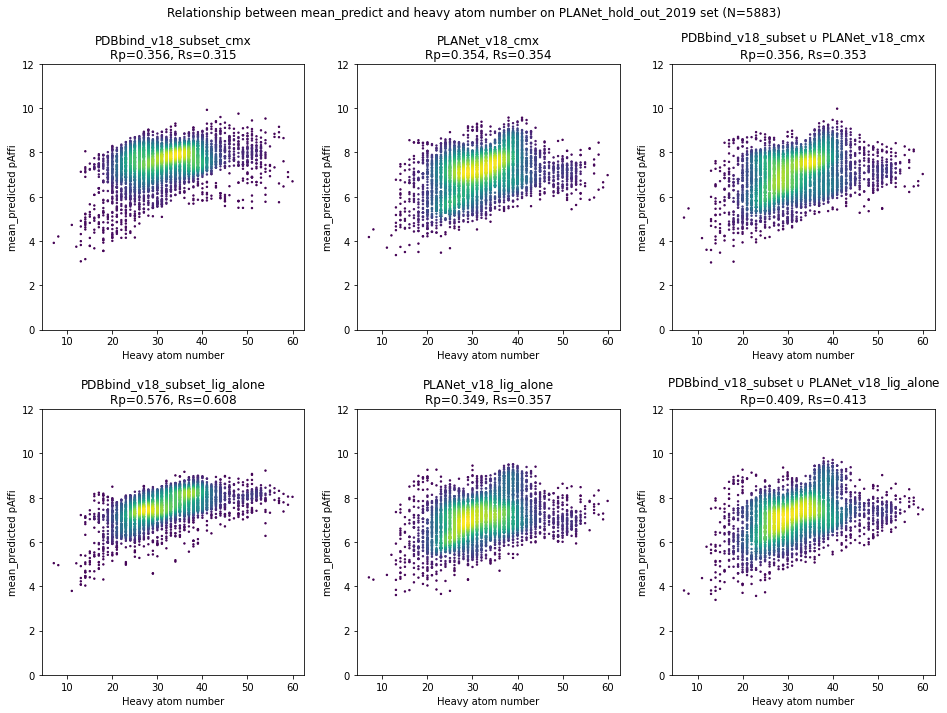

In [18]:
fig = plt.figure(figsize=(16,16))
for i, model in enumerate(models):
    for j, tp in enumerate(tps):
        # print((i+1)+6*j)
        ax = fig.add_subplot(3, 3, (i+1)+3*j)
        # fig, ax = plt.subplots(figsize=(6,6))

        y_true = mean_pred_df_with_prop['HA']
        y_pred = mean_pred_df_with_prop[f'{model}_{tp}_mean']

        xy = np.vstack([y_true.T, y_pred.T])
        z = gaussian_kde(xy)(xy)

        # Sort the points by density, so that the densest points are plotted last
        idx = z.argsort()
        y_true_, y_pred_, z = y_true[idx], y_pred[idx], z[idx]

        #https://github.com/hnlab/handbook/blob/41ad374cd0f9dc3ef882a7724eaac3d1f748fc05/0-General-computing-skills/MISC/vsfig.py#L83-L134
        # fig, ax = plt.subplots()
        ax.scatter(y_true_, y_pred_, s=2, c=z, zorder=2)

        # sns.scatterplot(x='mw', y=f'{model}_{tp}_mean', data=mean_pred_df_with_prop)

        # if model=='PDBbind_minimized_intersected_Uw':
        #     ax.axvline(x=800, color='black', linestyle='--')

        # ax.set_xlim(0, 1000)
        ax.set_ylim(0, 12)

        ax.set_ylabel(f'mean_predicted pAffi')
        ax.set_xlabel('Heavy atom number')
        ax.set_title(f'{simple_dict[model]}_{tp}\nRp={round(stats.pearsonr(mean_pred_df_with_prop[f"{model}_{tp}_mean"], mean_pred_df_with_prop["HA"])[0], 3)}, Rs={round(stats.spearmanr(mean_pred_df_with_prop[f"{model}_{tp}_mean"], mean_pred_df_with_prop["HA"])[0], 3)}')
plt.subplots_adjust(left=0.125,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.93, 
                    wspace=0.2, 
                    hspace=0.3)
plt.suptitle(f'Relationship between mean_predict and heavy atom number on PLANet_hold_out_2019 set (N={len(PLANet_hold_property)})')
plt.savefig('/pubhome/xli02/project/PLIM/deep_learning/FAST/fast_plim/hold_out_2019/4-evaluation/test_on_PLANet_hold_out_2019/mean_of_5_models/HA/scatter_for_12_models.png', dpi=300, bbox_inches='tight')

# SASA

In [13]:
PLANet_whole_sasa = pd.read_csv('/pubhome/xli02/project/PLIM/analysis/20220812_paper/SASA/PLANet_property_sasa.csv')
len(PLANet_whole_sasa)

69813

In [268]:
min(PLANet_whole_sasa['del_sasa'])

2.5643768310546875

In [269]:
max(PLANet_whole_sasa['del_sasa'])

17.663604736328125

In [271]:
mean_pred_df_with_prop_sasa = pd.merge(mean_pred_df_with_prop, PLANet_whole_sasa.rename(columns={'unique_identity':'unique_identify'}), on=['unique_identify'])
mean_pred_df_with_prop_sasa

,unique_identify,y_true,PDBbind_minimized_v18_subset_cmx_mean,PDBbind_minimized_v18_subset_lig_alone_mean,PLANet_v18_cmx_mean,PLANet_v18_lig_alone_mean,PDBbind_minimized_v18_subset_union_PLANet_v18_cmx_mean,PDBbind_minimized_v18_subset_union_PLANet_v18_lig_alone_mean,Target_chembl_id,Cry_lig_name,...,rotb,hbd,hba,q,HA,dataset,lig_sasa,rec_sasa,com_sasa,del_sasa
0,CHEMBL1075159_5vfd_CHEMBL4298137,6.16,4.591891,7.908953,5.659244,5.233912,4.765364,6.715659,CHEMBL1075159,5vfd,...,3.0,1.0,6.0,-1.0,18.0,PLANet,4.352722,116.983307,117.381462,3.954567
1,CHEMBL1075317_6dar_CHEMBL4276691,5.90,7.148279,7.256918,6.614680,6.303780,6.458558,6.291597,CHEMBL1075317,6dar,...,7.0,0.0,4.0,0.0,31.0,PLANet,7.331711,121.030014,119.910301,8.451424
2,CHEMBL1075317_6dar_CHEMBL4276791,6.73,6.990443,6.792884,6.210856,6.567381,6.282051,6.112818,CHEMBL1075317,6dar,...,6.0,1.0,5.0,0.0,29.0,PLANet,7.076402,121.030014,119.456192,8.650223
3,CHEMBL1075317_6dar_CHEMBL4276998,5.41,6.434730,6.496401,5.903846,6.366563,5.755158,5.860175,CHEMBL1075317,6dar,...,4.0,1.0,4.0,0.0,24.0,PLANet,5.970962,121.030014,119.655838,7.345139
4,CHEMBL1075317_6dar_CHEMBL4277278,5.14,6.021873,6.171808,5.457045,6.042192,5.348868,5.876974,CHEMBL1075317,6dar,...,4.0,1.0,3.0,0.0,24.0,PLANet,6.025649,121.030014,119.667206,7.388458
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5843,CHEMBL6154_5nut_CHEMBL4290134,8.06,6.792353,6.682149,7.112633,6.723481,7.886823,7.019833,CHEMBL6154,5nut,...,1.0,1.0,2.0,0.0,21.0,PLANet,5.260872,105.053558,103.275436,7.038994
5844,CHEMBL6154_5nut_CHEMBL4447252,7.98,7.319710,7.187959,7.482897,8.028251,7.786588,8.174462,CHEMBL6154,5nut,...,2.0,2.0,3.0,0.0,22.0,PLANet,5.282109,105.053558,103.283417,7.052254
5845,CHEMBL6154_5nut_CHEMBL4455904,7.92,7.477999,7.167456,7.315966,7.304956,7.739625,7.760959,CHEMBL6154,5nut,...,2.0,2.0,3.0,1.0,25.0,PLANet,5.913883,105.053558,103.230865,7.736572
5846,CHEMBL6154_5nut_CHEMBL4475367,7.89,7.019939,6.873158,7.303941,8.132612,7.411905,7.366419,CHEMBL6154,5nut,...,2.0,2.0,3.0,0.0,21.0,PLANet,5.173090,105.053558,103.280464,6.946182


In [272]:
min(mean_pred_df_with_prop_sasa['del_sasa'])

3.0491485595703125

In [273]:
max(mean_pred_df_with_prop_sasa['del_sasa'])

15.806243896484375

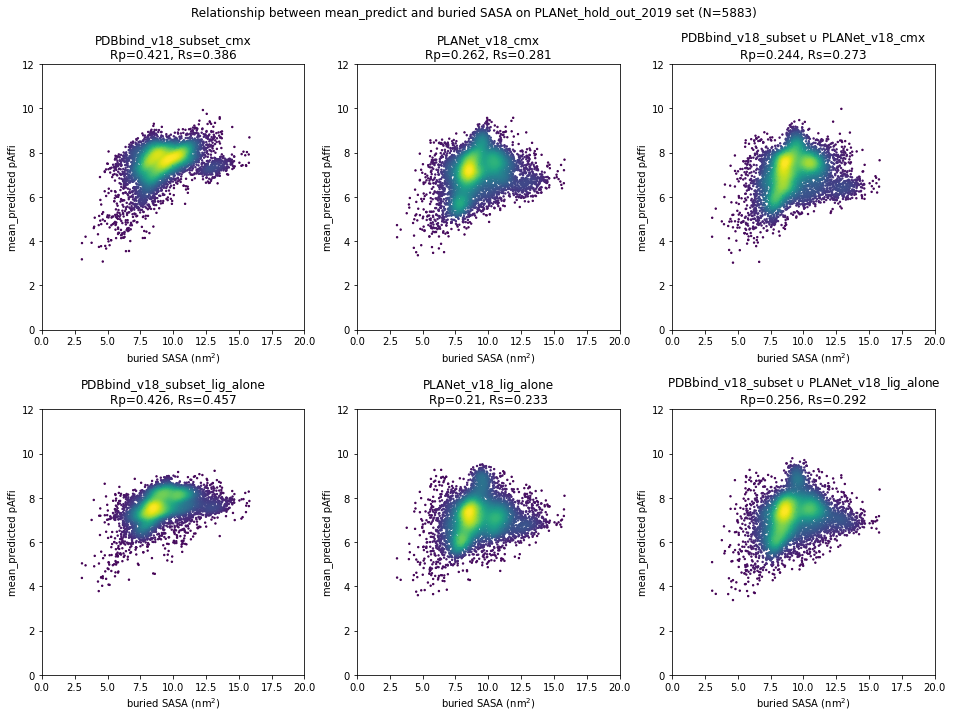

In [275]:
fig = plt.figure(figsize=(16,16))
for i, model in enumerate(models):
    for j, tp in enumerate(tps):
        # print((i+1)+6*j)
        ax = fig.add_subplot(3, 3, (i+1)+3*j)
        # fig, ax = plt.subplots(figsize=(6,6))

        y_true = mean_pred_df_with_prop_sasa['del_sasa']
        y_pred = mean_pred_df_with_prop_sasa[f'{model}_{tp}_mean']

        xy = np.vstack([y_true.T, y_pred.T])
        z = gaussian_kde(xy)(xy)

        # Sort the points by density, so that the densest points are plotted last
        idx = z.argsort()
        y_true_, y_pred_, z = y_true[idx], y_pred[idx], z[idx]

        #https://github.com/hnlab/handbook/blob/41ad374cd0f9dc3ef882a7724eaac3d1f748fc05/0-General-computing-skills/MISC/vsfig.py#L83-L134
        # fig, ax = plt.subplots()
        ax.scatter(y_true_, y_pred_, s=2, c=z, zorder=2)

        # sns.scatterplot(x='mw', y=f'{model}_{tp}_mean', data=mean_pred_df_with_prop)

        # if model=='PDBbind_minimized_intersected_Uw':
        #     ax.axvline(x=800, color='black', linestyle='--')

        ax.set_xlim(0, 20)
        ax.set_ylim(0, 12)

        ax.set_ylabel(f'mean_predicted pAffi')
        ax.set_xlabel('buried SASA (nm$\mathregular{^2}$)')
        ax.set_title(f'{simple_dict[model]}_{tp}\nRp={round(stats.pearsonr(mean_pred_df_with_prop_sasa[f"{model}_{tp}_mean"], mean_pred_df_with_prop_sasa["del_sasa"])[0], 3)}, Rs={round(stats.spearmanr(mean_pred_df_with_prop_sasa[f"{model}_{tp}_mean"], mean_pred_df_with_prop_sasa["del_sasa"])[0], 3)}')
plt.subplots_adjust(left=0.125,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.93, 
                    wspace=0.2, 
                    hspace=0.3)
plt.suptitle(f'Relationship between mean_predict and buried SASA on PLANet_hold_out_2019 set (N={len(PLANet_hold_property)})')
plt.savefig('/pubhome/xli02/project/PLIM/deep_learning/FAST/fast_plim/hold_out_2019/4-evaluation/test_on_PLANet_hold_out_2019/mean_of_5_models/SASA/scatter_for_12_models.png', dpi=300, bbox_inches='tight')

# logp

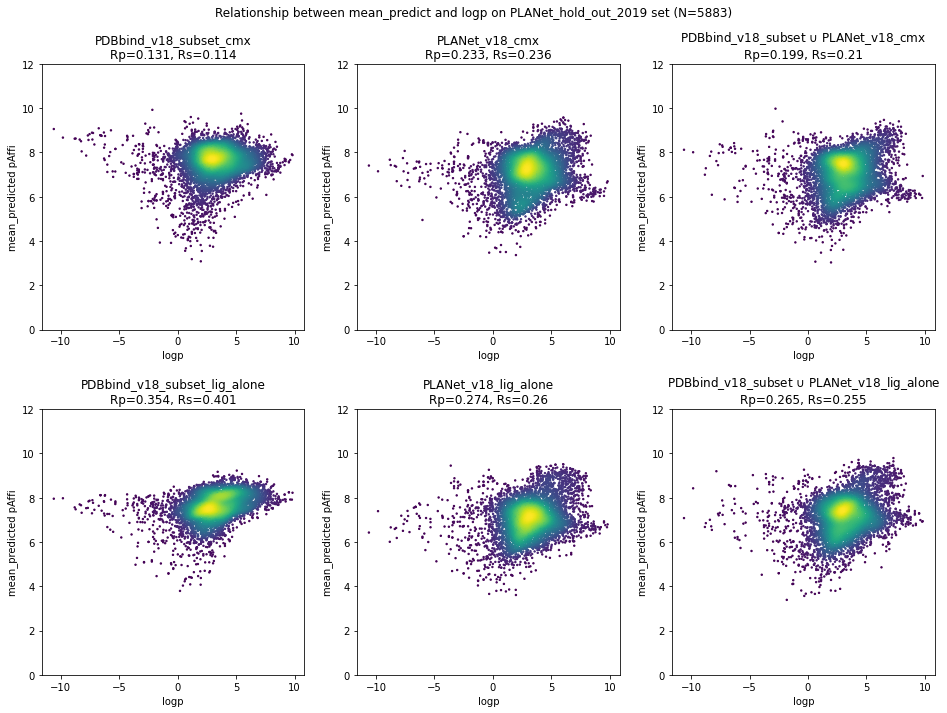

In [19]:
fig = plt.figure(figsize=(16,16))
for i, model in enumerate(models):
    for j, tp in enumerate(tps):
        # print((i+1)+6*j)
        ax = fig.add_subplot(3, 3, (i+1)+3*j)
        # fig, ax = plt.subplots(figsize=(6,6))

        y_true = mean_pred_df_with_prop['logp']
        y_pred = mean_pred_df_with_prop[f'{model}_{tp}_mean']

        xy = np.vstack([y_true.T, y_pred.T])
        z = gaussian_kde(xy)(xy)

        # Sort the points by density, so that the densest points are plotted last
        idx = z.argsort()
        y_true_, y_pred_, z = y_true[idx], y_pred[idx], z[idx]

        #https://github.com/hnlab/handbook/blob/41ad374cd0f9dc3ef882a7724eaac3d1f748fc05/0-General-computing-skills/MISC/vsfig.py#L83-L134
        # fig, ax = plt.subplots()
        ax.scatter(y_true_, y_pred_, s=2, c=z, zorder=2)

        # sns.scatterplot(x='mw', y=f'{model}_{tp}_mean', data=mean_pred_df_with_prop)

        # if model=='PDBbind_minimized_intersected_Uw':
        #     ax.axvline(x=800, color='black', linestyle='--')

        # ax.set_xlim(0, 1000)
        ax.set_ylim(0, 12)

        ax.set_ylabel(f'mean_predicted pAffi')
        ax.set_xlabel('logp')
        ax.set_title(f'{simple_dict[model]}_{tp}\nRp={round(stats.pearsonr(mean_pred_df_with_prop[f"{model}_{tp}_mean"], mean_pred_df_with_prop["logp"])[0], 3)}, Rs={round(stats.spearmanr(mean_pred_df_with_prop[f"{model}_{tp}_mean"], mean_pred_df_with_prop["logp"])[0], 3)}')
plt.subplots_adjust(left=0.125,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.93, 
                    wspace=0.2, 
                    hspace=0.3)
plt.suptitle(f'Relationship between mean_predict and logp on PLANet_hold_out_2019 set (N={len(PLANet_hold_property)})')
plt.savefig('/pubhome/xli02/project/PLIM/deep_learning/FAST/fast_plim/hold_out_2019/4-evaluation/test_on_PLANet_hold_out_2019/mean_of_5_models/logp/scatter_for_12_models.png', dpi=300, bbox_inches='tight')

# 3. property distribution of PLANet_hold_out_2019

In [23]:
# PLANet_hold_property

In [24]:
PLANet_hold_property.reset_index(inplace=True, drop=True)

In [32]:
max(PLANet_hold_property['-logAffi'])

11.173925197299173

# MW

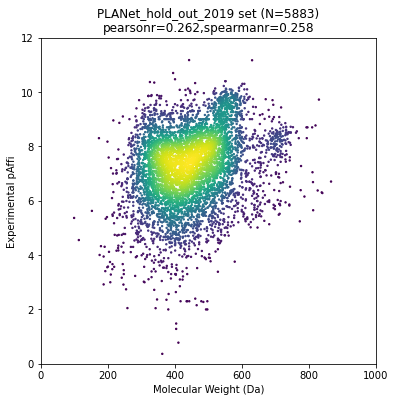

In [33]:
# RIP_minimized_PCV.reset_index(drop=True, inplace=True)
pearsonr = round(stats.pearsonr(PLANet_hold_property['mw'], PLANet_hold_property['-logAffi'])[0],3)
spearmanr = round(stats.spearmanr(PLANet_hold_property['mw'], PLANet_hold_property['-logAffi'])[0],3)

xy = np.vstack([PLANet_hold_property['mw'], PLANet_hold_property['-logAffi']])  #按行叠加
g = gaussian_kde(xy)  #根据xy进行核密度估计(kde) -> 关于xy的概率密度函数
z = g(xy)  #计算每个xy样本点的概率密度

# Sort the points by density, so that the densest points are plotted last
idx = z.argsort()  #对z值排序并返回索引
y, y_, z = PLANet_hold_property['mw'][idx], PLANet_hold_property['-logAffi'][idx], z[idx]  #对y, y_根据z的大小进行排序

fig, ax = plt.subplots(figsize=(6,6))
ax.scatter(y, y_, s=2, c=z, zorder=2)
ax.set_xlabel('Molecular Weight (Da)')
ax.set_ylabel('Experimental pAffi')
ax.set_xlim(0,1000)
ax.set_ylim(0,12)
plt.title(f'PLANet_hold_out_2019 set (N={len(PLANet_hold_property)})\npearsonr={pearsonr},spearmanr={spearmanr}')
plt.savefig('/pubhome/xli02/project/PLIM/deep_learning/FAST/fast_plim/hold_out_2019/4-evaluation/test_on_PLANet_hold_out_2019/property_distribution/Mw_pAffi_scaled_1000.png', dpi=300, bbox_inches='tight')

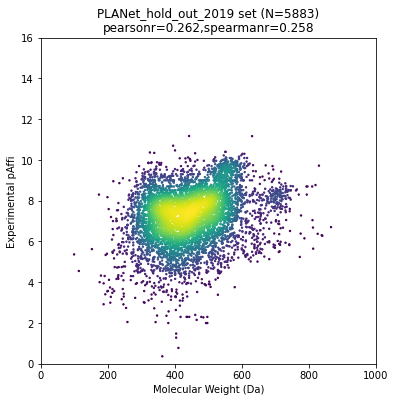

In [315]:
# RIP_minimized_PCV.reset_index(drop=True, inplace=True)
pearsonr = round(stats.pearsonr(PLANet_hold_property['mw'], PLANet_hold_property['-logAffi'])[0],3)
spearmanr = round(stats.spearmanr(PLANet_hold_property['mw'], PLANet_hold_property['-logAffi'])[0],3)

xy = np.vstack([PLANet_hold_property['mw'], PLANet_hold_property['-logAffi']])  #按行叠加
g = gaussian_kde(xy)  #根据xy进行核密度估计(kde) -> 关于xy的概率密度函数
z = g(xy)  #计算每个xy样本点的概率密度

# Sort the points by density, so that the densest points are plotted last
idx = z.argsort()  #对z值排序并返回索引
y, y_, z = PLANet_hold_property['mw'][idx], PLANet_hold_property['-logAffi'][idx], z[idx]  #对y, y_根据z的大小进行排序

fig, ax = plt.subplots(figsize=(6,6))
ax.scatter(y, y_, s=2, c=z, zorder=2)
ax.set_xlabel('Molecular Weight (Da)')
ax.set_ylabel('Experimental pAffi')
ax.set_xlim(0,1000)
ax.set_ylim(0,16)
plt.title(f'PLANet_hold_out_2019 set (N={len(PLANet_hold_property)})\npearsonr={pearsonr},spearmanr={spearmanr}')
plt.savefig('/pubhome/xli02/project/PLIM/deep_learning/FAST/fast_plim/hold_out_2019/4-evaluation/test_on_PLANet_hold_out_2019/property_distribution/Mw_pAffi_scaled_1000_16.png', dpi=300, bbox_inches='tight')

# HA

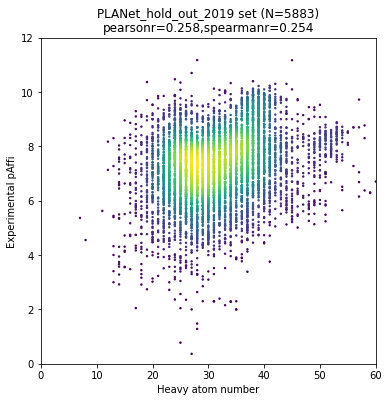

In [34]:
# RIP_minimized_PCV.reset_index(drop=True, inplace=True)
pearsonr = round(stats.pearsonr(PLANet_hold_property['HA'], PLANet_hold_property['-logAffi'])[0],3)
spearmanr = round(stats.spearmanr(PLANet_hold_property['HA'], PLANet_hold_property['-logAffi'])[0],3)

xy = np.vstack([PLANet_hold_property['HA'], PLANet_hold_property['-logAffi']])  #按行叠加
g = gaussian_kde(xy)  #根据xy进行核密度估计(kde) -> 关于xy的概率密度函数
z = g(xy)  #计算每个xy样本点的概率密度

# Sort the points by density, so that the densest points are plotted last
idx = z.argsort()  #对z值排序并返回索引
y, y_, z = PLANet_hold_property['HA'][idx], PLANet_hold_property['-logAffi'][idx], z[idx]  #对y, y_根据z的大小进行排序

fig, ax = plt.subplots(figsize=(6,6))
ax.scatter(y, y_, s=2, c=z, zorder=2)
ax.set_xlabel('Heavy atom number')
ax.set_ylabel('Experimental pAffi')
ax.set_xlim(0,60)
ax.set_ylim(0,12)
plt.title(f'PLANet_hold_out_2019 set (N={len(PLANet_hold_property)})\npearsonr={pearsonr},spearmanr={spearmanr}')
plt.savefig('/pubhome/xli02/project/PLIM/deep_learning/FAST/fast_plim/hold_out_2019/4-evaluation/test_on_PLANet_hold_out_2019/property_distribution/HA_pAffi_scaled_1000.png', dpi=300, bbox_inches='tight')

# SASA

In [277]:
PLANet_hold_property.columns

Index(['unique_identify', '-logAffi', 'Target_chembl_id', 'Cry_lig_name',
       'Cry_lig_smiles', 'Cry_lig_an', 'Similar_compnd_name',
       'Similar_compnd_smiles', 'Similar_compnd_an', 'Similarity', 'Core_num',
       'Diff_an', 'Part_fix', 'Total_sampled_num', 'Similar_compnd_conform',
       'Total_delta', 'Lig_delta', 'Core_RMSD', 'MolWt', 'MCS_smarts',
       'target_compnd', 'mw', 'logp', 'rotb', 'hbd', 'hba', 'q', 'HA',
       'dataset'],
      dtype='object')

In [278]:
PLANet_whole_sasa.columns

Index(['unique_identity', 'lig_sasa', 'rec_sasa', 'com_sasa', 'del_sasa'], dtype='object')

In [14]:
PLANet_hold_prop_sasa = pd.merge(PLANet_hold_property, PLANet_whole_sasa.rename(columns={'unique_identity':'unique_identify'}), on=['unique_identify'])
PLANet_hold_prop_sasa

,unique_identify,-logAffi,Target_chembl_id,Cry_lig_name,Cry_lig_smiles,Cry_lig_an,Similar_compnd_name,Similar_compnd_smiles,Similar_compnd_an,Similarity,...,rotb,hbd,hba,q,HA,dataset,lig_sasa,rec_sasa,com_sasa,del_sasa
0,CHEMBL1075159_5vfd_CHEMBL4298137,6.163784,CHEMBL1075159,5vfd,CC1=C[C@@H](C(N)=O)N2C[C@@H]1N(OS(=O)(=O)[O-])...,18,CHEMBL4298137,CC1=C[C@@H]2CN(C(=O)N2OS(=O)(=O)O)[C@@H]1C(N)=O,18,0.901624,...,3.0,1.0,6.0,-1.0,18.0,PLANet,4.352722,116.983307,117.381462,3.954567
1,CHEMBL1075317_6dar_CHEMBL4276691,5.899629,CHEMBL1075317,6dar,COc1cccc(C(=O)N(Cc2cccc(-c3cn4c(n3)CCC4)c2)CC2...,30,CHEMBL4276691,COc1cccc(C(=O)N(Cc2cccc(-c3cn4c(n3)CCC4)c2)CC2...,31,0.972414,...,7.0,0.0,4.0,0.0,31.0,PLANet,7.331711,121.030014,119.910301,8.451424
2,CHEMBL1075317_6dar_CHEMBL4276791,6.732828,CHEMBL1075317,6dar,COc1cccc(C(=O)N(Cc2cccc(-c3cn4c(n3)CCC4)c2)CC2...,30,CHEMBL4276791,COc1cccc(C(=O)NCc2cc(-c3cn4c(n3)CCC4)ccc2N(C)C)c1,29,0.803030,...,6.0,1.0,5.0,0.0,29.0,PLANet,7.076402,121.030014,119.456192,8.650223
3,CHEMBL1075317_6dar_CHEMBL4276998,5.407823,CHEMBL1075317,6dar,COc1cccc(C(=O)N(Cc2cccc(-c3cn4c(n3)CCC4)c2)CC2...,30,CHEMBL4276998,O=C(NCc1cccc(-c2cn3c(n2)CCC3)c1)c1ccccn1,24,0.727523,...,4.0,1.0,4.0,0.0,24.0,PLANet,5.970962,121.030014,119.655838,7.345139
4,CHEMBL1075317_6dar_CHEMBL4277278,5.142065,CHEMBL1075317,6dar,COc1cccc(C(=O)N(Cc2cccc(-c3cn4c(n3)CCC4)c2)CC2...,30,CHEMBL4277278,O=C(NCc1cccc(-c2cn3c(n2)CCC3)c1)c1ccccc1,24,0.798395,...,4.0,1.0,3.0,0.0,24.0,PLANet,6.025649,121.030014,119.667206,7.388458
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5878,CHEMBL6154_5nut_CHEMBL4290134,8.060481,CHEMBL6154,5nut,CC(C)Oc1ccc(-c2nc3ccccc3c(=O)[nH]2)cc1,21,CHEMBL4290134,CC(C)(C)c1ccc(-c2nc3ccccc3c(=O)[nH]2)cc1,21,0.777580,...,1.0,1.0,2.0,0.0,21.0,PLANet,5.260872,105.053558,103.275436,7.038994
5879,CHEMBL6154_5nut_CHEMBL4447252,7.978811,CHEMBL6154,5nut,CC(C)Oc1ccc(-c2nc3ccccc3c(=O)[nH]2)cc1,21,CHEMBL4447252,CC(C)(O)c1ccc(-c2nc3ccc(F)cc3c(=O)[nH]2)cc1,22,0.720447,...,2.0,2.0,3.0,0.0,22.0,PLANet,5.282109,105.053558,103.283417,7.052254
5880,CHEMBL6154_5nut_CHEMBL4455904,7.920819,CHEMBL6154,5nut,CC(C)Oc1ccc(-c2nc3ccccc3c(=O)[nH]2)cc1,21,CHEMBL4455904,CN1CCN(c2ccc(-c3nc4ccc(F)cc4c(=O)[nH]3)cc2)CC1,25,0.704334,...,2.0,2.0,3.0,1.0,25.0,PLANet,5.913883,105.053558,103.230865,7.736572
5881,CHEMBL6154_5nut_CHEMBL4475367,7.886057,CHEMBL6154,5nut,CC(C)Oc1ccc(-c2nc3ccccc3c(=O)[nH]2)cc1,21,CHEMBL4475367,CC(C)(O)c1ccc(-c2nc3ccccc3c(=O)[nH]2)cc1,21,0.763293,...,2.0,2.0,3.0,0.0,21.0,PLANet,5.173090,105.053558,103.280464,6.946182


In [9]:
max(PLANet_hold_prop_sasa['del_sasa'])

15.806243896484375

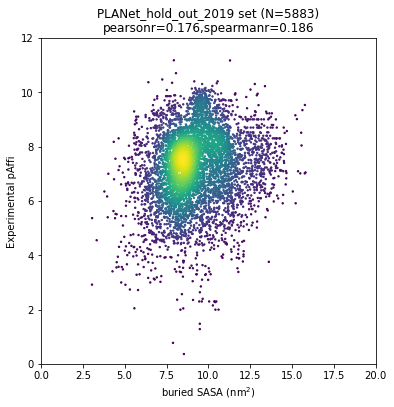

In [281]:
# RIP_minimized_PCV.reset_index(drop=True, inplace=True)
pearsonr = round(stats.pearsonr(PLANet_hold_prop_sasa['del_sasa'], PLANet_hold_prop_sasa['-logAffi'])[0],3)
spearmanr = round(stats.spearmanr(PLANet_hold_prop_sasa['del_sasa'], PLANet_hold_prop_sasa['-logAffi'])[0],3)

xy = np.vstack([PLANet_hold_prop_sasa['del_sasa'], PLANet_hold_prop_sasa['-logAffi']])  #按行叠加
g = gaussian_kde(xy)  #根据xy进行核密度估计(kde) -> 关于xy的概率密度函数
z = g(xy)  #计算每个xy样本点的概率密度

# Sort the points by density, so that the densest points are plotted last
idx = z.argsort()  #对z值排序并返回索引
y, y_, z = PLANet_hold_prop_sasa['del_sasa'][idx], PLANet_hold_prop_sasa['-logAffi'][idx], z[idx]  #对y, y_根据z的大小进行排序

fig, ax = plt.subplots(figsize=(6,6))
ax.scatter(y, y_, s=2, c=z, zorder=2)
ax.set_xlabel('buried SASA (nm$\mathregular{^2}$)')
ax.set_ylabel('Experimental pAffi')
ax.set_xlim(0, 20)
ax.set_ylim(0,12)
plt.title(f'PLANet_hold_out_2019 set (N={len(PLANet_hold_prop_sasa)})\npearsonr={pearsonr},spearmanr={spearmanr}')
plt.savefig('/pubhome/xli02/project/PLIM/deep_learning/FAST/fast_plim/hold_out_2019/4-evaluation/test_on_PLANet_hold_out_2019/property_distribution/SASA_pAffi_scaled_1000.png', dpi=300, bbox_inches='tight')

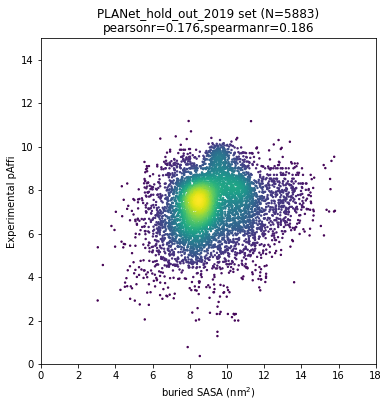

In [10]:
# RIP_minimized_PCV.reset_index(drop=True, inplace=True)
pearsonr = round(stats.pearsonr(PLANet_hold_prop_sasa['del_sasa'], PLANet_hold_prop_sasa['-logAffi'])[0],3)
spearmanr = round(stats.spearmanr(PLANet_hold_prop_sasa['del_sasa'], PLANet_hold_prop_sasa['-logAffi'])[0],3)

xy = np.vstack([PLANet_hold_prop_sasa['del_sasa'], PLANet_hold_prop_sasa['-logAffi']])  #按行叠加
g = gaussian_kde(xy)  #根据xy进行核密度估计(kde) -> 关于xy的概率密度函数
z = g(xy)  #计算每个xy样本点的概率密度

# Sort the points by density, so that the densest points are plotted last
idx = z.argsort()  #对z值排序并返回索引
y, y_, z = PLANet_hold_prop_sasa['del_sasa'][idx], PLANet_hold_prop_sasa['-logAffi'][idx], z[idx]  #对y, y_根据z的大小进行排序

fig, ax = plt.subplots(figsize=(6,6))
ax.scatter(y, y_, s=2, c=z, zorder=2)
ax.set_xlabel('buried SASA (nm$\mathregular{^2}$)')
ax.set_ylabel('Experimental pAffi')
ax.set_xlim(0, 18)
ax.set_ylim(0,15)
plt.title(f'PLANet_hold_out_2019 set (N={len(PLANet_hold_prop_sasa)})\npearsonr={pearsonr},spearmanr={spearmanr}')
plt.savefig('/pubhome/xli02/project/PLIM/deep_learning/FAST/fast_plim/hold_out_2019/4-evaluation/test_on_PLANet_hold_out_2019/property_distribution/SASA_pAffi_scaled_18.png', dpi=300, bbox_inches='tight')

# logp

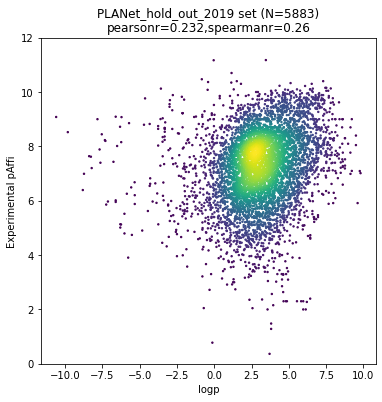

In [35]:
# RIP_minimized_PCV.reset_index(drop=True, inplace=True)
pearsonr = round(stats.pearsonr(PLANet_hold_property['logp'], PLANet_hold_property['-logAffi'])[0],3)
spearmanr = round(stats.spearmanr(PLANet_hold_property['logp'], PLANet_hold_property['-logAffi'])[0],3)

xy = np.vstack([PLANet_hold_property['logp'], PLANet_hold_property['-logAffi']])  #按行叠加
g = gaussian_kde(xy)  #根据xy进行核密度估计(kde) -> 关于xy的概率密度函数
z = g(xy)  #计算每个xy样本点的概率密度

# Sort the points by density, so that the densest points are plotted last
idx = z.argsort()  #对z值排序并返回索引
y, y_, z = PLANet_hold_property['logp'][idx], PLANet_hold_property['-logAffi'][idx], z[idx]  #对y, y_根据z的大小进行排序

fig, ax = plt.subplots(figsize=(6,6))
ax.scatter(y, y_, s=2, c=z, zorder=2)
ax.set_xlabel('logp')
ax.set_ylabel('Experimental pAffi')
# ax.set_xlim(0,60)
ax.set_ylim(0,12)
plt.title(f'PLANet_hold_out_2019 set (N={len(PLANet_hold_property)})\npearsonr={pearsonr},spearmanr={spearmanr}')
plt.savefig('/pubhome/xli02/project/PLIM/deep_learning/FAST/fast_plim/hold_out_2019/4-evaluation/test_on_PLANet_hold_out_2019/property_distribution/logp_pAffi_scaled_1000.png', dpi=300, bbox_inches='tight')

# 4. pfam

In [15]:
PLANet_hold_property.shape

(5883, 29)

In [11]:
PDBbind_v2020_cluster = pd.read_csv('/pubhome/xli02/scripts/scripts_from_zhuhui/general_refine_classified.csv')
PDBbind_v2020_cluster_sel = PDBbind_v2020_cluster[['pdb', 'PCV_cluster']].copy()
PDBbind_v2020_cluster_sel.rename(columns={'pdb':'Cry_lig_name'}, inplace=True)
PDBbind_v2020_cluster_sel

,Cry_lig_name,PCV_cluster
0,4i7p,Lysozyme
1,1l83,Lysozyme
2,1li6,Lysozyme
3,4w52,Lysozyme
4,188l,Lysozyme
...,...,...
19434,5ylv,una_223
19435,3ump,Ribokinase
19436,4q3r,Arginase
19437,1ind,Ig


In [15]:
PLANet_hold_property_sasa_Pfam = pd.merge(PLANet_hold_prop_sasa, PDBbind_v2020_cluster_sel, on='Cry_lig_name')
PLANet_hold_property_sasa_Pfam.shape

(5883, 34)

In [16]:
PLANet_hold_property_sasa_Pfam.columns

Index(['unique_identify', '-logAffi', 'Target_chembl_id', 'Cry_lig_name',
       'Cry_lig_smiles', 'Cry_lig_an', 'Similar_compnd_name',
       'Similar_compnd_smiles', 'Similar_compnd_an', 'Similarity', 'Core_num',
       'Diff_an', 'Part_fix', 'Total_sampled_num', 'Similar_compnd_conform',
       'Total_delta', 'Lig_delta', 'Core_RMSD', 'MolWt', 'MCS_smarts',
       'target_compnd', 'mw', 'logp', 'rotb', 'hbd', 'hba', 'q', 'HA',
       'dataset', 'lig_sasa', 'rec_sasa', 'com_sasa', 'del_sasa',
       'PCV_cluster'],
      dtype='object')

In [18]:
PLANet_hold_property_sasa_Pfam = pd.read_csv('/pubhome/xli02/project/PLIM/deep_learning/FAST/fast_plim/hold_out_2019/4-evaluation/test_on_PLANet_hold_out_2019/property_distribution/PLANet_hold_out_2019_property.csv', sep='\t')

In [305]:
PLANet_hold_property_sasa_Pfam[['unique_identify', '-logAffi', 'mw', 'logp', 'rotb', 'hbd', 'hba', 'q', 'HA', 'lig_sasa', 'rec_sasa', 'com_sasa', 'del_sasa','PCV_cluster']].to_csv('/pubhome/xli02/project/PLIM/deep_learning/FAST/fast_plim/hold_out_2019/4-evaluation/test_on_PLANet_hold_out_2019/property_distribution/PLANet_hold_out_2019_property.csv', sep='\t', index=False)

In [42]:
len(set(PLANet_hold_property_sasa_Pfam['PCV_cluster']))

72

In [43]:
PCV_count_df = pd.DataFrame({'count':PLANet_hold_property_sasa_Pfam.groupby('PCV_cluster').size()}).reset_index()
PCV_count_df.sort_values(by='count', ascending=False).head(10)

,PCV_cluster,count
61,pkinase,1642
60,hormone_recep,507
55,SWIB,459
27,HD_PDEase,306
36,Neur_chan_LBD,305
11,Bromodomain,274
15,Carb_anhydrase,240
23,GPCR_A,233
6,BCLiA,179
54,SET,133


In [47]:
len(PCV_count_df[PCV_count_df['count']>20])

34

In [46]:
# len(PCV_count_df[PCV_count_df['count']>10])

44

In [48]:
top10_clusters=list(PCV_count_df.sort_values(by='count', ascending=False).head(10)['PCV_cluster'])
pfam_label_to_res_dict = defaultdict(list)
for model in models:
    for tp in tps:
        res_df = pd.read_csv(f'{test_dir}/test_on_PLANet_hold_out_2019/{model}_{tp}/test.csv', sep='\t')
        res_df['cry_lig'] = res_df['unique_identify'].str.split('_').str[1]
        res_df_with_PCV = pd.merge(res_df, PDBbind_v2020_cluster_sel.rename(columns={'Cry_lig_name':'cry_lig'}), on='cry_lig')
        for cluster in top10_clusters:
            hold_out_cluster = res_df_with_PCV[res_df_with_PCV['PCV_cluster']==cluster].copy()
            for i in range(5):
                r2 = r2_score(y_true=hold_out_cluster['y_true'], y_pred=hold_out_cluster[f'{model}_{tp}_{i+1}_pred'])
                mae = mean_absolute_error(y_true=hold_out_cluster['y_true'], y_pred=hold_out_cluster[f'{model}_{tp}_{i+1}_pred'])
                mse = mean_squared_error(y_true=hold_out_cluster['y_true'], y_pred=hold_out_cluster[f'{model}_{tp}_{i+1}_pred'])
                pearsonr = stats.pearsonr(hold_out_cluster['y_true'], hold_out_cluster[f'{model}_{tp}_{i+1}_pred'])[0]
                spearmanr = stats.spearmanr(hold_out_cluster['y_true'], hold_out_cluster[f'{model}_{tp}_{i+1}_pred'])[0]
                pfam_label_to_res_dict[f'{model}_{tp}_{i+1}_cluster_{cluster}']=[r2, mae, mse, pearsonr, spearmanr]
        cluster='others'
        hold_out_cluster = res_df_with_PCV[~res_df_with_PCV['PCV_cluster'].isin(top10_clusters)].copy()
        for i in range(5):
            r2 = r2_score(y_true=hold_out_cluster['y_true'], y_pred=hold_out_cluster[f'{model}_{tp}_{i+1}_pred'])
            mae = mean_absolute_error(y_true=hold_out_cluster['y_true'], y_pred=hold_out_cluster[f'{model}_{tp}_{i+1}_pred'])
            mse = mean_squared_error(y_true=hold_out_cluster['y_true'], y_pred=hold_out_cluster[f'{model}_{tp}_{i+1}_pred'])
            pearsonr = stats.pearsonr(hold_out_cluster['y_true'], hold_out_cluster[f'{model}_{tp}_{i+1}_pred'])[0]
            spearmanr = stats.spearmanr(hold_out_cluster['y_true'], hold_out_cluster[f'{model}_{tp}_{i+1}_pred'])[0]
            pfam_label_to_res_dict[f'{model}_{tp}_{i+1}_cluster_{cluster}']=[r2, mae, mse, pearsonr, spearmanr]

In [49]:
pfam_sum_df = pd.DataFrame.from_dict(pfam_label_to_res_dict, orient='index', columns=['r2', 'mae', 'mse', 'pearsonr', 'spearmanr']).reset_index()
pfam_sum_df['rmse']= np.sqrt(pfam_sum_df['mse'])
pfam_sum_df.rename(columns={"index": "model_names_test_type_cluster"}, inplace=True)
pfam_sum_df['cluster'] = pfam_sum_df['model_names_test_type_cluster'].str.rsplit('cluster_', n=1).str[1]
pfam_sum_df['model_names_test_type'] = pfam_sum_df['model_names_test_type_cluster'].str.rsplit('_cluster', n=1).str[0]
pfam_sum_df['model_tp'] = pfam_sum_df['model_names_test_type'].str.rsplit('_', n=1).str[0]
pfam_sum_df['type'] = ['cmx' if 'cmx' in m else 'ligand_alone' for m in pfam_sum_df['model_tp']]
pfam_sum_df['dataset'] = ['_'.join(m.split('_')[:-1]) if 'cmx' in m else '_'.join(m.split('_')[:-2]) for m in pfam_sum_df['model_tp']]
pfam_sum_df.to_csv('/pubhome/xli02/project/PLIM/deep_learning/FAST/fast_plim/hold_out_2019/4-evaluation/test_on_PLANet_hold_out_2019/pfam_cluster/6_models_5_repeats_metrics.csv', sep='\t', index=False)
pfam_sum_df

,model_names_test_type_cluster,r2,mae,mse,pearsonr,spearmanr,rmse,cluster,model_names_test_type,model_tp,type,dataset
0,PDBbind_minimized_v18_subset_cmx_1_cluster_pki...,-0.063818,1.054286,1.905706,0.297323,0.263104,1.380473,pkinase,PDBbind_minimized_v18_subset_cmx_1,PDBbind_minimized_v18_subset_cmx,cmx,PDBbind_minimized_v18_subset
1,PDBbind_minimized_v18_subset_cmx_2_cluster_pki...,-0.203316,1.098257,2.155601,0.318048,0.271465,1.468196,pkinase,PDBbind_minimized_v18_subset_cmx_2,PDBbind_minimized_v18_subset_cmx,cmx,PDBbind_minimized_v18_subset
2,PDBbind_minimized_v18_subset_cmx_3_cluster_pki...,-0.104681,1.031677,1.978909,0.206446,0.148526,1.406737,pkinase,PDBbind_minimized_v18_subset_cmx_3,PDBbind_minimized_v18_subset_cmx,cmx,PDBbind_minimized_v18_subset
3,PDBbind_minimized_v18_subset_cmx_4_cluster_pki...,0.109140,0.939458,1.595872,0.366633,0.320657,1.263278,pkinase,PDBbind_minimized_v18_subset_cmx_4,PDBbind_minimized_v18_subset_cmx,cmx,PDBbind_minimized_v18_subset
4,PDBbind_minimized_v18_subset_cmx_5_cluster_pki...,-0.271972,1.123222,2.278591,0.309655,0.255253,1.509500,pkinase,PDBbind_minimized_v18_subset_cmx_5,PDBbind_minimized_v18_subset_cmx,cmx,PDBbind_minimized_v18_subset
...,...,...,...,...,...,...,...,...,...,...,...,...
325,PDBbind_minimized_v18_subset_union_PLANet_v18_...,-0.073978,1.062937,1.878338,0.400407,0.395021,1.370525,others,PDBbind_minimized_v18_subset_union_PLANet_v18_...,PDBbind_minimized_v18_subset_union_PLANet_v18_...,ligand_alone,PDBbind_minimized_v18_subset_union_PLANet_v18
326,PDBbind_minimized_v18_subset_union_PLANet_v18_...,-0.066200,1.066836,1.864736,0.397657,0.382611,1.365553,others,PDBbind_minimized_v18_subset_union_PLANet_v18_...,PDBbind_minimized_v18_subset_union_PLANet_v18_...,ligand_alone,PDBbind_minimized_v18_subset_union_PLANet_v18
327,PDBbind_minimized_v18_subset_union_PLANet_v18_...,-0.014014,1.051629,1.773465,0.414130,0.388095,1.331715,others,PDBbind_minimized_v18_subset_union_PLANet_v18_...,PDBbind_minimized_v18_subset_union_PLANet_v18_...,ligand_alone,PDBbind_minimized_v18_subset_union_PLANet_v18
328,PDBbind_minimized_v18_subset_union_PLANet_v18_...,-0.176121,1.103832,2.056982,0.323309,0.301724,1.434218,others,PDBbind_minimized_v18_subset_union_PLANet_v18_...,PDBbind_minimized_v18_subset_union_PLANet_v18_...,ligand_alone,PDBbind_minimized_v18_subset_union_PLANet_v18


In [50]:
cluster_11_count = {}
for cluster in top10_clusters+['others']:
    if cluster != 'others':
        cluster_11_count[cluster]=PCV_count_df[PCV_count_df['PCV_cluster']==cluster]['count'].values[0]
    else:
        cluster_11_count[cluster]=len(PLANet_hold_property_Pfam) - np.sum(list(cluster_11_count.values())) #
cluster_11_count


{'pkinase': 1642,
 'hormone_recep': 507,
 'SWIB': 459,
 'HD_PDEase': 306,
 'Neur_chan_LBD': 305,
 'Bromodomain': 274,
 'Carb_anhydrase': 240,
 'GPCR_A': 233,
 'BCLiA': 179,
 'SET': 133,
 'others': 1605}

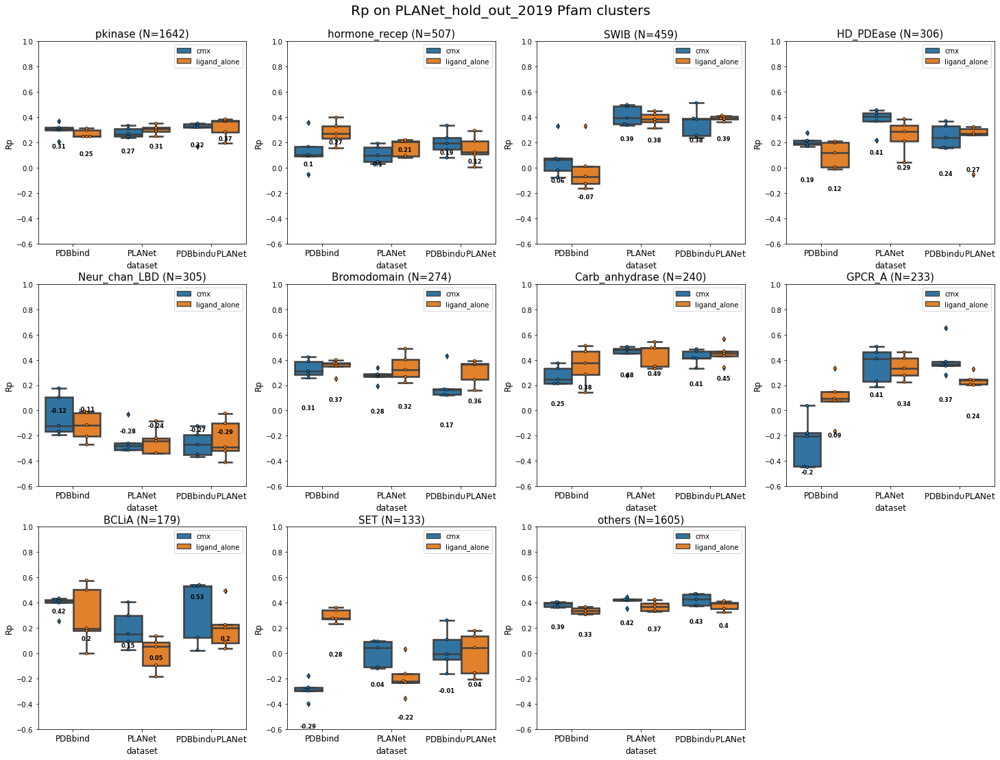

In [54]:
metric='pearsonr'
fig = plt.figure(figsize=(25,25))
for i, cluster in enumerate(top10_clusters+['others']):
    cluster_sum_df = pfam_sum_df[pfam_sum_df['cluster']==cluster]
    grouped_median_cluster = cluster_sum_df.groupby(['dataset', 'type']).median().reset_index()
    grouped_median_cluster['model_name'] = [f'{row.dataset}_{row.type}' for row in grouped_median_cluster.itertuples()]
    
    ax = fig.add_subplot(4, 4, i+1)
    sns.boxplot(x="dataset", y=metric, data=cluster_sum_df, hue="type", order = models, linewidth=2.5)
    sns.swarmplot(x="dataset", y=metric, data=cluster_sum_df, hue="type", order = models, size = 4, dodge=True, edgecolor="black", linewidth=0.7)

    ax.set_title(f'{cluster} (N={cluster_11_count[cluster]})', fontsize=15)
    # fig.autofmt_xdate()
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(handles[:2], labels[:2])
    vertical_offset = cluster_sum_df[metric].median() * 0.5 # offset from median for display
    for i, modl in enumerate(models):
        for tp in ['cmx', 'ligand_alone']:
            median_metric = round(grouped_median_cluster.loc[(grouped_median_cluster['model_name'] == f'{modl}_{tp}')][metric].values[0], 2)
            if cluster in ['HD_PDEase','GPCR_A', 'Bromodomain', 'SET']:
                if tp == 'cmx':
                    ax.text(i-.2, median_metric-0.3, median_metric, horizontalalignment='center',size='small', weight='semibold')
                else:
                    ax.text(i+.2, median_metric-0.3, median_metric, horizontalalignment='center',size='small',weight='semibold')
            else:
                if tp == 'cmx':
                    ax.text(i-.2, median_metric-vertical_offset, median_metric, horizontalalignment='center',size='small', weight='semibold')
                else:
                    ax.text(i+.2, median_metric-vertical_offset, median_metric, horizontalalignment='center',size='small',weight='semibold')
    ax.set_ylim(-0.6,1)
    ax.set_xticklabels(['PDBbind', 'PLANet', 'PDBbind'+r'$\cup{}$' + 'PLANet'], fontsize=12)
    ax.set_ylabel('Rp', fontsize=12)
    ax.set_xlabel('dataset', fontsize=12)
plt.suptitle('Rp on PLANet_hold_out_2019 Pfam clusters', y=0.91, fontsize=20)
plt.savefig(f'/pubhome/xli02/project/PLIM/deep_learning/FAST/fast_plim/hold_out_2019/4-evaluation/test_on_PLANet_hold_out_2019/pfam_cluster/top10_clusters_{metric}_mean_of_5_repeat_models.png', dpi=300, bbox_inches='tight')
# plt.close()

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

PDBbind_minimized_v18_subset_ligand_alone vs. PLANet_v18_ligand_alone: t-test independent samples, P_val:1.705e-01 t=-1.506e+00
PDBbind_minimized_v18_subset_cmx vs. PLANet_v18_cmx: t-test independent samples, P_val:5.404e-01 t=6.395e-01
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

PDBbind_minimized_v18_subset_ligand_alone vs. PLANet_v18_ligand_alone: t-test independent samples, P_val:5.574e-02 t=2.236e+00
PDBbind_minimized_v18_subset_cmx vs. PLANet_v18_cmx: t-test independent samples, P_val:7.236e-01 t=3.663e-01
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****:

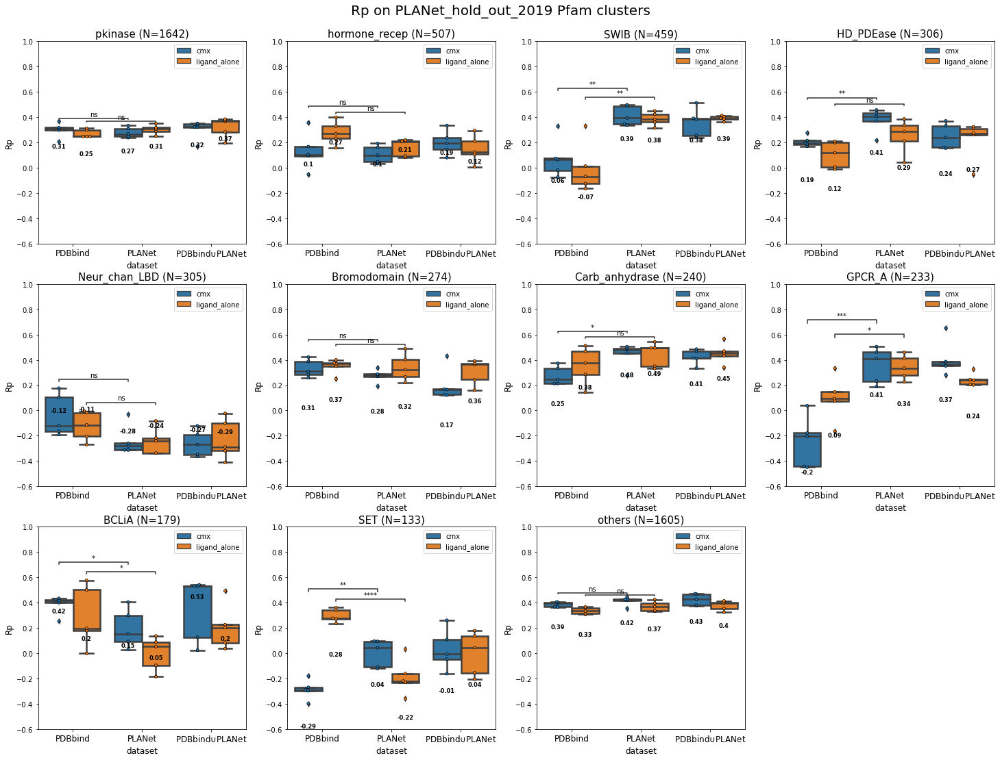

In [295]:
metric='pearsonr'
fig = plt.figure(figsize=(25,25))
for i, cluster in enumerate(top10_clusters+['others']):
    cluster_sum_df = pfam_sum_df[pfam_sum_df['cluster']==cluster]
    grouped_median_cluster = cluster_sum_df.groupby(['dataset', 'type']).median().reset_index()
    grouped_median_cluster['model_name'] = [f'{row.dataset}_{row.type}' for row in grouped_median_cluster.itertuples()]
    
    ax = fig.add_subplot(4, 4, i+1)
    sns.boxplot(x="dataset", y=metric, data=cluster_sum_df, hue="type", order = models, linewidth=2.5)
    sns.swarmplot(x="dataset", y=metric, data=cluster_sum_df, hue="type", order = models, size = 4, dodge=True, edgecolor="black", linewidth=0.7)

    pairs = [(("PLANet_v18", "ligand_alone"), ("PDBbind_minimized_v18_subset", "ligand_alone")), 
        (("PLANet_v18", "cmx"), ("PDBbind_minimized_v18_subset", "cmx")), 
        ]
    annotator = Annotator(ax, pairs, x="dataset", y=metric, data=cluster_sum_df, hue="type", order = models)
    annotator.configure(test='t-test_ind').apply_and_annotate()

    ax.set_title(f'{cluster} (N={cluster_11_count[cluster]})', fontsize=15)
    # fig.autofmt_xdate()
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(handles[:2], labels[:2])
    vertical_offset = cluster_sum_df[metric].median() * 0.5 # offset from median for display
    for i, modl in enumerate(models):
        for tp in ['cmx', 'ligand_alone']:
            median_metric = round(grouped_median_cluster.loc[(grouped_median_cluster['model_name'] == f'{modl}_{tp}')][metric].values[0], 2)
            if cluster in ['HD_PDEase','GPCR_A', 'Bromodomain', 'SET']:
                if tp == 'cmx':
                    ax.text(i-.2, median_metric-0.3, median_metric, horizontalalignment='center',size='small', weight='semibold')
                else:
                    ax.text(i+.2, median_metric-0.3, median_metric, horizontalalignment='center',size='small',weight='semibold')
            else:
                if tp == 'cmx':
                    ax.text(i-.2, median_metric-vertical_offset, median_metric, horizontalalignment='center',size='small', weight='semibold')
                else:
                    ax.text(i+.2, median_metric-vertical_offset, median_metric, horizontalalignment='center',size='small',weight='semibold')
    ax.set_ylim(-0.6,1)
    ax.set_xticklabels(['PDBbind', 'PLANet', 'PDBbind'+r'$\cup{}$' + 'PLANet'], fontsize=12)
    ax.set_ylabel('Rp', fontsize=12)
    ax.set_xlabel('dataset', fontsize=12)
plt.suptitle('Rp on PLANet_hold_out_2019 Pfam clusters', y=0.91, fontsize=20)
plt.savefig(f'/pubhome/xli02/project/PLIM/deep_learning/FAST/fast_plim/hold_out_2019/4-evaluation/test_on_PLANet_hold_out_2019/pfam_cluster/top10_clusters_{metric}_mean_of_5_repeat_models_with_sig.png', dpi=300, bbox_inches='tight')
# plt.close()

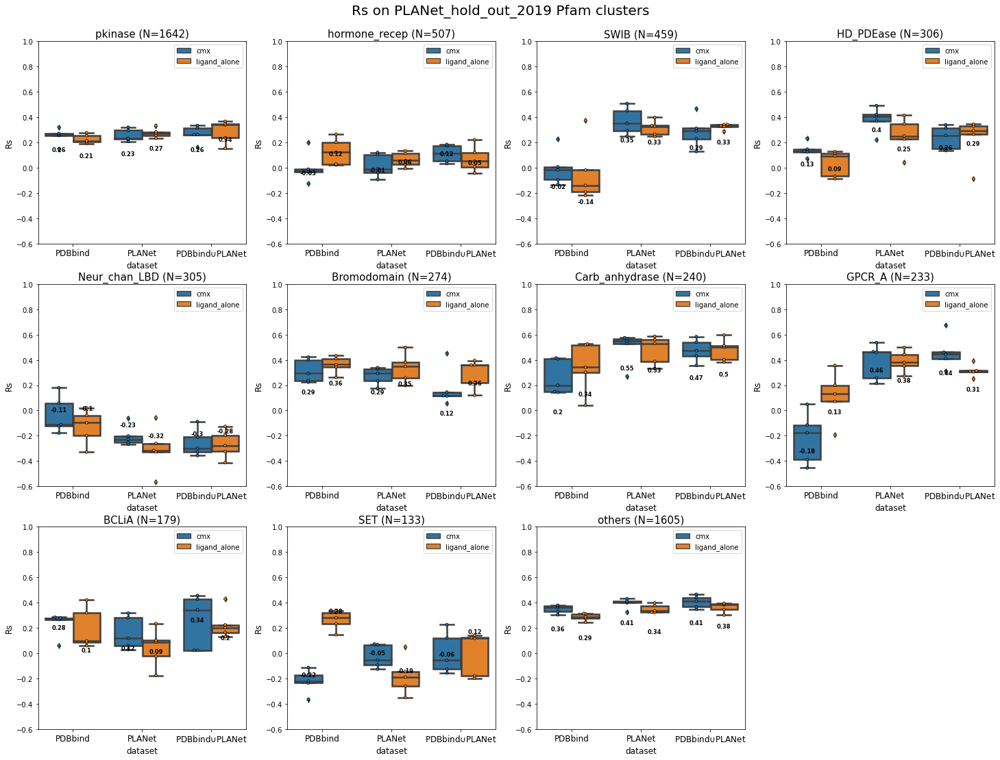

In [55]:
metric='spearmanr'
fig = plt.figure(figsize=(25,25))
for i, cluster in enumerate(top10_clusters+['others']):
    cluster_sum_df = pfam_sum_df[pfam_sum_df['cluster']==cluster]
    grouped_median_cluster = cluster_sum_df.groupby(['dataset', 'type']).median().reset_index()
    grouped_median_cluster['model_name'] = [f'{row.dataset}_{row.type}' for row in grouped_median_cluster.itertuples()]
    
    ax = fig.add_subplot(4, 4, i+1)
    sns.boxplot(x="dataset", y=metric, data=cluster_sum_df, hue="type", order = models, linewidth=2.5)
    sns.swarmplot(x="dataset", y=metric, data=cluster_sum_df, hue="type", order = models, size = 4, dodge=True, edgecolor="black", linewidth=0.7)

    ax.set_title(f'{cluster} (N={cluster_11_count[cluster]})', fontsize=15)
    # fig.autofmt_xdate()
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(handles[:2], labels[:2])
    vertical_offset = cluster_sum_df[metric].median() * 0.5 # offset from median for display
    for i, modl in enumerate(models):
        for tp in ['cmx', 'ligand_alone']:
            median_metric = round(grouped_median_cluster.loc[(grouped_median_cluster['model_name'] == f'{modl}_{tp}')][metric].values[0], 2)
            # if cluster=='PBP':
            #     if tp == 'cmx':
            #         ax.text(i-.2, median_metric-0.15, median_metric, horizontalalignment='center',size='small', weight='semibold')
            #     else:
            #         ax.text(i+.2, median_metric-0.15, median_metric, horizontalalignment='center',size='small',weight='semibold')
            # else:
            if tp == 'cmx':
                ax.text(i-.2, median_metric-vertical_offset, median_metric, horizontalalignment='center',size='small', weight='semibold')
            else:
                ax.text(i+.2, median_metric-vertical_offset, median_metric, horizontalalignment='center',size='small',weight='semibold')
    ax.set_ylim(-0.6,1)
    ax.set_xticklabels(['PDBbind', 'PLANet', 'PDBbind'+r'$\cup{}$' + 'PLANet'], fontsize=12)
    ax.set_ylabel('Rs', fontsize=12)
    ax.set_xlabel('dataset', fontsize=12)
plt.suptitle('Rs on PLANet_hold_out_2019 Pfam clusters', y=0.91, fontsize=20)
plt.savefig(f'/pubhome/xli02/project/PLIM/deep_learning/FAST/fast_plim/hold_out_2019/4-evaluation/test_on_PLANet_hold_out_2019/pfam_cluster/top10_clusters_{metric}_mean_of_5_repeat_models.png', dpi=300, bbox_inches='tight')
# plt.close()

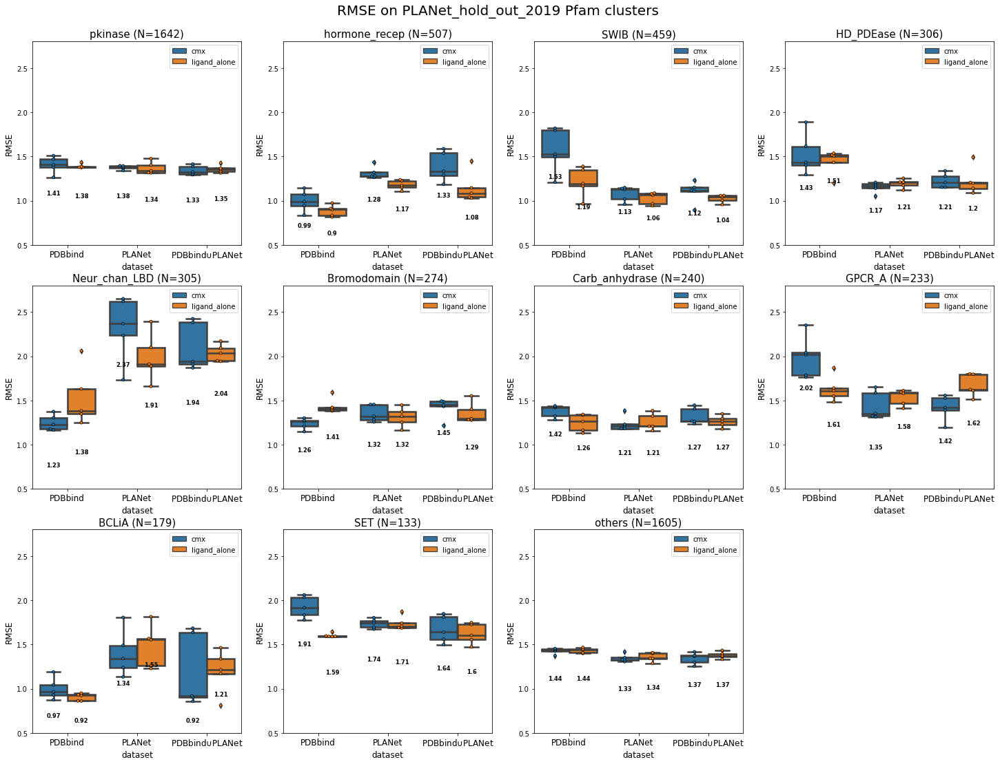

In [56]:
metric='rmse'
fig = plt.figure(figsize=(25,25))
for i, cluster in enumerate(top10_clusters+['others']):
    cluster_sum_df = pfam_sum_df[pfam_sum_df['cluster']==cluster]
    grouped_median_cluster = cluster_sum_df.groupby(['dataset', 'type']).median().reset_index()
    grouped_median_cluster['model_name'] = [f'{row.dataset}_{row.type}' for row in grouped_median_cluster.itertuples()]
    
    ax = fig.add_subplot(4, 4, i+1)
    sns.boxplot(x="dataset", y=metric, data=cluster_sum_df, hue="type", order = models, linewidth=2.5)
    sns.swarmplot(x="dataset", y=metric, data=cluster_sum_df, hue="type", order = models, size = 4, dodge=True, edgecolor="black", linewidth=0.7)

    ax.set_title(f'{cluster} (N={cluster_11_count[cluster]})', fontsize=15)
    # fig.autofmt_xdate()
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(handles[:2], labels[:2])
    vertical_offset = cluster_sum_df[metric].median() * 0.25 # offset from median for display
    for i, modl in enumerate(models):
        for tp in ['cmx', 'ligand_alone']:
            median_metric = round(grouped_median_cluster.loc[(grouped_median_cluster['model_name'] == f'{modl}_{tp}')][metric].values[0], 2)
            if tp == 'cmx':
                ax.text(i-.2, median_metric-vertical_offset, median_metric, horizontalalignment='center',size='small', weight='semibold')
            else:
                ax.text(i+.2, median_metric-vertical_offset, median_metric, horizontalalignment='center',size='small',weight='semibold')
    ax.set_ylim(0.5,2.8)
    ax.set_xticklabels(['PDBbind', 'PLANet', 'PDBbind'+r'$\cup{}$' + 'PLANet'], fontsize=12)
    ax.set_ylabel('RMSE', fontsize=12)
    ax.set_xlabel('dataset', fontsize=12)
plt.suptitle('RMSE on PLANet_hold_out_2019 Pfam clusters', y=0.91, fontsize=20)
plt.savefig(f'/pubhome/xli02/project/PLIM/deep_learning/FAST/fast_plim/hold_out_2019/4-evaluation/test_on_PLANet_hold_out_2019/pfam_cluster/top10_clusters_{metric}_mean_of_5_repeat_models.png', dpi=300, bbox_inches='tight')
# plt.close()

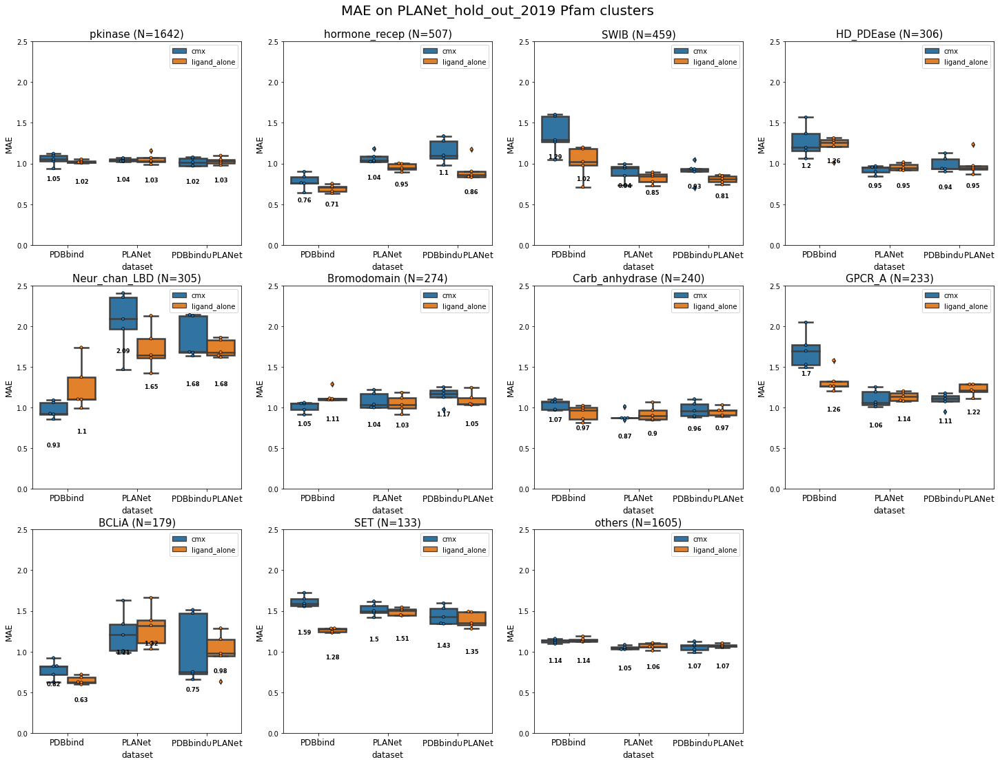

In [57]:
metric='mae'
fig = plt.figure(figsize=(25,25))
for i, cluster in enumerate(top10_clusters+['others']):
    cluster_sum_df = pfam_sum_df[pfam_sum_df['cluster']==cluster]
    grouped_median_cluster = cluster_sum_df.groupby(['dataset', 'type']).median().reset_index()
    grouped_median_cluster['model_name'] = [f'{row.dataset}_{row.type}' for row in grouped_median_cluster.itertuples()]
    
    ax = fig.add_subplot(4, 4, i+1)
    sns.boxplot(x="dataset", y=metric, data=cluster_sum_df, hue="type", order = models, linewidth=2.5)
    sns.swarmplot(x="dataset", y=metric, data=cluster_sum_df, hue="type", order = models, size = 4, dodge=True, edgecolor="black", linewidth=0.7)

    ax.set_title(f'{cluster} (N={cluster_11_count[cluster]})', fontsize=15)
    # fig.autofmt_xdate()
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(handles[:2], labels[:2])
    vertical_offset = cluster_sum_df[metric].median() * 0.25 # offset from median for display
    for i, modl in enumerate(models):
        for tp in ['cmx', 'ligand_alone']:
            median_metric = round(grouped_median_cluster.loc[(grouped_median_cluster['model_name'] == f'{modl}_{tp}')][metric].values[0], 2)
            if tp == 'cmx':
                ax.text(i-.2, median_metric-vertical_offset, median_metric, horizontalalignment='center',size='small', weight='semibold')
            else:
                ax.text(i+.2, median_metric-vertical_offset, median_metric, horizontalalignment='center',size='small',weight='semibold')
    ax.set_ylim(0,2.5)
    ax.set_xticklabels(['PDBbind', 'PLANet', 'PDBbind'+r'$\cup{}$' + 'PLANet'], fontsize=12)
    ax.set_ylabel('MAE', fontsize=12)
    ax.set_xlabel('dataset', fontsize=12)
plt.suptitle('MAE on PLANet_hold_out_2019 Pfam clusters', y=0.91, fontsize=20)
plt.savefig(f'/pubhome/xli02/project/PLIM/deep_learning/FAST/fast_plim/hold_out_2019/4-evaluation/test_on_PLANet_hold_out_2019/pfam_cluster/top10_clusters_{metric}_mean_of_5_repeat_models.png', dpi=300, bbox_inches='tight')
# plt.close()

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

PDBbind_minimized_v18_subset_ligand_alone vs. PLANet_v18_ligand_alone: t-test independent samples, P_val:3.357e-01 t=-1.024e+00
PDBbind_minimized_v18_subset_cmx vs. PLANet_v18_cmx: t-test independent samples, P_val:8.697e-01 t=1.694e-01
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

PDBbind_minimized_v18_subset_ligand_alone vs. PLANet_v18_ligand_alone: t-test independent samples, P_val:2.501e-05 t=-8.639e+00
PDBbind_minimized_v18_subset_cmx vs. PLANet_v18_cmx: t-test independent samples, P_val:5.609e-04 t=-5.519e+00
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ***

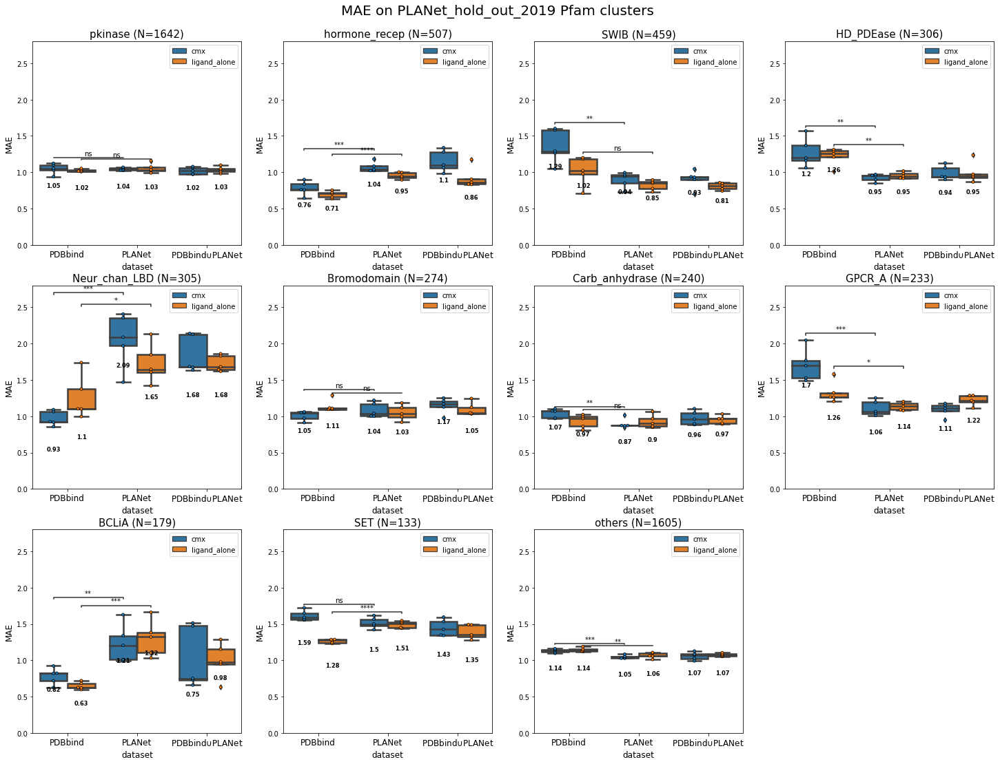

In [299]:
metric='mae'
fig = plt.figure(figsize=(25,25))
for i, cluster in enumerate(top10_clusters+['others']):
    cluster_sum_df = pfam_sum_df[pfam_sum_df['cluster']==cluster]
    grouped_median_cluster = cluster_sum_df.groupby(['dataset', 'type']).median().reset_index()
    grouped_median_cluster['model_name'] = [f'{row.dataset}_{row.type}' for row in grouped_median_cluster.itertuples()]
    
    ax = fig.add_subplot(4, 4, i+1)
    sns.boxplot(x="dataset", y=metric, data=cluster_sum_df, hue="type", order = models, linewidth=2.5)
    sns.swarmplot(x="dataset", y=metric, data=cluster_sum_df, hue="type", order = models, size = 4, dodge=True, edgecolor="black", linewidth=0.7)

    ax.set_title(f'{cluster} (N={cluster_11_count[cluster]})', fontsize=15)
    # fig.autofmt_xdate()

    pairs = [(("PLANet_v18", "ligand_alone"), ("PDBbind_minimized_v18_subset", "ligand_alone")), 
    (("PLANet_v18", "cmx"), ("PDBbind_minimized_v18_subset", "cmx")), 
    ]
    annotator = Annotator(ax, pairs, x="dataset", y=metric, data=cluster_sum_df, hue="type", order = models)
    annotator.configure(test='t-test_ind').apply_and_annotate()

    handles, labels = ax.get_legend_handles_labels()
    ax.legend(handles[:2], labels[:2])
    vertical_offset = cluster_sum_df[metric].median() * 0.25 # offset from median for display
    for i, modl in enumerate(models):
        for tp in ['cmx', 'ligand_alone']:
            median_metric = round(grouped_median_cluster.loc[(grouped_median_cluster['model_name'] == f'{modl}_{tp}')][metric].values[0], 2)
            if tp == 'cmx':
                ax.text(i-.2, median_metric-vertical_offset, median_metric, horizontalalignment='center',size='small', weight='semibold')
            else:
                ax.text(i+.2, median_metric-vertical_offset, median_metric, horizontalalignment='center',size='small',weight='semibold')
    ax.set_ylim(0,2.8)
    ax.set_xticklabels(['PDBbind', 'PLANet', 'PDBbind'+r'$\cup{}$' + 'PLANet'], fontsize=12)
    ax.set_ylabel('MAE', fontsize=12)
    ax.set_xlabel('dataset', fontsize=12)
plt.suptitle('MAE on PLANet_hold_out_2019 Pfam clusters', y=0.91, fontsize=20)
plt.savefig(f'/pubhome/xli02/project/PLIM/deep_learning/FAST/fast_plim/hold_out_2019/4-evaluation/test_on_PLANet_hold_out_2019/pfam_cluster/top10_clusters_{metric}_mean_of_5_repeat_models_with_sig.png', dpi=300, bbox_inches='tight')
# plt.close()

# mean_predicted - property

In [19]:
mean_pred_df_with_prop_pfam = mean_pred_df_with_prop.merge(PLANet_hold_property_sasa_Pfam[['unique_identify', 'PCV_cluster']], on=['unique_identify']).copy()
mean_pred_df_with_prop_pfam.shape

(5848, 36)

In [27]:
mean_pred_df_with_prop_pfam_sasa = mean_pred_df_with_prop_pfam.merge(PLANet_hold_prop_sasa[['unique_identify', 'del_sasa']], on=['unique_identify']).copy()
mean_pred_df_with_prop_pfam_sasa.shape

(5848, 37)

In [21]:
mean_pred_df_with_prop_pfam[['unique_identify', 'y_true', 'PDBbind_minimized_v18_subset_cmx_mean',
       'PDBbind_minimized_v18_subset_lig_alone_mean', 'PLANet_v18_cmx_mean',
       'PLANet_v18_lig_alone_mean',
       'PDBbind_minimized_v18_subset_union_PLANet_v18_cmx_mean',
       'PDBbind_minimized_v18_subset_union_PLANet_v18_lig_alone_mean', 'mw', 'logp', 'rotb', 'hbd',
       'hba', 'q', 'HA', 'dataset', 'PCV_cluster']].to_csv('/pubhome/xli02/project/PLIM/deep_learning/FAST/fast_plim/hold_out_2019/4-evaluation/test_on_PLANet_hold_out_2019/mean_of_5_models/mean_pred_df_with_prop_pfam.csv', sep='\t', index=False)

In [59]:
from pathlib import Path

In [310]:
cluster_dict = defaultdict(list)
for cluster in top10_clusters:
    cluster_dir = f'/pubhome/xli02/project/PLIM/deep_learning/FAST/fast_plim/hold_out_2019/4-evaluation/test_on_PLANet_hold_out_2019/mean_of_5_models/pfam_cluster/{cluster}'
    if not Path(cluster_dir).exists():
        Path(cluster_dir).mkdir(parents=True)
    
    # hold_out_cluster_mean_pred = mean_pred_df_with_prop_pfam_sasa[mean_pred_df_with_prop_pfam_sasa['PCV_cluster']==cluster].copy()
    hold_out_cluster_mean_pred = mean_pred_df_with_prop_pfam_sasa[mean_pred_df_with_prop_pfam_sasa['PCV_cluster']==cluster].copy()

    hold_out_cluster_mean_pred_melted = hold_out_cluster_mean_pred[['unique_identify', 'y_true', 'PDBbind_minimized_v18_subset_cmx_mean', 'PLANet_v18_cmx_mean']].melt(id_vars=['unique_identify', 'y_true'], var_name='model')
    fig, ax = plt.subplots(figsize=(6,6))
    sns.scatterplot(data=hold_out_cluster_mean_pred_melted, x="y_true", y="value", hue='model')
    lims = [
            np.min([ax.get_xlim(), ax.get_ylim()]),
            np.max([ax.get_xlim(), ax.get_ylim()]),
        ]
    ax.set_xlim(lims)
    ax.set_ylim(lims)
    ax.plot(lims, lims, "k-", alpha=0.75, zorder=0)
    plt.xlabel("Experimental pAffi")
    plt.ylabel("mean_predicted pAffi")
    plt.title(f'PLANet_hold_out_2019 {cluster} cluster (N={len(hold_out_cluster_mean_pred)})')
    handles, labels = ax.get_legend_handles_labels()
    # ax.legend(handles[:2], labels[:2], loc='upper left')
    PDBbind_v18_subset_Rp = round(stats.pearsonr(hold_out_cluster_mean_pred["y_true"], hold_out_cluster_mean_pred["PDBbind_minimized_v18_subset_cmx_mean"])[0], 3)
    PLANet_v18_Rp = round(stats.pearsonr(hold_out_cluster_mean_pred["y_true"], hold_out_cluster_mean_pred["PLANet_v18_cmx_mean"])[0], 3)

    ax.legend(handles[:2], [f'PDBbind_v18_subset_cmx_mean_Rp_{PDBbind_v18_subset_Rp}_MAE_{round(mean_absolute_error(hold_out_cluster_mean_pred["y_true"], hold_out_cluster_mean_pred["PDBbind_minimized_v18_subset_cmx_mean"]), 3)}', f'PLANet_v18_cmx_mean_Rp_{PLANet_v18_Rp}_MAE_{round(mean_absolute_error(hold_out_cluster_mean_pred["y_true"], hold_out_cluster_mean_pred["PLANet_v18_cmx_mean"]), 3)}'], loc='lower right')
    plt.savefig(f'{cluster_dir}/{cluster}_scatter_PLANet_vs_PIP_cmx_mean.png', dpi=300, bbox_inches='tight')
    plt.close()

    cluster_dict[cluster] = [round(stats.pearsonr(hold_out_cluster_mean_pred["y_true"], hold_out_cluster_mean_pred[name])[0], 3) for name in list(mean_pred_df.columns.drop(['unique_identify', 'y_true'])) ]

    # for prop in ['mw', 'logp', 'HA', 'del_sasa']:
    for prop in ['mw', 'logp', 'HA', 'del_sasa']:
        fig, ax = plt.subplots(figsize=(6,6))
        sns.regplot(data=hold_out_cluster_mean_pred, x=prop, y="y_true")

        plt.xlabel(prop)
        plt.ylabel("Experimental pAffi")
        prop_true_Rp = round(stats.pearsonr(hold_out_cluster_mean_pred[prop], hold_out_cluster_mean_pred["y_true"])[0], 3)
        plt.title(f'PLANet_hold_out_2019 {cluster} cluster (N={len(hold_out_cluster_mean_pred)})\nRp={prop_true_Rp}, Rs={round(stats.spearmanr(hold_out_cluster_mean_pred[prop], hold_out_cluster_mean_pred["y_true"])[0], 3)}')
        handles, labels = ax.get_legend_handles_labels()
        # ax.legend(handles[:2], labels[:2], loc='upper left')
        plt.ylim(
            min([min(hold_out_cluster_mean_pred[name]) for name in list(mean_pred_df.columns.drop(['unique_identify', 'y_true']))])-0.5,
            max([max(hold_out_cluster_mean_pred[name]) for name in list(mean_pred_df.columns.drop(['unique_identify', 'y_true']))])+0.5
        )
        plt.savefig(f'{cluster_dir}/{cluster}_scatter_{prop}_experimental_pAffi.png', dpi=300, bbox_inches='tight')
        plt.close()

        cluster_dict[cluster].append(prop_true_Rp)

        fig = plt.figure(figsize=(16,16))
        for i, model in enumerate(models):
            for j, tp in enumerate(tps):
                # print((i+1)+6*j)
                ax = fig.add_subplot(3, 3, (i+1)+3*j)
                # fig, ax = plt.subplots(figsize=(6,6))
                # sns.scatterplot(x='mw', y=f'{model}_{tp}_mean', data=hold_out_hdpdease_mean_pred)
                sns.regplot(x=prop, y=f'{model}_{tp}_mean', data=hold_out_cluster_mean_pred)

                # ax.set_xlim(0, 600)
                ax.set_ylim(
                    min([min(hold_out_cluster_mean_pred[name]) for name in list(mean_pred_df.columns.drop(['unique_identify', 'y_true']))])-0.5,
                    max([max(hold_out_cluster_mean_pred[name]) for name in list(mean_pred_df.columns.drop(['unique_identify', 'y_true']))])+0.5
                )
                ax.set_ylabel(f'mean_predicted pAffi')
                ax.set_xlabel(prop)

                prop_mean_pred_Rp = round(stats.pearsonr(hold_out_cluster_mean_pred[f"{model}_{tp}_mean"], hold_out_cluster_mean_pred[prop])[0], 3)
                ax.set_title(f'{simple_dict[model]}_{tp}\npearsonr={prop_mean_pred_Rp}, spearmanr={round(stats.spearmanr(hold_out_cluster_mean_pred[f"{model}_{tp}_mean"], hold_out_cluster_mean_pred[prop])[0], 3)}')

        plt.subplots_adjust(left=0.125,
                            bottom=0.1, 
                            right=0.9, 
                            top=0.93, 
                            wspace=0.2, 
                            hspace=0.35)
        plt.suptitle(f'Relationship between mean_predict and {prop} on {cluster} cluster (N={len(hold_out_cluster_mean_pred)})')
        plt.savefig(f'{cluster_dir}/{prop}_pred_pAffi_for_6_models.png', dpi=300, bbox_inches='tight')
        plt.close()


In [311]:
rename_dict = {'PDBbind_minimized_v18_subset_cmx_mean': 'Rp(PDBbind_v18_subset_cmx,Exp_pAffi)', 'PDBbind_minimized_v18_subset_lig_alone_mean': 'Rp(PDBbind_v18_subset_lig_alone,Exp_pAffi)', 'PLANet_v18_cmx_mean':'Rp(PLANet_cmx,Exp_pAffi)', 'PLANet_v18_lig_alone_mean':'Rp(PLANet_lig_alone,Exp_pAffi)', 'PDBbind_minimized_v18_subset_union_PLANet_v18_cmx_mean':'Rp(merged_cmx,Exp_pAffi)', 'PDBbind_minimized_v18_subset_union_PLANet_v18_lig_alone_mean':'Rp(merged_lig_alone,Exp_pAffi)', 'mw':'Rp(mw,Exp_pAffi)', 'logp':'Rp(logp,Exp_pAffi)', 'HA':'Rp(HA,Exp_pAffi)', 'del_sasa':'Rp(buried_SASA,Exp_pAffi)'}

In [313]:
prop_correlation = pd.DataFrame.from_dict(cluster_dict, orient='index', columns= list(mean_pred_df.columns.drop(['unique_identify', 'y_true'])) + ['mw', 'logp', 'HA', 'del_sasa'])
# list(mean_pred_df.columns.drop(['unique_identify', 'y_true'])) + ['mw', 'logp', 'HA', 'del_sasa']
prop_correlation

,PDBbind_minimized_v18_subset_cmx_mean,PDBbind_minimized_v18_subset_lig_alone_mean,PLANet_v18_cmx_mean,PLANet_v18_lig_alone_mean,PDBbind_minimized_v18_subset_union_PLANet_v18_cmx_mean,PDBbind_minimized_v18_subset_union_PLANet_v18_lig_alone_mean,mw,logp,HA,del_sasa
pkinase,0.349,0.297,0.349,0.393,0.394,0.422,0.211,-0.011,0.238,0.214
hormone_recep,0.140,0.331,0.153,0.243,0.251,0.208,0.410,0.254,0.383,0.316
SWIB,0.061,0.068,0.519,0.478,0.452,0.496,0.186,-0.014,0.328,0.445
HD_PDEase,0.255,0.137,0.524,0.397,0.362,0.368,-0.012,0.137,-0.054,-0.271
Neur_chan_LBD,-0.037,-0.172,-0.339,-0.454,-0.414,-0.324,-0.129,-0.098,-0.144,-0.164
Bromodomain,0.372,0.368,0.331,0.404,0.252,0.373,0.085,0.386,0.147,0.304
Carb_anhydrase,0.296,0.471,0.545,0.559,0.521,0.551,0.206,-0.072,0.090,0.148
GPCR_A,-0.363,0.114,0.484,0.415,0.501,0.301,0.104,0.294,0.129,0.028
BCLiA,0.446,0.454,0.273,-0.011,0.576,0.301,0.419,0.115,0.460,0.399
SET,-0.309,0.340,0.005,-0.221,0.032,-0.001,0.203,-0.122,0.206,-0.262


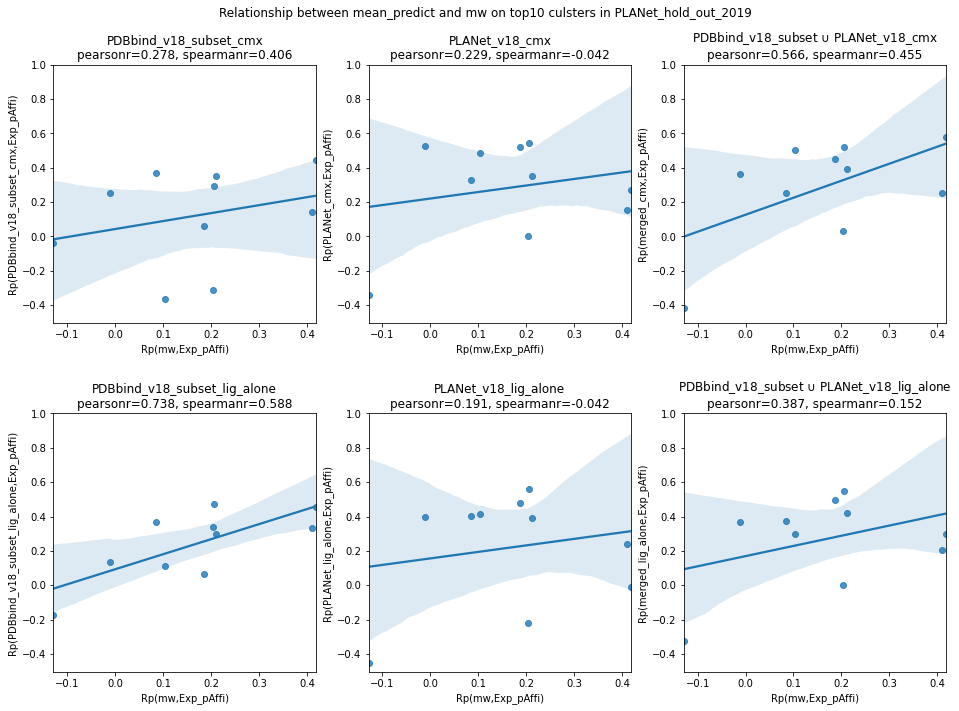

In [64]:
prop='mw'
fig = plt.figure(figsize=(16,16))
for i, model in enumerate(models):
    for j, tp in enumerate(tps):
        # print((i+1)+6*j)
        ax = fig.add_subplot(3, 3, (i+1)+3*j)
        # fig, ax = plt.subplots(figsize=(6,6))
        # sns.scatterplot(x='mw', y=f'{model}_{tp}_mean', data=hold_out_hdpdease_mean_pred)
        sns.regplot(x=prop, y=f'{model}_{tp}_mean', data=prop_correlation)

        # ax.set_xlim(0, 600)
        ax.set_ylim(
            min([min(prop_correlation[name]) for name in list(mean_pred_df.columns.drop(['unique_identify', 'y_true']))])-0.05,
            1
        )
        ax.set_ylabel(rename_dict[f'{model}_{tp}_mean'])
        ax.set_xlabel(rename_dict[prop])

        ax.set_title(f'{simple_dict[model]}_{tp}\npearsonr={round(stats.pearsonr(prop_correlation[f"{model}_{tp}_mean"], prop_correlation[prop])[0], 3)}, spearmanr={round(stats.spearmanr(prop_correlation[f"{model}_{tp}_mean"], prop_correlation[prop])[0], 3)}')

plt.subplots_adjust(left=0.125,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.93, 
                    wspace=0.2, 
                    hspace=0.35)
plt.suptitle(f'Relationship between mean_predict and {prop} on top10 culsters in PLANet_hold_out_2019')
plt.savefig(f'/pubhome/xli02/project/PLIM/deep_learning/FAST/fast_plim/hold_out_2019/4-evaluation/test_on_PLANet_hold_out_2019/mean_of_5_models/pfam_cluster/{prop}_relate_with_6_models.png', dpi=300, bbox_inches='tight')

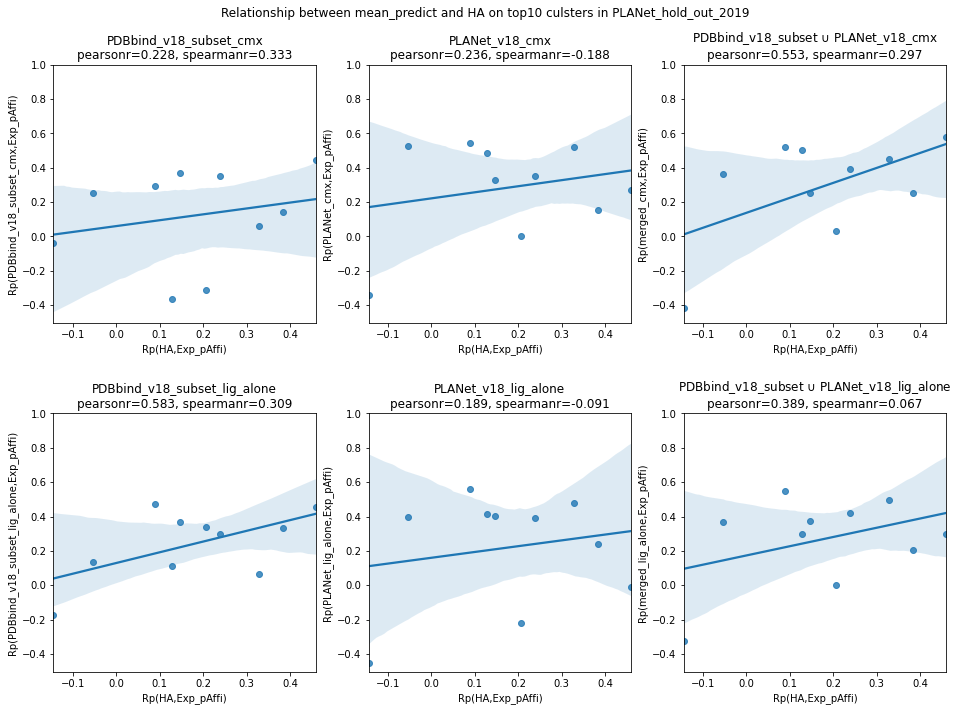

In [65]:
prop='HA'
fig = plt.figure(figsize=(16,16))
for i, model in enumerate(models):
    for j, tp in enumerate(tps):
        # print((i+1)+6*j)
        ax = fig.add_subplot(3, 3, (i+1)+3*j)
        # fig, ax = plt.subplots(figsize=(6,6))
        # sns.scatterplot(x='mw', y=f'{model}_{tp}_mean', data=hold_out_hdpdease_mean_pred)
        sns.regplot(x=prop, y=f'{model}_{tp}_mean', data=prop_correlation)

        # ax.set_xlim(0, 600)
        ax.set_ylim(
            min([min(prop_correlation[name]) for name in list(mean_pred_df.columns.drop(['unique_identify', 'y_true']))])-0.05,
            1
        )
        ax.set_ylabel(rename_dict[f'{model}_{tp}_mean'])
        ax.set_xlabel(rename_dict[prop])

        ax.set_title(f'{simple_dict[model]}_{tp}\npearsonr={round(stats.pearsonr(prop_correlation[f"{model}_{tp}_mean"], prop_correlation[prop])[0], 3)}, spearmanr={round(stats.spearmanr(prop_correlation[f"{model}_{tp}_mean"], prop_correlation[prop])[0], 3)}')

plt.subplots_adjust(left=0.125,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.93, 
                    wspace=0.2, 
                    hspace=0.35)
plt.suptitle(f'Relationship between mean_predict and {prop} on top10 culsters in PLANet_hold_out_2019')
plt.savefig(f'/pubhome/xli02/project/PLIM/deep_learning/FAST/fast_plim/hold_out_2019/4-evaluation/test_on_PLANet_hold_out_2019/mean_of_5_models/pfam_cluster/{prop}_relate_with_6_models.png', dpi=300, bbox_inches='tight')

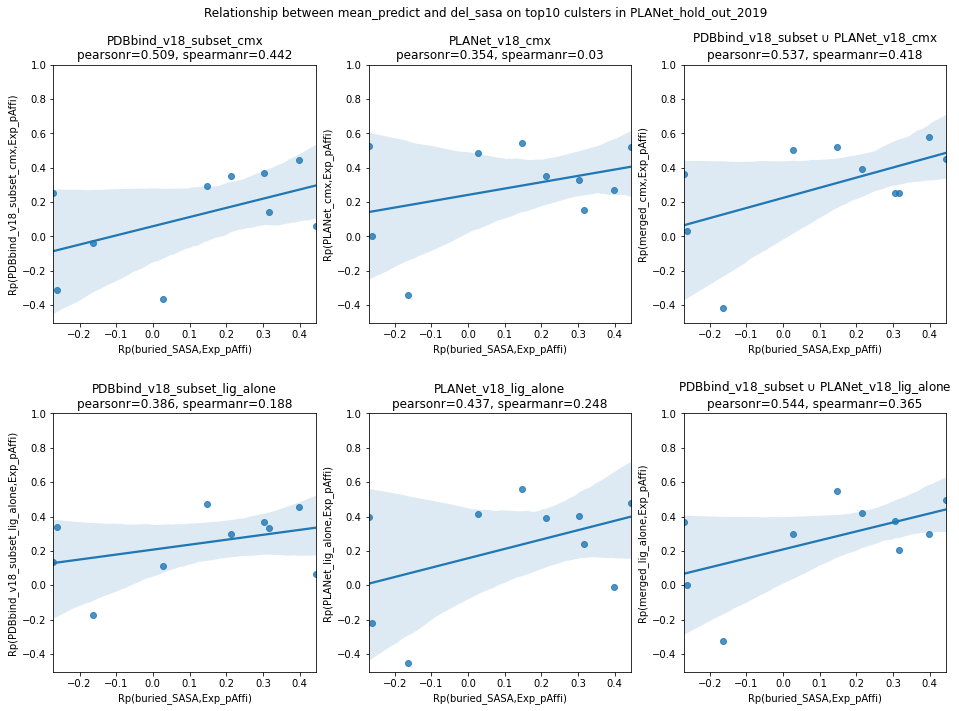

In [314]:
prop='del_sasa'
fig = plt.figure(figsize=(16,16))
for i, model in enumerate(models):
    for j, tp in enumerate(tps):
        # print((i+1)+6*j)
        ax = fig.add_subplot(3, 3, (i+1)+3*j)
        # fig, ax = plt.subplots(figsize=(6,6))
        # sns.scatterplot(x='mw', y=f'{model}_{tp}_mean', data=hold_out_hdpdease_mean_pred)
        sns.regplot(x=prop, y=f'{model}_{tp}_mean', data=prop_correlation)

        # ax.set_xlim(0, 600)
        ax.set_ylim(
            min([min(prop_correlation[name]) for name in list(mean_pred_df.columns.drop(['unique_identify', 'y_true']))])-0.05,
            1
        )
        ax.set_ylabel(rename_dict[f'{model}_{tp}_mean'])
        ax.set_xlabel(rename_dict[prop])

        ax.set_title(f'{simple_dict[model]}_{tp}\npearsonr={round(stats.pearsonr(prop_correlation[f"{model}_{tp}_mean"], prop_correlation[prop])[0], 3)}, spearmanr={round(stats.spearmanr(prop_correlation[f"{model}_{tp}_mean"], prop_correlation[prop])[0], 3)}')

plt.subplots_adjust(left=0.125,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.93, 
                    wspace=0.2, 
                    hspace=0.35)
plt.suptitle(f'Relationship between mean_predict and {prop} on top10 culsters in PLANet_hold_out_2019')
plt.savefig(f'/pubhome/xli02/project/PLIM/deep_learning/FAST/fast_plim/hold_out_2019/4-evaluation/test_on_PLANet_hold_out_2019/mean_of_5_models/pfam_cluster/{prop}_relate_with_6_models.png', dpi=300, bbox_inches='tight')

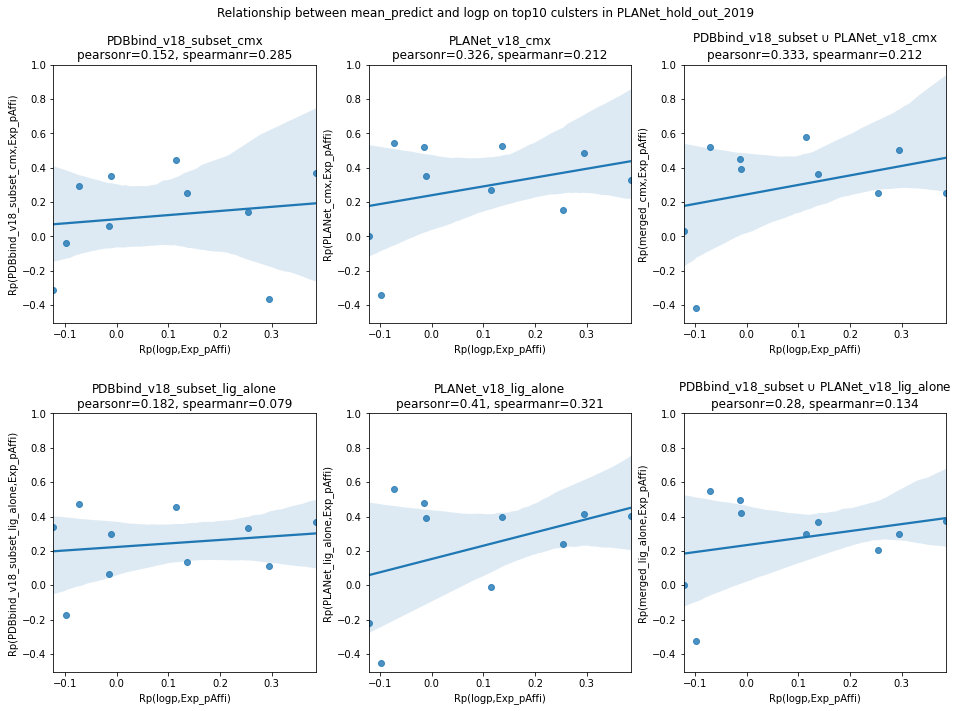

In [66]:
prop='logp'
fig = plt.figure(figsize=(16,16))
for i, model in enumerate(models):
    for j, tp in enumerate(tps):
        # print((i+1)+6*j)
        ax = fig.add_subplot(3, 3, (i+1)+3*j)
        # fig, ax = plt.subplots(figsize=(6,6))
        # sns.scatterplot(x='mw', y=f'{model}_{tp}_mean', data=hold_out_hdpdease_mean_pred)
        sns.regplot(x=prop, y=f'{model}_{tp}_mean', data=prop_correlation)

        # ax.set_xlim(0, 600)
        ax.set_ylim(
            min([min(prop_correlation[name]) for name in list(mean_pred_df.columns.drop(['unique_identify', 'y_true']))])-0.05,
            1
        )
        ax.set_ylabel(rename_dict[f'{model}_{tp}_mean'])
        ax.set_xlabel(rename_dict[prop])

        ax.set_title(f'{simple_dict[model]}_{tp}\npearsonr={round(stats.pearsonr(prop_correlation[f"{model}_{tp}_mean"], prop_correlation[prop])[0], 3)}, spearmanr={round(stats.spearmanr(prop_correlation[f"{model}_{tp}_mean"], prop_correlation[prop])[0], 3)}')

plt.subplots_adjust(left=0.125,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.93, 
                    wspace=0.2, 
                    hspace=0.35)
plt.suptitle(f'Relationship between mean_predict and {prop} on top10 culsters in PLANet_hold_out_2019')
plt.savefig(f'/pubhome/xli02/project/PLIM/deep_learning/FAST/fast_plim/hold_out_2019/4-evaluation/test_on_PLANet_hold_out_2019/mean_of_5_models/pfam_cluster/{prop}_relate_with_6_models.png', dpi=300, bbox_inches='tight')

# GPCR_A

In [22]:
gpcr_a = mean_pred_df_with_prop_pfam[mean_pred_df_with_prop_pfam['PCV_cluster']=='GPCR_A'].copy()
gpcr_a.sort_values(by='y_true', inplace=True)
gpcr_a

,unique_identify,y_true,PDBbind_minimized_v18_subset_cmx_mean,PDBbind_minimized_v18_subset_lig_alone_mean,PLANet_v18_cmx_mean,PLANet_v18_lig_alone_mean,PDBbind_minimized_v18_subset_union_PLANet_v18_cmx_mean,PDBbind_minimized_v18_subset_union_PLANet_v18_lig_alone_mean,Target_chembl_id,Cry_lig_name,...,target_compnd,mw,logp,rotb,hbd,hba,q,HA,dataset,PCV_cluster
2244,CHEMBL251_6gdg_CHEMBL426537,4.45,7.883714,7.000507,5.732726,5.409891,5.677414,5.802628,CHEMBL251,6gdg,...,CHEMBL251_CHEMBL426537,411.418,0.11932,4.0,4.0,10.0,0.0,30.0,PLANet,GPCR_A
2218,CHEMBL251_6gdg_CHEMBL220334,4.50,8.478796,7.046917,5.746378,5.346539,6.094438,5.588923,CHEMBL251,6gdg,...,CHEMBL251_CHEMBL220334,494.552,1.29730,8.0,4.0,10.0,0.0,36.0,PLANet,GPCR_A
2187,CHEMBL251_5wf6_CHEMBL514701,4.50,8.300238,7.900762,5.877071,5.929508,5.718165,5.685761,CHEMBL251,5wf6,...,CHEMBL251_CHEMBL514701,428.320,2.32830,4.0,3.0,8.0,0.0,28.0,PLANet,GPCR_A
2253,CHEMBL251_6gdg_CHEMBL575027,4.61,8.004734,6.044315,5.580681,5.188618,5.821608,5.212502,CHEMBL251,6gdg,...,CHEMBL251_CHEMBL575027,409.406,-0.97200,3.0,4.0,10.0,0.0,30.0,PLANet,GPCR_A
2185,CHEMBL251_5wf6_CHEMBL477665,4.62,8.334357,7.559244,5.659328,5.073587,5.681558,5.622702,CHEMBL251,5wf6,...,CHEMBL251_CHEMBL477665,393.875,1.67490,4.0,3.0,8.0,0.0,27.0,PLANet,GPCR_A
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2071,CHEMBL249_6e59_CHEMBL140626,10.00,6.883062,7.702804,6.353472,7.077004,7.012140,6.872756,CHEMBL249,6e59,...,CHEMBL249_CHEMBL140626,467.443,2.92850,6.0,3.0,5.0,1.0,33.0,PLANet,GPCR_A
2073,CHEMBL249_6e59_CHEMBL143587,10.05,7.092670,8.094804,6.117736,6.907478,6.926677,6.447230,CHEMBL249,6e59,...,CHEMBL249_CHEMBL143587,517.450,3.80820,6.0,3.0,5.0,1.0,36.0,PLANet,GPCR_A
2094,CHEMBL251_5wf5_CHEMBL131242,10.10,8.353533,6.705135,7.223163,7.757889,7.539389,7.195646,CHEMBL251,5wf5,...,CHEMBL251_CHEMBL131242,615.759,1.30630,12.0,6.0,10.0,1.0,45.0,PLANet,GPCR_A
2170,CHEMBL251_5wf6_CHEMBL337080,10.30,8.123699,7.371679,7.266981,8.162561,7.408686,7.787519,CHEMBL251,5wf6,...,CHEMBL251_CHEMBL337080,601.732,1.79060,10.0,6.0,10.0,1.0,44.0,PLANet,GPCR_A


In [23]:
PLANet_v18_simi_8 = pd.read_csv('/pubhome/xli02/project/PLIM/deep_learning/FAST/fast_plim/hold_out_2019/4-evaluation/test_on_PLANet_hold_out_2019/similarity/PLANet_v18_in_PLANet_hold_out_2019/simi_0.8.csv', sep='\t')
gpcr_a_simi_8_with_PLANet_v18 = gpcr_a.merge(PLANet_v18_simi_8.rename(columns={'PLANet_hold_out_2019_name':'unique_identify'}), on='unique_identify')
gpcr_a_simi_8_with_PLANet_v18

,unique_identify,y_true,PDBbind_minimized_v18_subset_cmx_mean,PDBbind_minimized_v18_subset_lig_alone_mean,PLANet_v18_cmx_mean,PLANet_v18_lig_alone_mean,PDBbind_minimized_v18_subset_union_PLANet_v18_cmx_mean,PDBbind_minimized_v18_subset_union_PLANet_v18_lig_alone_mean,Target_chembl_id,Cry_lig_name,...,q,HA,dataset,PCV_cluster,PLANet_hold_out_2019_affi,PLANet_hold_out_2019_smiles,PLANet_v18_cpnd_name,PLANet_v18_cpnd_affi,PLANet_v18_cpnd_smiles,similarity
0,CHEMBL251_6gdg_CHEMBL220334,4.50,8.478796,7.046917,5.746378,5.346539,6.094438,5.588923,CHEMBL251,6gdg,...,0.0,36.0,PLANet,GPCR_A,4.498941,CCCCCc1ccc(C#Cc2nc(NOC)c3ncn([C@@H]4O[C@H](C(=...,CHEMBL251_5g53_CHEMBL374336,4.567031,CCCCCc1ccc(C#Cc2nc(NOC)c3ncn([C@@H]4O[C@H](C(=...,0.878378
1,CHEMBL251_6gdg_CHEMBL575027,4.61,8.004734,6.044315,5.580681,5.188618,5.821608,5.212502,CHEMBL251,6gdg,...,0.0,30.0,PLANet,GPCR_A,4.614394,CNC(=O)[C@H]1O[C@@H](n2cnc3c(NC)nc(C#Cc4ccccn4...,CHEMBL251_2ydo_CHEMBL223514,4.744727,CNC(=O)[C@H]1O[C@@H](n2cnc3c(NOC)nc(C#Cc4ccccn...,0.861538
2,CHEMBL251_5wf6_CHEMBL477665,4.62,8.334357,7.559244,5.659328,5.073587,5.681558,5.622702,CHEMBL251,5wf6,...,0.0,27.0,PLANet,GPCR_A,4.619789,C[C@@]1(O)[C@H](O)[C@@H](CCl)O[C@H]1n1cnc2c(NC...,CHEMBL251_3qak_CHEMBL522095,5.056505,C[C@@]1(O)[C@H](O)[C@@H](CO)O[C@H]1n1cnc2c(NC3...,0.854839
3,CHEMBL251_6gdg_CHEMBL573950,4.98,8.175899,6.431472,5.939200,5.262637,6.219283,5.527088,CHEMBL251,6gdg,...,0.0,33.0,PLANet,GPCR_A,4.982967,CNC(=O)[C@H]1O[C@@H](n2cnc3c(NOC)nc(C#Cc4ccc(O...,CHEMBL251_2ydo_CHEMBL221206,4.787812,CNC(=O)[C@H]1O[C@@H](n2cnc3c(NOC)nc(C#Cc4ccccc...,0.848485
4,CHEMBL251_6gdg_CHEMBL573950,4.98,8.175899,6.431472,5.939200,5.262637,6.219283,5.527088,CHEMBL251,6gdg,...,0.0,33.0,PLANet,GPCR_A,4.982967,CNC(=O)[C@H]1O[C@@H](n2cnc3c(NOC)nc(C#Cc4ccc(O...,CHEMBL251_5g53_CHEMBL223456,4.832683,CNC(=O)[C@H]1O[C@@H](n2cnc3c(NOC)nc(C#Cc4ccc(C...,0.863636
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
164,CHEMBL251_5wf5_CHEMBL2096798,8.64,8.079940,6.778979,7.151307,7.283085,7.230537,7.465800,CHEMBL251,5wf5,...,0.0,36.0,PLANet,GPCR_A,8.637862,CCn1nnc([C@H]2O[C@@H](n3cnc4c(N)nc(N[C@H](C)Cc...,CHEMBL251_3qak_CHEMBL3740436,7.931814,CCn1nnc([C@H]2O[C@@H](n3cnc4c(N)nc(NC(C)Cc5ccc...,0.842105
165,CHEMBL251_5wf5_CHEMBL2096798,8.64,8.079940,6.778979,7.151307,7.283085,7.230537,7.465800,CHEMBL251,5wf5,...,0.0,36.0,PLANet,GPCR_A,8.637862,CCn1nnc([C@H]2O[C@@H](n3cnc4c(N)nc(N[C@H](C)Cc...,CHEMBL251_3qak_CHEMBL3741901,7.679854,CCn1nnc([C@H]2O[C@@H](n3cnc4c(N)nc(NC(C)Cc5ccc...,0.858974
166,CHEMBL251_5wf5_CHEMBL2096798,8.64,8.079940,6.778979,7.151307,7.283085,7.230537,7.465800,CHEMBL251,5wf5,...,0.0,36.0,PLANet,GPCR_A,8.637862,CCn1nnc([C@H]2O[C@@H](n3cnc4c(N)nc(N[C@H](C)Cc...,CHEMBL251_3qak_CHEMBL3742258,7.785156,CCn1nnc([C@H]2O[C@@H](n3cnc4c(N)nc(NC(C)Cc5ccc...,0.820513
167,CHEMBL251_5wf5_CHEMBL131242,10.10,8.353533,6.705135,7.223163,7.757889,7.539389,7.195646,CHEMBL251,5wf5,...,1.0,45.0,PLANet,GPCR_A,10.096910,CCNC(=O)[C@H]1O[C@@H](n2cnc3c(NCC(c4ccccc4)c4c...,CHEMBL251_3qak_CHEMBL403478,8.045757,CCNC(=O)[C@H]1O[C@@H](n2cnc3c(NCC(c4ccccc4)c4c...,0.835443


In [24]:
len(set(gpcr_a_simi_8_with_PLANet_v18['unique_identify']))

82

In [25]:
len(set(gpcr_a_simi_8_with_PLANet_v18['PLANet_v18_cpnd_name']))

77

In [164]:
gpcr_a_simi_8_with_PLANet_v18[gpcr_a_simi_8_with_PLANet_v18['unique_identify']=='CHEMBL251_6gdg_CHEMBL258535']

,unique_identify,y_true,PDBbind_minimized_v18_subset_cmx_mean,PDBbind_minimized_v18_subset_lig_alone_mean,PLANet_v18_cmx_mean,PLANet_v18_lig_alone_mean,PDBbind_minimized_v18_subset_union_PLANet_v18_cmx_mean,PDBbind_minimized_v18_subset_union_PLANet_v18_lig_alone_mean,Target_chembl_id,Cry_lig_name,...,q,HA,dataset,PCV_cluster,PLANet_hold_out_2019_affi,PLANet_hold_out_2019_smiles,PLANet_v18_cpnd_name,PLANet_v18_cpnd_affi,PLANet_v18_cpnd_smiles,similarity
84,CHEMBL251_6gdg_CHEMBL258535,7.19,7.863577,6.911732,6.647111,6.18581,6.033958,6.404674,CHEMBL251,6gdg,...,0.0,31.0,PLANet,GPCR_A,7.19382,CCNc1nc(C#C[C@@H](O)c2ccccc2)nc2c1ncn2[C@@H]1O...,CHEMBL251_2ydo_CHEMBL2092786,6.563837,CNc1nc(C#CC(O)c2ccccc2)nc2c1ncn2[C@@H]1O[C@H](...,0.84375
85,CHEMBL251_6gdg_CHEMBL258535,7.19,7.863577,6.911732,6.647111,6.18581,6.033958,6.404674,CHEMBL251,6gdg,...,0.0,31.0,PLANet,GPCR_A,7.19382,CCNc1nc(C#C[C@@H](O)c2ccccc2)nc2c1ncn2[C@@H]1O...,CHEMBL251_2ydo_CHEMBL261453,6.787812,CNc1nc(C#C[C@@H](O)c2ccccc2)nc2c1ncn2[C@@H]1O[...,0.84375
86,CHEMBL251_6gdg_CHEMBL258535,7.19,7.863577,6.911732,6.647111,6.18581,6.033958,6.404674,CHEMBL251,6gdg,...,0.0,31.0,PLANet,GPCR_A,7.19382,CCNc1nc(C#C[C@@H](O)c2ccccc2)nc2c1ncn2[C@@H]1O...,CHEMBL251_5g53_CHEMBL410115,5.806875,CNc1nc(C#C[C@H](O)c2ccccc2)nc2c1ncn2[C@@H]1O[C...,0.84375


In [163]:
gpcr_a_simi_8_with_PLANet_v18[['unique_identify', 'similarity', 'y_true']].groupby(['unique_identify', 'similarity']).count().sort_values(by='y_true')

y_true
unique_identify              similarity        
CHEMBL1833_6drx_CHEMBL119443 0.806452         1
CHEMBL251_5wf6_CHEMBL590718  0.821429         1
                             0.802326         1
CHEMBL251_5wf6_CHEMBL590484  0.862500         1
                             0.851852         1
...                                         ...
CHEMBL251_6gdg_CHEMBL2092787 0.843750         3
CHEMBL251_5wf5_CHEMBL3416787 0.804878         3
CHEMBL251_5wf5_CHEMBL3416786 0.846154         3
CHEMBL251_6gdg_CHEMBL2092788 0.843750         3
CHEMBL251_6gdg_CHEMBL258535  0.843750         3

[142 rows x 1 columns]

In [89]:
stats.pearsonr(gpcr_a_simi_8_with_PLANet_v18['PLANet_v18_cpnd_affi'], gpcr_a_simi_8_with_PLANet_v18['PLANet_v18_cmx_mean'])

(0.7833212627450021, 2.586540904281274e-36)

In [124]:
round(stats.pearsonr(gpcr_a_simi_8_with_PLANet_v18['PLANet_v18_cpnd_affi'], gpcr_a_simi_8_with_PLANet_v18['PLANet_v18_cmx_mean'])[0], 3)

0.783

In [123]:
round(mean_absolute_error(gpcr_a_simi_8_with_PLANet_v18['PLANet_v18_cpnd_affi'], gpcr_a_simi_8_with_PLANet_v18['PLANet_v18_cmx_mean']), 3)

0.589

In [29]:
gpcr_a_simi_8_with_PLANet_v18.to_csv('/pubhome/xli02/project/PLIM/deep_learning/FAST/fast_plim/hold_out_2019/4-evaluation/test_on_PLANet_hold_out_2019/mean_of_5_models/pfam_cluster/GPCR_A/gpcr_a_simi_8_with_PLANet_v18_82.csv', sep='\t', index=False)

In [26]:
cluster = 'GPCR_A'

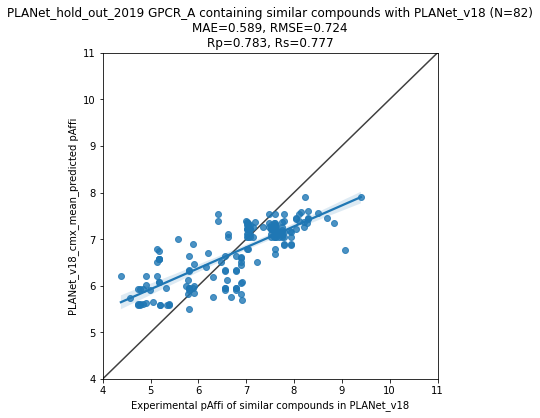

In [27]:

fig, ax = plt.subplots(figsize=(6,6))
sns.regplot(data=gpcr_a_simi_8_with_PLANet_v18, x='PLANet_v18_cpnd_affi', y='PLANet_v18_cmx_mean')
lims = [
        4,11
    ]
ax.set_xlim(lims)
ax.set_ylim(lims)
ax.plot(lims, lims, "k-", alpha=0.75, zorder=0)
plt.xlabel("Experimental pAffi of similar compounds in PLANet_v18")
plt.ylabel("PLANet_v18_cmx_mean_predicted pAffi")
plt.title(f"PLANet_hold_out_2019 {cluster} containing similar compounds with PLANet_v18 (N={len(set(gpcr_a_simi_8_with_PLANet_v18['unique_identify']))})\nMAE={round(mean_absolute_error(gpcr_a_simi_8_with_PLANet_v18['PLANet_v18_cpnd_affi'], gpcr_a_simi_8_with_PLANet_v18['PLANet_v18_cmx_mean']), 3)}, RMSE={round(np.sqrt(mean_squared_error(gpcr_a_simi_8_with_PLANet_v18['PLANet_v18_cpnd_affi'], gpcr_a_simi_8_with_PLANet_v18['PLANet_v18_cmx_mean'])), 3)}\nRp={round(stats.pearsonr(gpcr_a_simi_8_with_PLANet_v18['PLANet_v18_cpnd_affi'], gpcr_a_simi_8_with_PLANet_v18['PLANet_v18_cmx_mean'])[0], 3)}, Rs={round(stats.spearmanr(gpcr_a_simi_8_with_PLANet_v18['PLANet_v18_cpnd_affi'], gpcr_a_simi_8_with_PLANet_v18['PLANet_v18_cmx_mean'])[0], 3)}")
# handles, labels = ax.get_legend_handles_labels()

plt.savefig(f'/pubhome/xli02/project/PLIM/deep_learning/FAST/fast_plim/hold_out_2019/4-evaluation/test_on_PLANet_hold_out_2019/mean_of_5_models/pfam_cluster/GPCR_A/{cluster}_scatter_PLANet_cmx_simi_8_scatter.png', dpi=300, bbox_inches='tight')

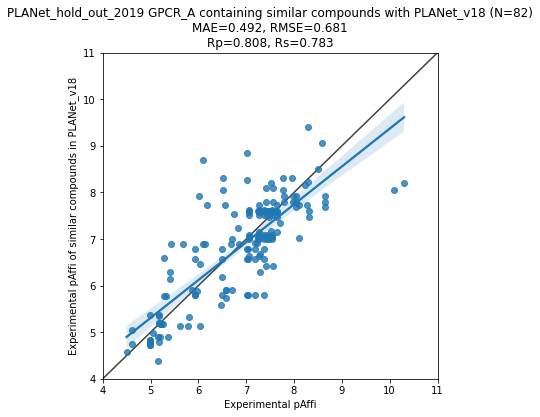

In [28]:
fig, ax = plt.subplots(figsize=(6,6))
sns.regplot(data=gpcr_a_simi_8_with_PLANet_v18, x='PLANet_hold_out_2019_affi', y='PLANet_v18_cpnd_affi')
lims = [
        4, 11
    ]
ax.set_xlim(lims)
ax.set_ylim(lims)
ax.plot(lims, lims, "k-", alpha=0.75, zorder=0)
plt.xlabel("Experimental pAffi")
plt.ylabel("Experimental pAffi of similar compounds in PLANet_v18")
plt.title(f"PLANet_hold_out_2019 {cluster} containing similar compounds with PLANet_v18 (N={len(set(gpcr_a_simi_8_with_PLANet_v18['unique_identify']))})\nMAE={round(mean_absolute_error(gpcr_a_simi_8_with_PLANet_v18['PLANet_v18_cpnd_affi'], gpcr_a_simi_8_with_PLANet_v18['PLANet_hold_out_2019_affi']), 3)}, RMSE={round(np.sqrt(mean_squared_error(gpcr_a_simi_8_with_PLANet_v18['PLANet_v18_cpnd_affi'], gpcr_a_simi_8_with_PLANet_v18['PLANet_hold_out_2019_affi'])), 3)}\nRp={round(stats.pearsonr(gpcr_a_simi_8_with_PLANet_v18['PLANet_v18_cpnd_affi'], gpcr_a_simi_8_with_PLANet_v18['PLANet_hold_out_2019_affi'])[0], 3)}, Rs={round(stats.spearmanr(gpcr_a_simi_8_with_PLANet_v18['PLANet_v18_cpnd_affi'], gpcr_a_simi_8_with_PLANet_v18['PLANet_hold_out_2019_affi'])[0], 3)}")
# handles, labels = ax.get_legend_handles_labels()

plt.savefig(f'/pubhome/xli02/project/PLIM/deep_learning/FAST/fast_plim/hold_out_2019/4-evaluation/test_on_PLANet_hold_out_2019/mean_of_5_models/pfam_cluster/GPCR_A/{cluster}_scatter_PLANet_cmx_simi_8_true_with_simi.png', dpi=300, bbox_inches='tight')

<AxesSubplot:xlabel='PLANet_v18_cpnd_affi', ylabel='PLANet_v18_cmx_mean'>

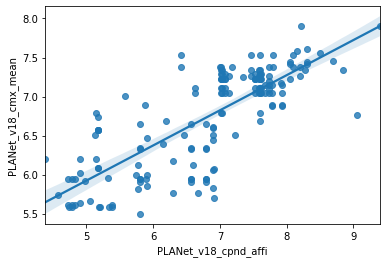

In [88]:
sns.regplot(data=gpcr_a_simi_8_with_PLANet_v18, x='PLANet_v18_cpnd_affi', y='PLANet_v18_cmx_mean')

In [90]:
PDBbind_v18_simi_8 = pd.read_csv('/pubhome/xli02/project/PLIM/deep_learning/FAST/fast_plim/hold_out_2019/4-evaluation/test_on_PLANet_hold_out_2019/similarity/PDBbind_v18_subset_in_PLANet_hold_out_2019/simi_0.8.csv', sep='\t')
gpcr_a_simi_8_with_PDBbind_v18 = gpcr_a.merge(PDBbind_v18_simi_8.rename(columns={'PLANet_hold_out_2019_name':'unique_identify'}), on='unique_identify')
gpcr_a_simi_8_with_PDBbind_v18

,unique_identify,y_true,PDBbind_minimized_v18_subset_cmx_mean,PDBbind_minimized_v18_subset_lig_alone_mean,PLANet_v18_cmx_mean,PLANet_v18_lig_alone_mean,PDBbind_minimized_v18_subset_union_PLANet_v18_cmx_mean,PDBbind_minimized_v18_subset_union_PLANet_v18_lig_alone_mean,Target_chembl_id,Cry_lig_name,...,q,HA,dataset,PCV_cluster,PLANet_hold_out_2019_affi,PLANet_hold_out_2019_smiles,PDBbind_v18_subset_cpnd_name,PDBbind_v18_subset_cpnd_affi,PDBbind_v18_subset_cpnd_smiles,similarity


# MW size

In [93]:
gpcr_a

,unique_identify,y_true,PDBbind_minimized_v18_subset_cmx_mean,PDBbind_minimized_v18_subset_lig_alone_mean,PLANet_v18_cmx_mean,PLANet_v18_lig_alone_mean,PDBbind_minimized_v18_subset_union_PLANet_v18_cmx_mean,PDBbind_minimized_v18_subset_union_PLANet_v18_lig_alone_mean,Target_chembl_id,Cry_lig_name,...,target_compnd,mw,logp,rotb,hbd,hba,q,HA,dataset,PCV_cluster
2244,CHEMBL251_6gdg_CHEMBL426537,4.45,7.883714,7.000507,5.732726,5.409891,5.677414,5.802628,CHEMBL251,6gdg,...,CHEMBL251_CHEMBL426537,411.418,0.11932,4.0,4.0,10.0,0.0,30.0,PLANet,GPCR_A
2218,CHEMBL251_6gdg_CHEMBL220334,4.50,8.478796,7.046917,5.746378,5.346539,6.094438,5.588923,CHEMBL251,6gdg,...,CHEMBL251_CHEMBL220334,494.552,1.29730,8.0,4.0,10.0,0.0,36.0,PLANet,GPCR_A
2187,CHEMBL251_5wf6_CHEMBL514701,4.50,8.300238,7.900762,5.877071,5.929508,5.718165,5.685761,CHEMBL251,5wf6,...,CHEMBL251_CHEMBL514701,428.320,2.32830,4.0,3.0,8.0,0.0,28.0,PLANet,GPCR_A
2253,CHEMBL251_6gdg_CHEMBL575027,4.61,8.004734,6.044315,5.580681,5.188618,5.821608,5.212502,CHEMBL251,6gdg,...,CHEMBL251_CHEMBL575027,409.406,-0.97200,3.0,4.0,10.0,0.0,30.0,PLANet,GPCR_A
2185,CHEMBL251_5wf6_CHEMBL477665,4.62,8.334357,7.559244,5.659328,5.073587,5.681558,5.622702,CHEMBL251,5wf6,...,CHEMBL251_CHEMBL477665,393.875,1.67490,4.0,3.0,8.0,0.0,27.0,PLANet,GPCR_A
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2071,CHEMBL249_6e59_CHEMBL140626,10.00,6.883062,7.702804,6.353472,7.077004,7.012140,6.872756,CHEMBL249,6e59,...,CHEMBL249_CHEMBL140626,467.443,2.92850,6.0,3.0,5.0,1.0,33.0,PLANet,GPCR_A
2073,CHEMBL249_6e59_CHEMBL143587,10.05,7.092670,8.094804,6.117736,6.907478,6.926677,6.447230,CHEMBL249,6e59,...,CHEMBL249_CHEMBL143587,517.450,3.80820,6.0,3.0,5.0,1.0,36.0,PLANet,GPCR_A
2094,CHEMBL251_5wf5_CHEMBL131242,10.10,8.353533,6.705135,7.223163,7.757889,7.539389,7.195646,CHEMBL251,5wf5,...,CHEMBL251_CHEMBL131242,615.759,1.30630,12.0,6.0,10.0,1.0,45.0,PLANet,GPCR_A
2170,CHEMBL251_5wf6_CHEMBL337080,10.30,8.123699,7.371679,7.266981,8.162561,7.408686,7.787519,CHEMBL251,5wf6,...,CHEMBL251_CHEMBL337080,601.732,1.79060,10.0,6.0,10.0,1.0,44.0,PLANet,GPCR_A


In [98]:
gpcr_a_melted = gpcr_a[['unique_identify', 'y_true', 'mw', 'PDBbind_minimized_v18_subset_cmx_mean', 'PLANet_v18_cmx_mean']].melt(id_vars=['unique_identify', 'y_true', 'mw'], var_name='model')
gpcr_a_melted['mw']

,unique_identify,y_true,mw,model,value
0,CHEMBL251_6gdg_CHEMBL426537,4.45,411.418,PDBbind_minimized_v18_subset_cmx_mean,7.883714
1,CHEMBL251_6gdg_CHEMBL220334,4.50,494.552,PDBbind_minimized_v18_subset_cmx_mean,8.478796
2,CHEMBL251_5wf6_CHEMBL514701,4.50,428.320,PDBbind_minimized_v18_subset_cmx_mean,8.300238
3,CHEMBL251_6gdg_CHEMBL575027,4.61,409.406,PDBbind_minimized_v18_subset_cmx_mean,8.004734
4,CHEMBL251_5wf6_CHEMBL477665,4.62,393.875,PDBbind_minimized_v18_subset_cmx_mean,8.334357
...,...,...,...,...,...
459,CHEMBL249_6e59_CHEMBL140626,10.00,467.443,PLANet_v18_cmx_mean,6.353472
460,CHEMBL249_6e59_CHEMBL143587,10.05,517.450,PLANet_v18_cmx_mean,6.117736
461,CHEMBL251_5wf5_CHEMBL131242,10.10,615.759,PLANet_v18_cmx_mean,7.223163
462,CHEMBL251_5wf6_CHEMBL337080,10.30,601.732,PLANet_v18_cmx_mean,7.266981


In [117]:
cluster='GPCR_A'

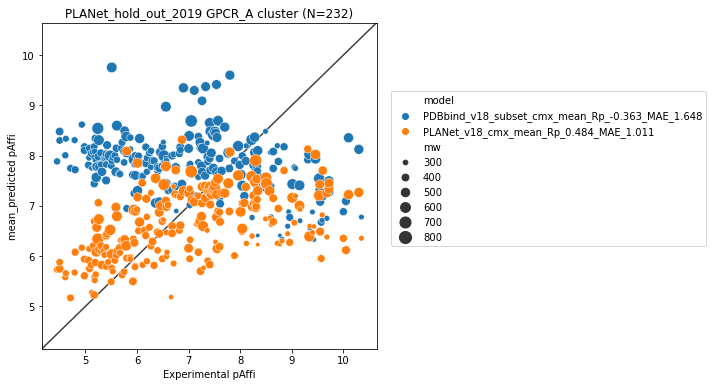

In [119]:

fig, ax = plt.subplots(figsize=(6,6))
sns.scatterplot(data=gpcr_a_melted, x="y_true", y="value", hue='model', size='mw', sizes=(20,150))
lims = [
        np.min([ax.get_xlim(), ax.get_ylim()]),
        np.max([ax.get_xlim(), ax.get_ylim()]),
    ]
ax.set_xlim(lims)
ax.set_ylim(lims)
ax.plot(lims, lims, "k-", alpha=0.75, zorder=0)
plt.xlabel("Experimental pAffi")
plt.ylabel("mean_predicted pAffi")
plt.title(f'PLANet_hold_out_2019 {cluster} cluster (N={len(gpcr_a)})')
handles, labels = ax.get_legend_handles_labels()
# ax.legend(handles[:2], labels[:2], loc='upper left')
PDBbind_v18_subset_Rp = round(stats.pearsonr(gpcr_a["y_true"], gpcr_a["PDBbind_minimized_v18_subset_cmx_mean"])[0], 3)
PLANet_v18_Rp = round(stats.pearsonr(gpcr_a["y_true"], gpcr_a["PLANet_v18_cmx_mean"])[0], 3)

ax.legend(handles, ['model',f'PDBbind_v18_subset_cmx_mean_Rp_{PDBbind_v18_subset_Rp}_MAE_{round(mean_absolute_error(gpcr_a["y_true"], gpcr_a["PDBbind_minimized_v18_subset_cmx_mean"]), 3)}', f'PLANet_v18_cmx_mean_Rp_{PLANet_v18_Rp}_MAE_{round(mean_absolute_error(gpcr_a["y_true"], gpcr_a["PLANet_v18_cmx_mean"]), 3)}'] + labels[3:], loc='lower right', bbox_to_anchor=(2, 0.3))
plt.savefig(f'/pubhome/xli02/project/PLIM/deep_learning/FAST/fast_plim/hold_out_2019/4-evaluation/test_on_PLANet_hold_out_2019/mean_of_5_models/pfam_cluster/GPCR_A/{cluster}_scatter_PLANet_vs_PIP_cmx_mean_Mw_size.png', dpi=300, bbox_inches='tight')

# most similar compound

In [134]:
from pathlib import Path
from rdkit import Chem
from rdkit.Chem import rdMolDescriptors, Draw, AllChem
from rdkit import DataStructs

In [135]:
pdbbind_dir = '/pubhome/xli02/Downloads/dataset/PDBbind/PDBbind_v2019'

In [136]:
def obtain_training_fps(data_df, dataset_name):
    mols = []
    mol_fps = []
    skipped_mols = []
    for row in data_df.itertuples():
        if 'pdb_id' in data_df.columns.values:
            uniq_id = row.pdb_id
            lig_file = f'{pdbbind_dir}/general_structure_only/{uniq_id}/{uniq_id}_ligand.smi'
            if not Path(lig_file).exists():
                print(f'{uniq_id} of PDBbind not exsits, skipped.')
                skipped_mols.append(uniq_id)
                continue
            compnd_mol = Chem.SmilesMolSupplier(lig_file, delimiter='\t', titleLine=False)[0]
        else:
            uniq_id = row.unique_identify
            if '_' in uniq_id:
                if uniq_id not in list(PLANet_property['unique_identify']):
                    print(f'{uniq_id} of PLANet not exsits in smiles_df, skipped.')
                    skipped_mols.append(uniq_id)
                    continue
                compnd_smi = PLANet_property[PLANet_property['unique_identify']==uniq_id]['Similar_compnd_smiles'].values[0]
                compnd_mol = Chem.MolFromSmiles(compnd_smi)
            else:
                lig_file = f'{pdbbind_dir}/general_structure_only/{uniq_id}/{uniq_id}_ligand.smi'
                if not Path(lig_file).exists():
                    print(f'{uniq_id} of PDBbind not exsits, skipped.')
                    skipped_mols.append(uniq_id)
                    continue
                compnd_mol = Chem.SmilesMolSupplier(lig_file, delimiter='\t', titleLine=False)[0]
        if compnd_mol is None:
            print(f'For compounds in {dataset_name}, {uniq_id} cannot be read by rdkit, skipped.')
            skipped_mols.append(uniq_id)
            continue
        compnd_mol.SetProp('_Name', uniq_id)
        mols.append(compnd_mol)
        mol_fps.append(rdMolDescriptors.GetMorganFingerprintAsBitVect(compnd_mol,2))
    return mols, mol_fps

In [ ]:
PDBbind_v18_subset_df = pd.read_csv('/pubhome/xli02/project/PLIM/deep_learning/FAST/fast_plim/hold_out_2019/index/rm_all_simi_1/PDBbind_v18_subset_rm_simi_1.csv', sep='\t')
PDBbind_v18_subset_mols, PDBbind_v18_subset_mol_fps = obtain_training_fps(PDBbind_v18_subset_df, 'PDBbind_v18_subset')

In [139]:
len(PDBbind_v18_subset_df)

5371

In [140]:
len(PDBbind_v18_subset_mols)

5350

In [142]:
PLANet_v18_df = pd.read_csv('/pubhome/xli02/project/PLIM/deep_learning/FAST/fast_plim/hold_out_2019/index/rm_all_simi_1/PLANet_v18_rm_simi_1.csv', sep='\t')
# PLANet_property = pd.read_csv('/pubhome/xli02/project/PLIM/analysis/20220812_paper/distribution/property/PLANet_property.csv', sep='\t')
# PLANet_v18_property = PLANet_property[PLANet_property['unique_identify'].isin(PLANet_v18_df['unique_identify'])]
# len(PLANet_v18_property)
PLANet_v18_mols, PLANet_v18_mol_fps = obtain_training_fps(PLANet_v18_df, 'PLANet_v18')

In [143]:
print(len(PLANet_v18_df), len(PLANet_v18_mols))

63604 63604


In [ ]:
PIPUP_v18_df = pd.read_csv('/pubhome/xli02/project/PLIM/deep_learning/FAST/fast_plim/hold_out_2019/index/rm_all_simi_1/PDBbind_v18_subset_union_PLANet_rm_simi_1.csv', sep='\t')
PIPUP_v18_mols, PIPUP_v18_mol_fps = obtain_training_fps(PIPUP_v18_df, 'PIPUP_v18')

In [145]:
print(len(PIPUP_v18_df), len(PIPUP_v18_mols))

68975 68954


In [146]:
gpcr_a_mols, gpcr_a_mol_fps = obtain_training_fps(gpcr_a, 'gpcr_a')
print(len(gpcr_a), len(gpcr_a_mols))

232 232


In [167]:
gpcr_a_mol_names = [mol.GetProp('_Name') for mol in gpcr_a_mols]

In [168]:
gpcr_a_mol_names.index('CHEMBL251_6gdg_CHEMBL258535')

129

In [170]:
a_list = DataStructs.BulkTanimotoSimilarity(gpcr_a_mol_fps[129], PLANet_v18_mol_fps)

In [173]:
# a_list.index(max(a_list))

20709

In [171]:
# np.argmax(a_list)

20709

In [186]:
# pd.Series(a_list).idxmax()

20709

In [193]:
# np.array(a_list)[np.where(np.array(a_list)==max(a_list))[0].tolist()]

array([0.84375, 0.84375, 0.84375])

In [181]:
np.where(np.array(a_list)==max(a_list))[0].tolist()

[20709, 20744, 21318]

In [172]:
# [idx for idx in range(len(a_list)) if a_list[idx] == max(a_list)]

[20709, 20744, 21318]

In [194]:
PIPUP_v18_mols[20709].GetProp('_Name')

'CHEMBL251_2ydo_CHEMBL2092786'

In [203]:
def calculate_simi(hold_2019_mols, hold_2019_mol_fps, hold_2019_df, mols_2, mol_fps_2, affi_df_2, set_name_1, set_name_2):
    max_simi_for_hold_2019_mols = []
    cols = [f'{set_name_1}_name', f'{set_name_1}_affi', f'{set_name_1}_smiles', f'{set_name_2}_cpnd_name', f'{set_name_2}_cpnd_affi', f'{set_name_2}_cpnd_smiles', 'similarity']
    lst = []
    for i, mol in enumerate(hold_2019_mols):
        simi_list = DataStructs.BulkTanimotoSimilarity(hold_2019_mol_fps[i], mol_fps_2)
        max_simi = max(simi_list)
        mol_name = mol.GetProp('_Name')
        mol_affi = hold_2019_df[hold_2019_df['unique_identify']==mol_name]['y_true'].values[0]
        mol_smiles = Chem.MolToSmiles(mol)
        # for j,simi in enumerate(simi_list):
        #     if simi > 0.8:
                # mol_affi = hold_2019_df[hold_2019_df['pdb_id']==mol_name]['-logAffi'].values[0]
        max_simi_idx = np.where(np.array(simi_list)==max(simi_list))[0].tolist()
        for idx in max_simi_idx:
            mol_2_name = mols_2[idx].GetProp('_Name')
            if 'pdb_id' in affi_df_2.columns.values:
                mol_2_affi = affi_df_2[affi_df_2['pdb_id']==mol_2_name]['-logAffi'].values[0]
            else:
                mol_2_affi = affi_df_2[affi_df_2['unique_identify']==mol_2_name]['-logAffi'].values[0]
            mol_2_smiles = Chem.MolToSmiles(mols_2[idx])
            lst.append([mol_name, mol_affi, mol_smiles, mol_2_name, mol_2_affi, mol_2_smiles, max_simi])
        max_simi_for_hold_2019_mols.append(max_simi)
    out_dir = f'/pubhome/xli02/project/PLIM/deep_learning/FAST/fast_plim/hold_out_2019/4-evaluation/test_on_PLANet_hold_out_2019/mean_of_5_models/pfam_cluster/GPCR_A/similarity/{set_name_2}_in_{set_name_1}' #
    if not Path(out_dir).exists():
        Path(out_dir).mkdir(parents=True)
    simi_df = pd.DataFrame(lst, columns=cols)
    simi_df.to_csv(f'{out_dir}/simi.csv', sep='\t', index=False)
    # print(f'For {set_name_1}, there are {max_simi_for_hold_2019_mols.count(1)} / {len(max_simi_for_hold_2019_mols)} PDB IDs same as(similarity=1, not considering chirality) {set_name_2}.')
    # print(f'similarity > 0.8: {len([n for n in max_simi_for_hold_2019_mols if n>0.8])} / {len(max_simi_for_hold_2019_mols)}')
    return max_simi_for_hold_2019_mols

In [204]:
max_simi_for_PLANet_hold_2019_test_PDBbind_v18_subset = calculate_simi(gpcr_a_mols, gpcr_a_mol_fps, gpcr_a, PDBbind_v18_subset_mols, PDBbind_v18_subset_mol_fps, PDBbind_v18_subset_df, f'gpcr_a', 'PDBbind_v18_subset')
max_simi_for_PLANet_hold_2019_test_Uw = calculate_simi(gpcr_a_mols, gpcr_a_mol_fps, gpcr_a, PLANet_v18_mols, PLANet_v18_mol_fps, PLANet_v18_df, f'gpcr_a', 'PLANet_v18')
max_simi_for_PLANet_hold_2019_test_PIPUP = calculate_simi(gpcr_a_mols, gpcr_a_mol_fps, gpcr_a, PIPUP_v18_mols, PIPUP_v18_mol_fps, PIPUP_v18_df, f'gpcr_a', 'PIPUP_v18')

In [206]:
max_simi_distribution = pd.DataFrame({"unique_identify": gpcr_a_mol_names, "PDBbind_v18_subset": max_simi_for_PLANet_hold_2019_test_PDBbind_v18_subset, "PLANet_v18": max_simi_for_PLANet_hold_2019_test_Uw, "PDBbind_v18_subset_union_PLANet_v18": max_simi_for_PLANet_hold_2019_test_PIPUP})
max_simi_distribution.to_csv(f'/pubhome/xli02/project/PLIM/deep_learning/FAST/fast_plim/hold_out_2019/4-evaluation/test_on_PLANet_hold_out_2019/mean_of_5_models/pfam_cluster/GPCR_A/similarity/all_3_models_max_simi_distribution.csv', sep='\t', index=False)

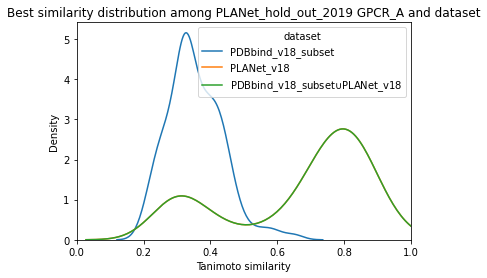

In [207]:
sns.kdeplot(max_simi_distribution['PDBbind_v18_subset'])
sns.kdeplot(max_simi_distribution['PLANet_v18'])
sns.kdeplot(max_simi_distribution['PDBbind_v18_subset_union_PLANet_v18'])
plt.xlabel("Tanimoto similarity")
plt.xlim(0,1)
plt.title(f'Best similarity distribution among PLANet_hold_out_2019 GPCR_A and dataset')
plt.legend(labels=['PDBbind_v18_subset', 'PLANet_v18', 'PDBbind_v18_subset' +r'$\cup$' 'PLANet_v18'], title = "dataset")
plt.savefig(f'/pubhome/xli02/project/PLIM/deep_learning/FAST/fast_plim/hold_out_2019/4-evaluation/test_on_PLANet_hold_out_2019/mean_of_5_models/pfam_cluster/GPCR_A/similarity/3_models.png', dpi=300, bbox_inches='tight')
# plt.close()

In [209]:
PDBbind_simi = pd.read_csv('/pubhome/xli02/project/PLIM/deep_learning/FAST/fast_plim/hold_out_2019/4-evaluation/test_on_PLANet_hold_out_2019/mean_of_5_models/pfam_cluster/GPCR_A/similarity/PDBbind_v18_subset_in_gpcr_a/simi.csv', sep='\t')
len(set(PDBbind_simi['gpcr_a_name']))

232

In [210]:
len(PDBbind_simi)

334

In [211]:
PDBbind_simi.columns

Index(['gpcr_a_name', 'gpcr_a_affi', 'gpcr_a_smiles',
       'PDBbind_v18_subset_cpnd_name', 'PDBbind_v18_subset_cpnd_affi',
       'PDBbind_v18_subset_cpnd_smiles', 'similarity'],
      dtype='object')

In [231]:
PDBbind_simi_pred = PDBbind_simi[['gpcr_a_name', 'gpcr_a_affi', 'PDBbind_v18_subset_cpnd_affi', 'similarity']].groupby(['gpcr_a_name', 'gpcr_a_affi']).median().reset_index()
PDBbind_simi_pred

,gpcr_a_name,gpcr_a_affi,PDBbind_v18_subset_cpnd_affi,similarity
0,CHEMBL1833_6drx_CHEMBL1065,8.12,7.510,0.305556
1,CHEMBL1833_6drx_CHEMBL119443,8.58,9.040,0.432432
2,CHEMBL1833_6drx_CHEMBL1200938,8.72,7.510,0.305556
3,CHEMBL1833_6drx_CHEMBL157138,8.49,9.040,0.500000
4,CHEMBL1833_6drx_CHEMBL263881,7.52,9.040,0.645161
...,...,...,...,...
227,CHEMBL3710_6m9t_CHEMBL3895324,6.52,6.535,0.384615
228,CHEMBL3710_6m9t_CHEMBL3967903,9.05,6.850,0.283784
229,CHEMBL3710_6m9t_CHEMBL3978305,6.27,6.535,0.271186
230,CHEMBL3710_6m9t_CHEMBL548,9.07,6.535,0.384615


In [217]:
PLANet_simi = pd.read_csv('/pubhome/xli02/project/PLIM/deep_learning/FAST/fast_plim/hold_out_2019/4-evaluation/test_on_PLANet_hold_out_2019/mean_of_5_models/pfam_cluster/GPCR_A/similarity/PLANet_v18_in_gpcr_a/simi.csv', sep='\t')
PLANet_simi.head(5)

,gpcr_a_name,gpcr_a_affi,gpcr_a_smiles,PLANet_v18_cpnd_name,PLANet_v18_cpnd_affi,PLANet_v18_cpnd_smiles,similarity
0,CHEMBL251_6gdg_CHEMBL426537,4.45,CONc1nc(C#Cc2ccc(C)cc2)nc2c1ncn2[C@@H]1O[C@H](...,CHEMBL251_5g53_CHEMBL223328,4.903090,CONc1nc(C#Cc2cccnc2)nc2c1ncn2[C@@H]1O[C@H](CO)...,0.764706
1,CHEMBL251_6gdg_CHEMBL220334,4.50,CCCCCc1ccc(C#Cc2nc(NOC)c3ncn([C@@H]4O[C@H](C(=...,CHEMBL251_5g53_CHEMBL374336,4.567031,CCCCCc1ccc(C#Cc2nc(NOC)c3ncn([C@@H]4O[C@H](C(=...,0.878378
2,CHEMBL251_5wf6_CHEMBL514701,4.50,C[C@@]1(O)[C@H](O)[C@@H](CCl)O[C@H]1n1cnc2c(NC...,CHEMBL251_3qak_CHEMBL514541,5.688246,O[C@@H]1[C@@H](CCl)O[C@@H](n2cnc3c(NC4CC5CCC4C...,0.705882
3,CHEMBL251_6gdg_CHEMBL575027,4.61,CNC(=O)[C@H]1O[C@@H](n2cnc3c(NC)nc(C#Cc4ccccn4...,CHEMBL251_2ydo_CHEMBL223514,4.744727,CNC(=O)[C@H]1O[C@@H](n2cnc3c(NOC)nc(C#Cc4ccccn...,0.861538
4,CHEMBL251_5wf6_CHEMBL477665,4.62,C[C@@]1(O)[C@H](O)[C@@H](CCl)O[C@H]1n1cnc2c(NC...,CHEMBL251_3qak_CHEMBL522095,5.056505,C[C@@]1(O)[C@H](O)[C@@H](CO)O[C@H]1n1cnc2c(NC3...,0.854839


In [232]:
PLANet_simi_pred = PLANet_simi[['gpcr_a_name', 'gpcr_a_affi', 'PLANet_v18_cpnd_affi', 'similarity']].groupby(['gpcr_a_name', 'gpcr_a_affi']).median().reset_index()
PLANet_simi_pred

,gpcr_a_name,gpcr_a_affi,PLANet_v18_cpnd_affi,similarity
0,CHEMBL1833_6drx_CHEMBL1065,8.12,9.057772,0.723077
1,CHEMBL1833_6drx_CHEMBL119443,8.58,9.057772,0.806452
2,CHEMBL1833_6drx_CHEMBL1200938,8.72,9.057772,0.723077
3,CHEMBL1833_6drx_CHEMBL157138,8.49,9.057772,0.585714
4,CHEMBL1833_6drx_CHEMBL263881,7.52,7.267606,0.666667
...,...,...,...,...
227,CHEMBL3710_6m9t_CHEMBL3895324,6.52,5.508638,0.396226
228,CHEMBL3710_6m9t_CHEMBL3967903,9.05,5.397940,0.283333
229,CHEMBL3710_6m9t_CHEMBL3978305,6.27,5.508638,0.283333
230,CHEMBL3710_6m9t_CHEMBL548,9.07,5.508638,0.396226


In [233]:
PIPUP_simi = pd.read_csv('/pubhome/xli02/project/PLIM/deep_learning/FAST/fast_plim/hold_out_2019/4-evaluation/test_on_PLANet_hold_out_2019/mean_of_5_models/pfam_cluster/GPCR_A/similarity/PIPUP_v18_in_gpcr_a/simi.csv', sep='\t')
PIPUP_simi_pred = PIPUP_simi[['gpcr_a_name', 'gpcr_a_affi', 'PIPUP_v18_cpnd_affi', 'similarity']].groupby(['gpcr_a_name', 'gpcr_a_affi']).median().reset_index()
PIPUP_simi_pred

,gpcr_a_name,gpcr_a_affi,PIPUP_v18_cpnd_affi,similarity
0,CHEMBL1833_6drx_CHEMBL1065,8.12,9.057772,0.723077
1,CHEMBL1833_6drx_CHEMBL119443,8.58,9.057772,0.806452
2,CHEMBL1833_6drx_CHEMBL1200938,8.72,9.057772,0.723077
3,CHEMBL1833_6drx_CHEMBL157138,8.49,9.057772,0.585714
4,CHEMBL1833_6drx_CHEMBL263881,7.52,7.267606,0.666667
...,...,...,...,...
227,CHEMBL3710_6m9t_CHEMBL3895324,6.52,5.508638,0.396226
228,CHEMBL3710_6m9t_CHEMBL3967903,9.05,6.850000,0.283784
229,CHEMBL3710_6m9t_CHEMBL3978305,6.27,5.508638,0.283333
230,CHEMBL3710_6m9t_CHEMBL548,9.07,5.508638,0.396226


In [234]:
simi_pred = PDBbind_simi_pred.rename(columns={'similarity': 'PDBbind_v18_subset_max_simi'}).merge(PLANet_simi_pred.rename(columns={'similarity': 'PLANet_v18_max_simi'}), on=['gpcr_a_name', 'gpcr_a_affi']).merge(PIPUP_simi_pred.rename(columns={'similarity': 'merged_max_simi'}), on=['gpcr_a_name', 'gpcr_a_affi'])
simi_pred

,gpcr_a_name,gpcr_a_affi,PDBbind_v18_subset_cpnd_affi,PDBbind_v18_subset_max_simi,PLANet_v18_cpnd_affi,PLANet_v18_max_simi,PIPUP_v18_cpnd_affi,merged_max_simi
0,CHEMBL1833_6drx_CHEMBL1065,8.12,7.510,0.305556,9.057772,0.723077,9.057772,0.723077
1,CHEMBL1833_6drx_CHEMBL119443,8.58,9.040,0.432432,9.057772,0.806452,9.057772,0.806452
2,CHEMBL1833_6drx_CHEMBL1200938,8.72,7.510,0.305556,9.057772,0.723077,9.057772,0.723077
3,CHEMBL1833_6drx_CHEMBL157138,8.49,9.040,0.500000,9.057772,0.585714,9.057772,0.585714
4,CHEMBL1833_6drx_CHEMBL263881,7.52,9.040,0.645161,7.267606,0.666667,7.267606,0.666667
...,...,...,...,...,...,...,...,...
227,CHEMBL3710_6m9t_CHEMBL3895324,6.52,6.535,0.384615,5.508638,0.396226,5.508638,0.396226
228,CHEMBL3710_6m9t_CHEMBL3967903,9.05,6.850,0.283784,5.397940,0.283333,6.850000,0.283784
229,CHEMBL3710_6m9t_CHEMBL3978305,6.27,6.535,0.271186,5.508638,0.283333,5.508638,0.283333
230,CHEMBL3710_6m9t_CHEMBL548,9.07,6.535,0.384615,5.508638,0.396226,5.508638,0.396226


In [89]:
simi_pred = pd.read_csv('/pubhome/xli02/project/PLIM/deep_learning/FAST/fast_plim/hold_out_2019/4-evaluation/test_on_PLANet_hold_out_2019/mean_of_5_models/pfam_cluster/GPCR_A/similarity/max_simi_predicted.csv', sep='\t')
simi_pred

,gpcr_a_name,gpcr_a_affi,PDBbind_v18_subset_cpnd_affi,PDBbind_v18_subset_max_simi,PLANet_v18_cpnd_affi,PLANet_v18_max_simi,PIPUP_v18_cpnd_affi,merged_max_simi
0,CHEMBL1833_6drx_CHEMBL1065,8.12,7.510,0.305556,9.057772,0.723077,9.057772,0.723077
1,CHEMBL1833_6drx_CHEMBL119443,8.58,9.040,0.432432,9.057772,0.806452,9.057772,0.806452
2,CHEMBL1833_6drx_CHEMBL1200938,8.72,7.510,0.305556,9.057772,0.723077,9.057772,0.723077
3,CHEMBL1833_6drx_CHEMBL157138,8.49,9.040,0.500000,9.057772,0.585714,9.057772,0.585714
4,CHEMBL1833_6drx_CHEMBL263881,7.52,9.040,0.645161,7.267606,0.666667,7.267606,0.666667
...,...,...,...,...,...,...,...,...
227,CHEMBL3710_6m9t_CHEMBL3895324,6.52,6.535,0.384615,5.508638,0.396226,5.508638,0.396226
228,CHEMBL3710_6m9t_CHEMBL3967903,9.05,6.850,0.283784,5.397940,0.283333,6.850000,0.283784
229,CHEMBL3710_6m9t_CHEMBL3978305,6.27,6.535,0.271186,5.508638,0.283333,5.508638,0.283333
230,CHEMBL3710_6m9t_CHEMBL548,9.07,6.535,0.384615,5.508638,0.396226,5.508638,0.396226


In [235]:
simi_pred.to_csv('/pubhome/xli02/project/PLIM/deep_learning/FAST/fast_plim/hold_out_2019/4-evaluation/test_on_PLANet_hold_out_2019/mean_of_5_models/pfam_cluster/GPCR_A/similarity/max_simi_predicted.csv', sep='\t', index=False)

In [90]:
simi_pred_melted = simi_pred[['gpcr_a_name', 'gpcr_a_affi', 'PDBbind_v18_subset_cpnd_affi', 'PLANet_v18_cpnd_affi']].melt(id_vars=['gpcr_a_name', 'gpcr_a_affi'], var_name='model')

In [91]:
simi_pred_melted

,gpcr_a_name,gpcr_a_affi,model,value
0,CHEMBL1833_6drx_CHEMBL1065,8.12,PDBbind_v18_subset_cpnd_affi,7.510000
1,CHEMBL1833_6drx_CHEMBL119443,8.58,PDBbind_v18_subset_cpnd_affi,9.040000
2,CHEMBL1833_6drx_CHEMBL1200938,8.72,PDBbind_v18_subset_cpnd_affi,7.510000
3,CHEMBL1833_6drx_CHEMBL157138,8.49,PDBbind_v18_subset_cpnd_affi,9.040000
4,CHEMBL1833_6drx_CHEMBL263881,7.52,PDBbind_v18_subset_cpnd_affi,9.040000
...,...,...,...,...
459,CHEMBL3710_6m9t_CHEMBL3895324,6.52,PLANet_v18_cpnd_affi,5.508638
460,CHEMBL3710_6m9t_CHEMBL3967903,9.05,PLANet_v18_cpnd_affi,5.397940
461,CHEMBL3710_6m9t_CHEMBL3978305,6.27,PLANet_v18_cpnd_affi,5.508638
462,CHEMBL3710_6m9t_CHEMBL548,9.07,PLANet_v18_cpnd_affi,5.508638


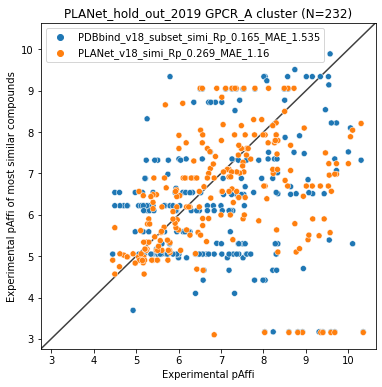

In [228]:
fig, ax = plt.subplots(figsize=(6,6))
sns.scatterplot(data=simi_pred_melted, x="gpcr_a_affi", y="value", hue='model')
lims = [
        np.min([ax.get_xlim(), ax.get_ylim()]),
        np.max([ax.get_xlim(), ax.get_ylim()]),
    ]
ax.set_xlim(lims)
ax.set_ylim(lims)
ax.plot(lims, lims, "k-", alpha=0.75, zorder=0)
plt.xlabel("Experimental pAffi")
plt.ylabel("Experimental pAffi of most similar compounds")
plt.title(f'PLANet_hold_out_2019 {cluster} cluster (N={len(simi_pred)})')
handles, labels = ax.get_legend_handles_labels()
# ax.legend(handles[:2], labels[:2], loc='upper left')
PDBbind_v18_subset_Rp = round(stats.pearsonr(simi_pred["gpcr_a_affi"], simi_pred["PDBbind_v18_subset_cpnd_affi"])[0], 3)
PLANet_v18_Rp = round(stats.pearsonr(simi_pred["gpcr_a_affi"], simi_pred["PLANet_v18_cpnd_affi"])[0], 3)

ax.legend(handles[:2], [f'PDBbind_v18_subset_simi_Rp_{PDBbind_v18_subset_Rp}_MAE_{round(mean_absolute_error(simi_pred["gpcr_a_affi"], simi_pred["PDBbind_v18_subset_cpnd_affi"]), 3)}', f'PLANet_v18_simi_Rp_{PLANet_v18_Rp}_MAE_{round(mean_absolute_error(simi_pred["gpcr_a_affi"], simi_pred["PLANet_v18_cpnd_affi"]), 3)}'], loc='upper left')
plt.savefig(f'/pubhome/xli02/project/PLIM/deep_learning/FAST/fast_plim/hold_out_2019/4-evaluation/test_on_PLANet_hold_out_2019/mean_of_5_models/pfam_cluster/GPCR_A/similarity/simi_predict_scatter_PLANet_vs_PIP.png', dpi=300, bbox_inches='tight')

In [97]:
fig = px.scatter(simi_pred_melted, x="gpcr_a_affi", y="value", color="model", hover_data=['gpcr_a_name'])
fig.show()

# simi > 0.8 label

In [59]:
# gpcr_a_simi_pred_merged = gpcr_a.merge(simi_pred.rename(columns={'gpcr_a_name':'unique_identify', 'gpcr_a_affi':'y_true'}), on=['unique_identify', 'y_true'])
# gpcr_a_simi_pred_merged

,unique_identify,y_true,PDBbind_minimized_v18_subset_cmx_mean,PDBbind_minimized_v18_subset_lig_alone_mean,PLANet_v18_cmx_mean,PLANet_v18_lig_alone_mean,PDBbind_minimized_v18_subset_union_PLANet_v18_cmx_mean,PDBbind_minimized_v18_subset_union_PLANet_v18_lig_alone_mean,Target_chembl_id,Cry_lig_name,...,q,HA,dataset,PCV_cluster,PDBbind_v18_subset_cpnd_affi,PDBbind_v18_subset_max_simi,PLANet_v18_cpnd_affi,PLANet_v18_max_simi,PIPUP_v18_cpnd_affi,merged_max_simi
0,CHEMBL251_6gdg_CHEMBL426537,4.45,7.883714,7.000507,5.732726,5.409891,5.677414,5.802628,CHEMBL251,6gdg,...,0.0,30.0,PLANet,GPCR_A,5.05,0.426471,4.903090,0.764706,4.903090,0.764706
1,CHEMBL251_6gdg_CHEMBL220334,4.50,8.478796,7.046917,5.746378,5.346539,6.094438,5.588923,CHEMBL251,6gdg,...,0.0,36.0,PLANet,GPCR_A,6.54,0.302083,4.567031,0.878378,4.567031,0.878378
2,CHEMBL251_5wf6_CHEMBL514701,4.50,8.300238,7.900762,5.877071,5.929508,5.718165,5.685761,CHEMBL251,5wf6,...,0.0,28.0,PLANet,GPCR_A,6.22,0.269663,5.688246,0.705882,5.688246,0.705882
3,CHEMBL251_6gdg_CHEMBL575027,4.61,8.004734,6.044315,5.580681,5.188618,5.821608,5.212502,CHEMBL251,6gdg,...,0.0,30.0,PLANet,GPCR_A,6.54,0.352941,4.744727,0.861538,4.744727,0.861538
4,CHEMBL251_5wf6_CHEMBL477665,4.62,8.334357,7.559244,5.659328,5.073587,5.681558,5.622702,CHEMBL251,5wf6,...,0.0,27.0,PLANet,GPCR_A,6.22,0.370370,5.056505,0.854839,5.056505,0.854839
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
227,CHEMBL249_6e59_CHEMBL140626,10.00,6.883062,7.702804,6.353472,7.077004,7.012140,6.872756,CHEMBL249,6e59,...,1.0,33.0,PLANet,GPCR_A,7.52,0.235849,7.236572,0.275510,7.236572,0.275510
228,CHEMBL249_6e59_CHEMBL143587,10.05,7.092670,8.094804,6.117736,6.907478,6.926677,6.447230,CHEMBL249,6e59,...,1.0,36.0,PLANet,GPCR_A,8.10,0.237624,7.886057,0.265306,7.886057,0.265306
229,CHEMBL251_5wf5_CHEMBL131242,10.10,8.353533,6.705135,7.223163,7.757889,7.539389,7.195646,CHEMBL251,5wf5,...,1.0,45.0,PLANet,GPCR_A,5.30,0.337209,8.045757,0.835443,8.045757,0.835443
230,CHEMBL251_5wf6_CHEMBL337080,10.30,8.123699,7.371679,7.266981,8.162561,7.408686,7.787519,CHEMBL251,5wf6,...,1.0,44.0,PLANet,GPCR_A,7.32,0.397727,8.207608,0.878378,8.207608,0.878378


In [30]:
gpcr_a_melted = gpcr_a[['unique_identify', 'y_true', 'PDBbind_minimized_v18_subset_cmx_mean', 'PLANet_v18_cmx_mean']].melt(id_vars=['unique_identify', 'y_true'], var_name='model').rename(columns={'value':'predicted_pAffi'})
gpcr_a_melted

,unique_identify,y_true,model,predicted_pAffi
0,CHEMBL251_6gdg_CHEMBL426537,4.45,PDBbind_minimized_v18_subset_cmx_mean,7.883714
1,CHEMBL251_6gdg_CHEMBL220334,4.50,PDBbind_minimized_v18_subset_cmx_mean,8.478796
2,CHEMBL251_5wf6_CHEMBL514701,4.50,PDBbind_minimized_v18_subset_cmx_mean,8.300238
3,CHEMBL251_6gdg_CHEMBL575027,4.61,PDBbind_minimized_v18_subset_cmx_mean,8.004734
4,CHEMBL251_5wf6_CHEMBL477665,4.62,PDBbind_minimized_v18_subset_cmx_mean,8.334357
...,...,...,...,...
459,CHEMBL249_6e59_CHEMBL140626,10.00,PLANet_v18_cmx_mean,6.353472
460,CHEMBL249_6e59_CHEMBL143587,10.05,PLANet_v18_cmx_mean,6.117736
461,CHEMBL251_5wf5_CHEMBL131242,10.10,PLANet_v18_cmx_mean,7.223163
462,CHEMBL251_5wf6_CHEMBL337080,10.30,PLANet_v18_cmx_mean,7.266981


In [31]:
simi_pred=pd.read_csv('/pubhome/xli02/project/PLIM/deep_learning/FAST/fast_plim/hold_out_2019/4-evaluation/test_on_PLANet_hold_out_2019/mean_of_5_models/pfam_cluster/GPCR_A/similarity/max_simi_predicted.csv', sep='\t')

In [32]:
gpcr_a_max_simi_melted = simi_pred.rename(columns={'gpcr_a_name':'unique_identify', 'gpcr_a_affi':'y_true', 'PDBbind_v18_subset_max_simi':'PDBbind_minimized_v18_subset_cmx_mean', 'PLANet_v18_max_simi':'PLANet_v18_cmx_mean'})[['unique_identify', 'y_true', 'PDBbind_minimized_v18_subset_cmx_mean', 'PLANet_v18_cmx_mean']].melt(id_vars=['unique_identify', 'y_true'], var_name='model').rename(columns={'value':'max_simi'})
gpcr_a_max_simi_melted

,unique_identify,y_true,model,max_simi
0,CHEMBL1833_6drx_CHEMBL1065,8.12,PDBbind_minimized_v18_subset_cmx_mean,0.305556
1,CHEMBL1833_6drx_CHEMBL119443,8.58,PDBbind_minimized_v18_subset_cmx_mean,0.432432
2,CHEMBL1833_6drx_CHEMBL1200938,8.72,PDBbind_minimized_v18_subset_cmx_mean,0.305556
3,CHEMBL1833_6drx_CHEMBL157138,8.49,PDBbind_minimized_v18_subset_cmx_mean,0.500000
4,CHEMBL1833_6drx_CHEMBL263881,7.52,PDBbind_minimized_v18_subset_cmx_mean,0.645161
...,...,...,...,...
459,CHEMBL3710_6m9t_CHEMBL3895324,6.52,PLANet_v18_cmx_mean,0.396226
460,CHEMBL3710_6m9t_CHEMBL3967903,9.05,PLANet_v18_cmx_mean,0.283333
461,CHEMBL3710_6m9t_CHEMBL3978305,6.27,PLANet_v18_cmx_mean,0.283333
462,CHEMBL3710_6m9t_CHEMBL548,9.07,PLANet_v18_cmx_mean,0.396226


In [33]:
gpcr_a_max_simi_melted_merged_predicted = gpcr_a_max_simi_melted.merge(gpcr_a_melted, on=['unique_identify', 'y_true', 'model'])
gpcr_a_max_simi_melted_merged_predicted

,unique_identify,y_true,model,max_simi,predicted_pAffi
0,CHEMBL1833_6drx_CHEMBL1065,8.12,PDBbind_minimized_v18_subset_cmx_mean,0.305556,8.194603
1,CHEMBL1833_6drx_CHEMBL119443,8.58,PDBbind_minimized_v18_subset_cmx_mean,0.432432,8.062322
2,CHEMBL1833_6drx_CHEMBL1200938,8.72,PDBbind_minimized_v18_subset_cmx_mean,0.305556,8.194603
3,CHEMBL1833_6drx_CHEMBL157138,8.49,PDBbind_minimized_v18_subset_cmx_mean,0.500000,8.481911
4,CHEMBL1833_6drx_CHEMBL263881,7.52,PDBbind_minimized_v18_subset_cmx_mean,0.645161,8.346625
...,...,...,...,...,...
459,CHEMBL3710_6m9t_CHEMBL3895324,6.52,PLANet_v18_cmx_mean,0.396226,7.770969
460,CHEMBL3710_6m9t_CHEMBL3967903,9.05,PLANet_v18_cmx_mean,0.283333,6.665101
461,CHEMBL3710_6m9t_CHEMBL3978305,6.27,PLANet_v18_cmx_mean,0.283333,7.257891
462,CHEMBL3710_6m9t_CHEMBL548,9.07,PLANet_v18_cmx_mean,0.396226,7.196145


In [34]:
gpcr_a_simi_8 = gpcr_a_max_simi_melted_merged_predicted[gpcr_a_max_simi_melted_merged_predicted['max_simi']>0.8]
len(gpcr_a_simi_8)

82

In [35]:
max(gpcr_a_max_simi_melted_merged_predicted['max_simi'])

0.9846153846153848

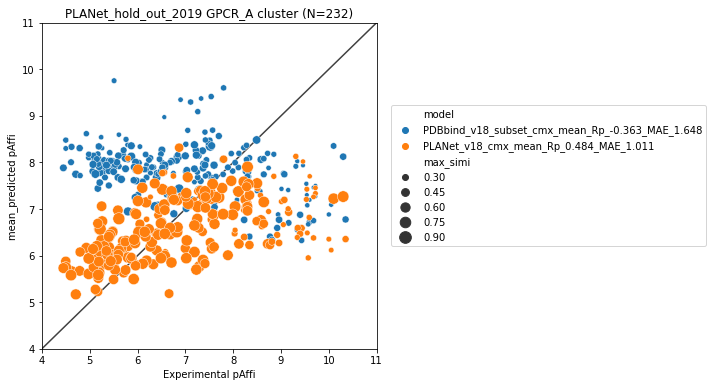

In [36]:
fig, ax = plt.subplots(figsize=(6,6))
sns.scatterplot(data=gpcr_a_max_simi_melted_merged_predicted, x="y_true", y="predicted_pAffi", hue='model', size='max_simi', sizes=(20,150))
lims = [
        4, 11
    ]
ax.set_xlim(lims)
ax.set_ylim(lims)
ax.plot(lims, lims, "k-", alpha=0.75, zorder=0)
plt.xlabel("Experimental pAffi")
plt.ylabel("mean_predicted pAffi")
plt.title(f'PLANet_hold_out_2019 {cluster} cluster (N={len(gpcr_a)})')
handles, labels = ax.get_legend_handles_labels()
# ax.legend(handles[:2], labels[:2], loc='upper left')
PDBbind_v18_subset_Rp = round(stats.pearsonr(gpcr_a["y_true"], gpcr_a["PDBbind_minimized_v18_subset_cmx_mean"])[0], 3)
PLANet_v18_Rp = round(stats.pearsonr(gpcr_a["y_true"], gpcr_a["PLANet_v18_cmx_mean"])[0], 3)

ax.legend(handles, ['model',f'PDBbind_v18_subset_cmx_mean_Rp_{PDBbind_v18_subset_Rp}_MAE_{round(mean_absolute_error(gpcr_a["y_true"], gpcr_a["PDBbind_minimized_v18_subset_cmx_mean"]), 3)}', f'PLANet_v18_cmx_mean_Rp_{PLANet_v18_Rp}_MAE_{round(mean_absolute_error(gpcr_a["y_true"], gpcr_a["PLANet_v18_cmx_mean"]), 3)}'] + labels[3:], loc='lower right', bbox_to_anchor=(2, 0.3))
plt.savefig(f'/pubhome/xli02/project/PLIM/deep_learning/FAST/fast_plim/hold_out_2019/4-evaluation/test_on_PLANet_hold_out_2019/mean_of_5_models/pfam_cluster/GPCR_A/{cluster}_scatter_PLANet_vs_PIP_cmx_mean_simi_size.png', dpi=300, bbox_inches='tight')

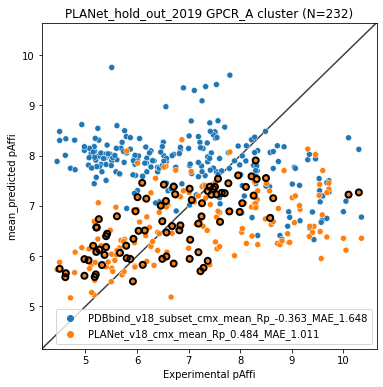

In [255]:
fig, ax = plt.subplots(figsize=(6,6))
sns.scatterplot(data=gpcr_a_max_simi_melted_merged_predicted, x="y_true", y="predicted_pAffi", hue='model')

sns.scatterplot(data=gpcr_a_simi_8, x="y_true", y="predicted_pAffi", marker="o", facecolor="none", edgecolor='black', linewidth=2)
lims = [
        np.min([ax.get_xlim(), ax.get_ylim()]),
        np.max([ax.get_xlim(), ax.get_ylim()]),
    ]
ax.set_xlim(lims)
ax.set_ylim(lims)
ax.plot(lims, lims, "k-", alpha=0.75, zorder=0)
plt.xlabel("Experimental pAffi")
plt.ylabel("mean_predicted pAffi")
plt.title(f'PLANet_hold_out_2019 {cluster} cluster (N={len(gpcr_a)})')
handles, labels = ax.get_legend_handles_labels()
# ax.legend(handles[:2], labels[:2], loc='upper left')
PDBbind_v18_subset_Rp = round(stats.pearsonr(gpcr_a["y_true"], gpcr_a["PDBbind_minimized_v18_subset_cmx_mean"])[0], 3)
PLANet_v18_Rp = round(stats.pearsonr(gpcr_a["y_true"], gpcr_a["PLANet_v18_cmx_mean"])[0], 3)

ax.legend(handles, [f'PDBbind_v18_subset_cmx_mean_Rp_{PDBbind_v18_subset_Rp}_MAE_{round(mean_absolute_error(gpcr_a["y_true"], gpcr_a["PDBbind_minimized_v18_subset_cmx_mean"]), 3)}', f'PLANet_v18_cmx_mean_Rp_{PLANet_v18_Rp}_MAE_{round(mean_absolute_error(gpcr_a["y_true"], gpcr_a["PLANet_v18_cmx_mean"]), 3)}'], loc='lower right')
plt.savefig(f'/pubhome/xli02/project/PLIM/deep_learning/FAST/fast_plim/hold_out_2019/4-evaluation/test_on_PLANet_hold_out_2019/mean_of_5_models/pfam_cluster/GPCR_A/{cluster}_scatter_PLANet_vs_PIP_cmx_mean_simi_8_labled.png', dpi=300, bbox_inches='tight')

In [95]:
gpcr_a_max_simi_melted_merged_predicted.columns

Index(['unique_identify', 'y_true', 'model', 'max_simi', 'predicted_pAffi'], dtype='object')

In [96]:
for row in gpcr_a_max_simi_melted_merged_predicted.itertuples():
    gpcr_a_max_simi_melted_merged_predicted.loc[row.Index, 'cluster'] = mol2cluster[row.unique_identify]
gpcr_a_max_simi_melted_merged_predicted

,unique_identify,y_true,model,max_simi,predicted_pAffi,cluster
0,CHEMBL1833_6drx_CHEMBL1065,8.12,PDBbind_minimized_v18_subset_cmx_mean,0.305556,8.194603,8.0
1,CHEMBL1833_6drx_CHEMBL119443,8.58,PDBbind_minimized_v18_subset_cmx_mean,0.432432,8.062322,8.0
2,CHEMBL1833_6drx_CHEMBL1200938,8.72,PDBbind_minimized_v18_subset_cmx_mean,0.305556,8.194603,8.0
3,CHEMBL1833_6drx_CHEMBL157138,8.49,PDBbind_minimized_v18_subset_cmx_mean,0.500000,8.481911,8.0
4,CHEMBL1833_6drx_CHEMBL263881,7.52,PDBbind_minimized_v18_subset_cmx_mean,0.645161,8.346625,8.0
...,...,...,...,...,...,...
459,CHEMBL3710_6m9t_CHEMBL3895324,6.52,PLANet_v18_cmx_mean,0.396226,7.770969,18.0
460,CHEMBL3710_6m9t_CHEMBL3967903,9.05,PLANet_v18_cmx_mean,0.283333,6.665101,18.0
461,CHEMBL3710_6m9t_CHEMBL3978305,6.27,PLANet_v18_cmx_mean,0.283333,7.257891,18.0
462,CHEMBL3710_6m9t_CHEMBL548,9.07,PLANet_v18_cmx_mean,0.396226,7.196145,18.0


In [77]:
import plotly.express as px

In [101]:
fig = px.scatter(gpcr_a_max_simi_melted_merged_predicted, x="y_true", y="predicted_pAffi", color="model", hover_data=['unique_identify'])
fig.update_layout(yaxis=dict(range=[4,11]), xaxis=dict(range=[4,11]))
fig.show()

In [85]:
gpcr_a_max_simi_melted_merged_predicted[gpcr_a_max_simi_melted_merged_predicted['unique_identify'] == 'CHEMBL251_5wf6_CHEMBL2064661']

,unique_identify,y_true,model,max_simi,predicted_pAffi,cluster
134,CHEMBL251_5wf6_CHEMBL2064661,5.51,PDBbind_minimized_v18_subset_cmx_mean,0.277228,9.753837,6.0
366,CHEMBL251_5wf6_CHEMBL2064661,5.51,PLANet_v18_cmx_mean,0.607477,6.037844,6.0


In [136]:
fig = px.scatter(gpcr_a_max_simi_melted_merged_predicted, x="y_true", y="predicted_pAffi", color="cluster", symbol="model", hover_data=['unique_identify'])
fig.update_layout(yaxis=dict(range=[4,11]), xaxis=dict(range=[4,11]))
fig.show()

In [110]:
len(gpcr_a_max_simi_melted_merged_predicted)

464

In [109]:
len(gpcr_a_max_simi_melted_merged_predicted[gpcr_a_max_simi_melted_merged_predicted['cluster'].isin([0, 1, 2, 3, 4, 5])])

224

In [121]:
fig = px.scatter(gpcr_a_max_simi_melted_merged_predicted[gpcr_a_max_simi_melted_merged_predicted['cluster'].isin(range(5))], x="y_true", y="predicted_pAffi", color="cluster", symbol="model", hover_data=['unique_identify'])
fig.update_layout(yaxis=dict(range=[4,11]), xaxis=dict(range=[4,11]))
fig.show()

In [124]:
gpcr_a_max_simi_melted_merged_predicted.columns

Index(['unique_identify', 'y_true', 'model', 'max_simi', 'predicted_pAffi',
       'cluster'],
      dtype='object')

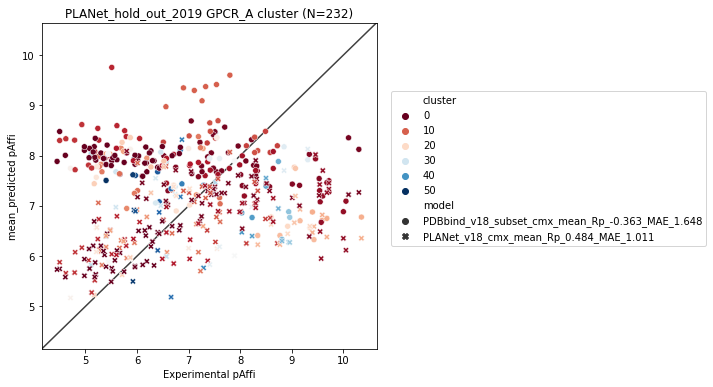

In [140]:
fig, ax = plt.subplots(figsize=(6,6))
sns.scatterplot(data=gpcr_a_max_simi_melted_merged_predicted, x="y_true", y="predicted_pAffi", hue='cluster', palette='RdBu', style="model", sizes=(20,150))
lims = [
        np.min([ax.get_xlim(), ax.get_ylim()]),
        np.max([ax.get_xlim(), ax.get_ylim()]),
    ]
ax.set_xlim(lims)
ax.set_ylim(lims)
ax.plot(lims, lims, "k-", alpha=0.75, zorder=0)
plt.xlabel("Experimental pAffi")
plt.ylabel("mean_predicted pAffi")
plt.title(f'PLANet_hold_out_2019 GPCR_A cluster (N={len(gpcr_a)})')
handles, labels = ax.get_legend_handles_labels()
# ax.legend(handles[:2], labels[:2], loc='upper left')
PDBbind_v18_subset_Rp = round(stats.pearsonr(gpcr_a["y_true"], gpcr_a["PDBbind_minimized_v18_subset_cmx_mean"])[0], 3)
PLANet_v18_Rp = round(stats.pearsonr(gpcr_a["y_true"], gpcr_a["PLANet_v18_cmx_mean"])[0], 3)

ax.legend(handles, labels[:7] + ['model',f'PDBbind_v18_subset_cmx_mean_Rp_{PDBbind_v18_subset_Rp}_MAE_{round(mean_absolute_error(gpcr_a["y_true"], gpcr_a["PDBbind_minimized_v18_subset_cmx_mean"]), 3)}', f'PLANet_v18_cmx_mean_Rp_{PLANet_v18_Rp}_MAE_{round(mean_absolute_error(gpcr_a["y_true"], gpcr_a["PLANet_v18_cmx_mean"]), 3)}'], loc='lower right', bbox_to_anchor=(2, 0.3))
plt.savefig(f'/pubhome/xli02/project/PLIM/deep_learning/FAST/fast_plim/hold_out_2019/4-evaluation/test_on_PLANet_hold_out_2019/mean_of_5_models/pfam_cluster/GPCR_A/GPCR_A_scatter_PLANet_vs_PIP_cmx_mean_clustered.png', dpi=300, bbox_inches='tight')

In [150]:
gpcr_a['diff_cmx'] = np.abs(gpcr_a['PDBbind_minimized_v18_subset_cmx_mean'] - gpcr_a['PLANet_v18_cmx_mean'])
gpcr_a_diff_name = gpcr_a[gpcr_a['diff_cmx'] > 2]['unique_identify']
len(gpcr_a_diff_name)

48

In [154]:
set(gpcr_a_max_simi_melted_merged_predicted[gpcr_a_max_simi_melted_merged_predicted['unique_identify'].isin(gpcr_a_diff_name)]['cluster'])

{0.0,
 5.0,
 6.0,
 7.0,
 8.0,
 10.0,
 12.0,
 19.0,
 23.0,
 24.0,
 25.0,
 27.0,
 32.0,
 44.0,
 49.0}

In [155]:
gpcr_a_max_simi_melted_merged_predicted[gpcr_a_max_simi_melted_merged_predicted['cluster']==0]

,unique_identify,y_true,model,max_simi,predicted_pAffi,cluster
74,CHEMBL251_5wf5_CHEMBL208311,6.49,PDBbind_minimized_v18_subset_cmx_mean,0.329787,8.179275,0.0
111,CHEMBL251_5wf5_CHEMBL376968,6.33,PDBbind_minimized_v18_subset_cmx_mean,0.337079,7.894828,0.0
131,CHEMBL251_5wf6_CHEMBL204366,5.96,PDBbind_minimized_v18_subset_cmx_mean,0.333333,7.827748,0.0
132,CHEMBL251_5wf6_CHEMBL205226,5.67,PDBbind_minimized_v18_subset_cmx_mean,0.345238,7.630756,0.0
135,CHEMBL251_5wf6_CHEMBL208264,6.19,PDBbind_minimized_v18_subset_cmx_mean,0.345238,7.677091,0.0
...,...,...,...,...,...,...
454,CHEMBL251_6gdg_CHEMBL573032,5.15,PLANet_v18_cmx_mean,0.815385,6.205022,0.0
455,CHEMBL251_6gdg_CHEMBL573950,4.98,PLANet_v18_cmx_mean,0.863636,5.939200,0.0
456,CHEMBL251_6gdg_CHEMBL574597,5.07,PLANet_v18_cmx_mean,0.777778,6.142224,0.0
457,CHEMBL251_6gdg_CHEMBL575027,4.61,PLANet_v18_cmx_mean,0.861538,5.580681,0.0


In [165]:
len(PLANet_max_simi_with_gpcr_a)

274

In [166]:
len(set(PLANet_max_simi_with_gpcr_a['gpcr_a_name']))

232

In [164]:
PLANet_max_simi_with_gpcr_a = pd.read_csv('/pubhome/xli02/project/PLIM/deep_learning/FAST/fast_plim/hold_out_2019/4-evaluation/test_on_PLANet_hold_out_2019/mean_of_5_models/pfam_cluster/GPCR_A/similarity/PLANet_v18_in_gpcr_a/simi.csv', sep='\t')
PLANet_max_simi_with_gpcr_a[PLANet_max_simi_with_gpcr_a['gpcr_a_name'].isin(gpcr_a_max_simi_melted_merged_predicted[gpcr_a_max_simi_melted_merged_predicted['cluster']==0]['unique_identify'])]

,gpcr_a_name,gpcr_a_affi,gpcr_a_smiles,PLANet_v18_cpnd_name,PLANet_v18_cpnd_affi,PLANet_v18_cpnd_smiles,similarity
0,CHEMBL251_6gdg_CHEMBL426537,4.45,CONc1nc(C#Cc2ccc(C)cc2)nc2c1ncn2[C@@H]1O[C@H](...,CHEMBL251_5g53_CHEMBL223328,4.903090,CONc1nc(C#Cc2cccnc2)nc2c1ncn2[C@@H]1O[C@H](CO)...,0.764706
1,CHEMBL251_6gdg_CHEMBL220334,4.50,CCCCCc1ccc(C#Cc2nc(NOC)c3ncn([C@@H]4O[C@H](C(=...,CHEMBL251_5g53_CHEMBL374336,4.567031,CCCCCc1ccc(C#Cc2nc(NOC)c3ncn([C@@H]4O[C@H](C(=...,0.878378
3,CHEMBL251_6gdg_CHEMBL575027,4.61,CNC(=O)[C@H]1O[C@@H](n2cnc3c(NC)nc(C#Cc4ccccn4...,CHEMBL251_2ydo_CHEMBL223514,4.744727,CNC(=O)[C@H]1O[C@@H](n2cnc3c(NOC)nc(C#Cc4ccccn...,0.861538
9,CHEMBL251_6gdg_CHEMBL573950,4.98,CNC(=O)[C@H]1O[C@@H](n2cnc3c(NOC)nc(C#Cc4ccc(O...,CHEMBL251_5g53_CHEMBL223456,4.832683,CNC(=O)[C@H]1O[C@@H](n2cnc3c(NOC)nc(C#Cc4ccc(C...,0.863636
10,CHEMBL251_6gdg_CHEMBL223625,4.98,CNC(=O)[C@H]1O[C@@H](n2cnc3c(NOC)nc(C#Cc4ccc(C...,CHEMBL251_5g53_CHEMBL223456,4.832683,CNC(=O)[C@H]1O[C@@H](n2cnc3c(NOC)nc(C#Cc4ccc(C...,0.850746
12,CHEMBL251_6gdg_CHEMBL574597,5.07,CNc1nc(C#Cc2ccccc2)nc2c1ncn2[C@@H]1O[C@H](CO)[...,CHEMBL251_2ydo_CHEMBL2092786,6.563837,CNc1nc(C#CC(O)c2ccccc2)nc2c1ncn2[C@@H]1O[C@H](...,0.777778
13,CHEMBL251_6gdg_CHEMBL574597,5.07,CNc1nc(C#Cc2ccccc2)nc2c1ncn2[C@@H]1O[C@H](CO)[...,CHEMBL251_2ydo_CHEMBL261453,6.787812,CNc1nc(C#C[C@@H](O)c2ccccc2)nc2c1ncn2[C@@H]1O[...,0.777778
14,CHEMBL251_6gdg_CHEMBL574597,5.07,CNc1nc(C#Cc2ccccc2)nc2c1ncn2[C@@H]1O[C@H](CO)[...,CHEMBL251_5g53_CHEMBL410115,5.806875,CNc1nc(C#C[C@H](O)c2ccccc2)nc2c1ncn2[C@@H]1O[C...,0.777778
15,CHEMBL251_6gdg_CHEMBL373578,5.08,CONc1nc(C#Cc2cccc(C(F)(F)F)c2)nc2c1ncn2[C@@H]1...,CHEMBL251_5g53_CHEMBL223328,4.903090,CONc1nc(C#Cc2cccnc2)nc2c1ncn2[C@@H]1O[C@H](CO)...,0.729730
18,CHEMBL251_6gdg_CHEMBL573032,5.15,CNC(=O)[C@H]1O[C@@H](n2cnc3c(NC)nc(C#Cc4ccc(OC...,CHEMBL251_5g53_CHEMBL573269,4.896196,CNC(=O)[C@H]1O[C@@H](n2cnc3c(NC)nc(C#Cc4ccc(F)...,0.815385


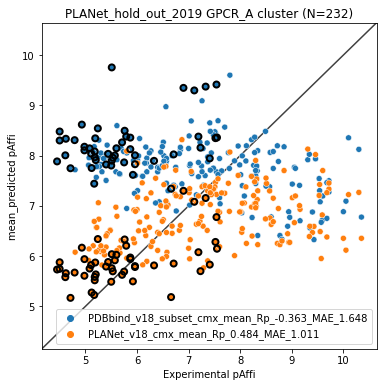

In [152]:
fig, ax = plt.subplots(figsize=(6,6))
sns.scatterplot(data=gpcr_a_max_simi_melted_merged_predicted, x="y_true", y="predicted_pAffi", hue='model')

sns.scatterplot(data=gpcr_a_max_simi_melted_merged_predicted[gpcr_a_max_simi_melted_merged_predicted['unique_identify'].isin(gpcr_a_diff_name)], x="y_true", y="predicted_pAffi", marker="o", facecolor="none", edgecolor='black', linewidth=2)
lims = [
        np.min([ax.get_xlim(), ax.get_ylim()]),
        np.max([ax.get_xlim(), ax.get_ylim()]),
    ]
ax.set_xlim(lims)
ax.set_ylim(lims)
ax.plot(lims, lims, "k-", alpha=0.75, zorder=0)
plt.xlabel("Experimental pAffi")
plt.ylabel("mean_predicted pAffi")
plt.title(f'PLANet_hold_out_2019 GPCR_A cluster (N={len(gpcr_a)})')
handles, labels = ax.get_legend_handles_labels()
# ax.legend(handles[:2], labels[:2], loc='upper left')
PDBbind_v18_subset_Rp = round(stats.pearsonr(gpcr_a["y_true"], gpcr_a["PDBbind_minimized_v18_subset_cmx_mean"])[0], 3)
PLANet_v18_Rp = round(stats.pearsonr(gpcr_a["y_true"], gpcr_a["PLANet_v18_cmx_mean"])[0], 3)

ax.legend(handles, [f'PDBbind_v18_subset_cmx_mean_Rp_{PDBbind_v18_subset_Rp}_MAE_{round(mean_absolute_error(gpcr_a["y_true"], gpcr_a["PDBbind_minimized_v18_subset_cmx_mean"]), 3)}', f'PLANet_v18_cmx_mean_Rp_{PLANet_v18_Rp}_MAE_{round(mean_absolute_error(gpcr_a["y_true"], gpcr_a["PLANet_v18_cmx_mean"]), 3)}'], loc='lower right')
plt.savefig(f'/pubhome/xli02/project/PLIM/deep_learning/FAST/fast_plim/hold_out_2019/4-evaluation/test_on_PLANet_hold_out_2019/mean_of_5_models/pfam_cluster/GPCR_A/GPCR_A_scatter_PLANet_vs_PIP_cmx_mean_diff_2_labled.png', dpi=300, bbox_inches='tight')

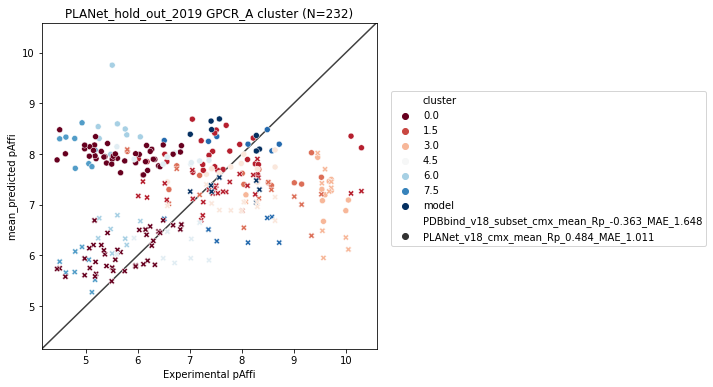

In [138]:
fig, ax = plt.subplots(figsize=(6,6))
sns.scatterplot(data=gpcr_a_max_simi_melted_merged_predicted[gpcr_a_max_simi_melted_merged_predicted['cluster'].isin(range(10))], x="y_true", y="predicted_pAffi", hue='cluster', palette='RdBu', style="model", sizes=(20,150))
lims = [
        np.min([ax.get_xlim(), ax.get_ylim()]),
        np.max([ax.get_xlim(), ax.get_ylim()]),
    ]
ax.set_xlim(lims)
ax.set_ylim(lims)
ax.plot(lims, lims, "k-", alpha=0.75, zorder=0)
plt.xlabel("Experimental pAffi")
plt.ylabel("mean_predicted pAffi")
plt.title(f'PLANet_hold_out_2019 GPCR_A cluster (N={len(gpcr_a)})')
handles, labels = ax.get_legend_handles_labels()
# ax.legend(handles[:2], labels[:2], loc='upper left')
PDBbind_v18_subset_Rp = round(stats.pearsonr(gpcr_a["y_true"], gpcr_a["PDBbind_minimized_v18_subset_cmx_mean"])[0], 3)
PLANet_v18_Rp = round(stats.pearsonr(gpcr_a["y_true"], gpcr_a["PLANet_v18_cmx_mean"])[0], 3)

ax.legend(handles, labels[:7] + ['model',f'PDBbind_v18_subset_cmx_mean_Rp_{PDBbind_v18_subset_Rp}_MAE_{round(mean_absolute_error(gpcr_a["y_true"], gpcr_a["PDBbind_minimized_v18_subset_cmx_mean"]), 3)}', f'PLANet_v18_cmx_mean_Rp_{PLANet_v18_Rp}_MAE_{round(mean_absolute_error(gpcr_a["y_true"], gpcr_a["PLANet_v18_cmx_mean"]), 3)}'], loc='lower right', bbox_to_anchor=(2, 0.3))
# plt.savefig(f'/pubhome/xli02/project/PLIM/deep_learning/FAST/fast_plim/hold_out_2019/4-evaluation/test_on_PLANet_hold_out_2019/mean_of_5_models/pfam_cluster/GPCR_A/{cluster}_scatter_PLANet_vs_PIP_cmx_mean_clustered.png', dpi=300, bbox_inches='tight')

In [118]:
fig.data[0].name

'PDBbind_minimized_v18_subset_cmx_mean'

In [119]:
fig.data[1].name

'PLANet_v18_cmx_mean'

In [105]:
fig = px.scatter(gpcr_a_max_simi_melted_merged_predicted[gpcr_a_max_simi_melted_merged_predicted['cluster']==0], x="y_true", y="predicted_pAffi", color="model", hover_data=['unique_identify'])
fig.update_layout(yaxis=dict(range=[4,11]), xaxis=dict(range=[4,11]))
fig.show()

In [11]:
from rdkit.Chem import AllChem, PandasTools, rdFMCS, Draw, rdMolDescriptors
from rdkit import Chem
from rdkit import DataStructs

In [31]:
gpcr_a.sort_values(by='y_true', inplace=True)

In [65]:
gpcr_a_mols = []
for row in gpcr_a.itertuples():
    mol = Chem.MolFromSmiles(PLANet_hold_property[PLANet_hold_property['unique_identify']==row.unique_identify]['Similar_compnd_smiles'].values[0])
    mol.SetProp('_Name', f'{row.unique_identify}')
    gpcr_a_mols.append(mol)
len(gpcr_a_mols)

232

In [66]:
gpcr_a_mol_fps = [AllChem.GetMorganFingerprintAsBitVect(mol, 2, 1024) for mol in gpcr_a_mols]
len(gpcr_a_mol_fps)

232

In [67]:
dists = []
nfps = len(gpcr_a_mol_fps)
for i in range(1, nfps):
    sims = DataStructs.BulkTanimotoSimilarity(gpcr_a_mol_fps[i], gpcr_a_mol_fps[:i])  
    # Tanimoto similarity; The result is same as `FingerprintSimilarity()`; But the second para could be a list; 
    #output: a various length list [0.4377880184331797]; [0.32608695652173914, 0.42857142857142855]...
    dists.extend([1 - x for x in sims])

# Cluster
from rdkit.ML.Cluster import Butina
cutoff = 0.45
clusters = Butina.ClusterData(dists, nfps, cutoff, isDistData=True)
clusters = sorted(clusters, key=len, reverse=True)
len(clusters)

51

In [156]:
len(clusters[0])

41

In [73]:
mol2cluster = {}
for i in range(len(clusters)):
    for j in range(len(clusters[i])):
        mol_name = gpcr_a_mols[clusters[i][j]].GetProp('_Name')
        mol2cluster[mol_name] = i
len(mol2cluster)

232

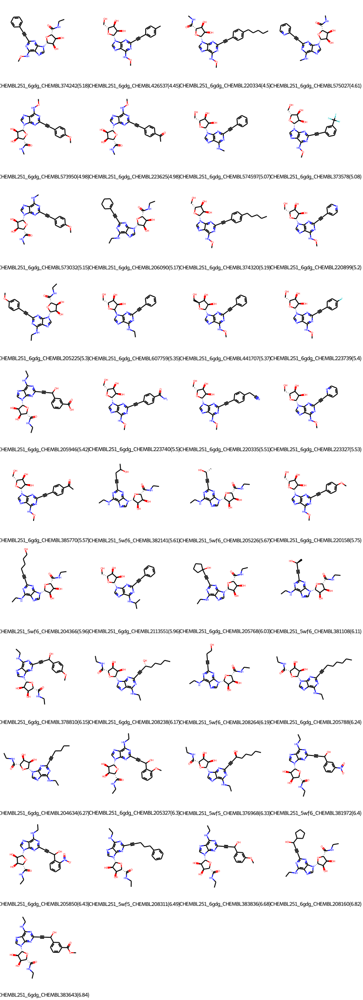

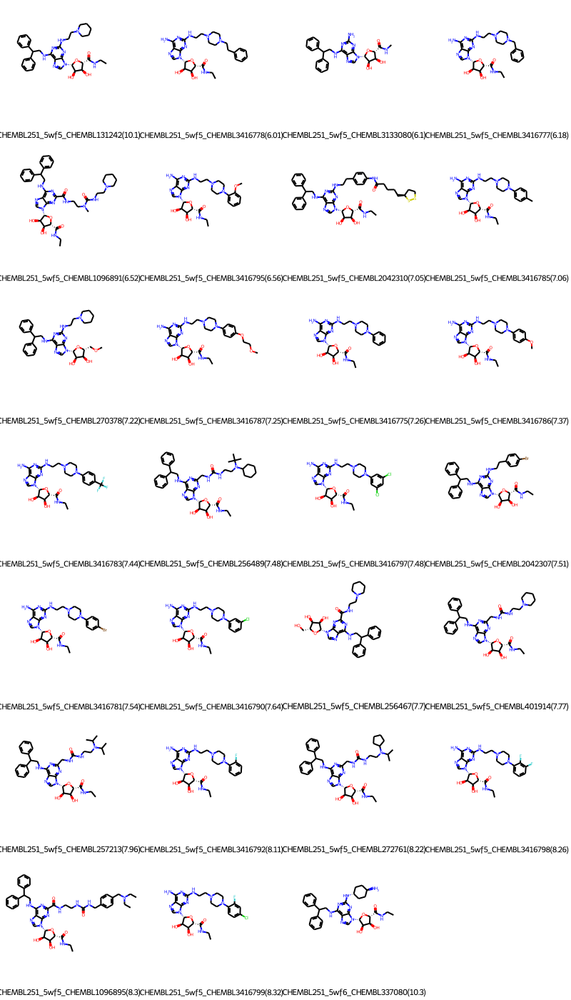

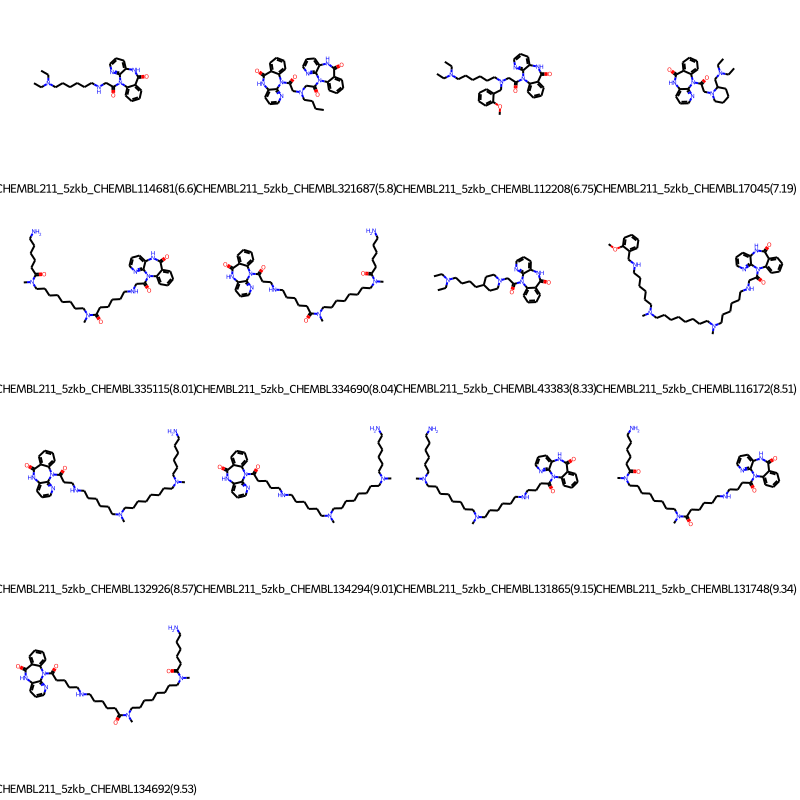

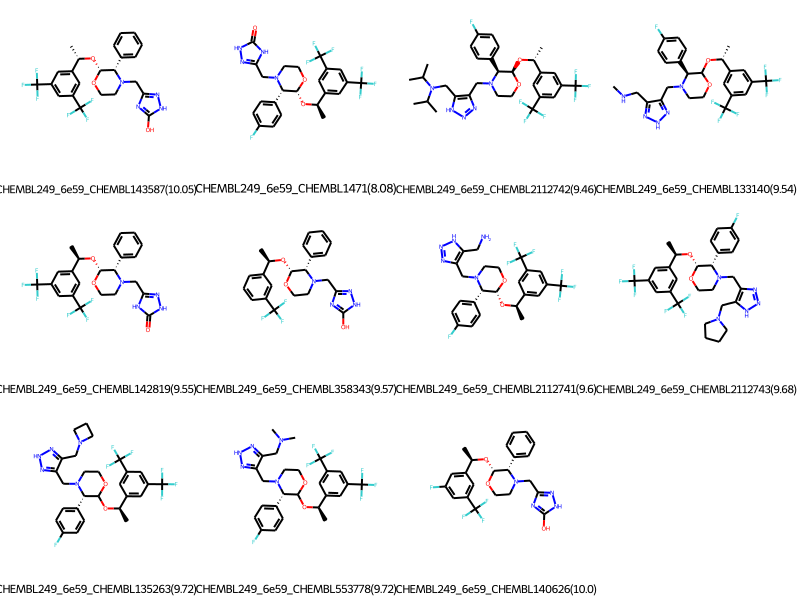

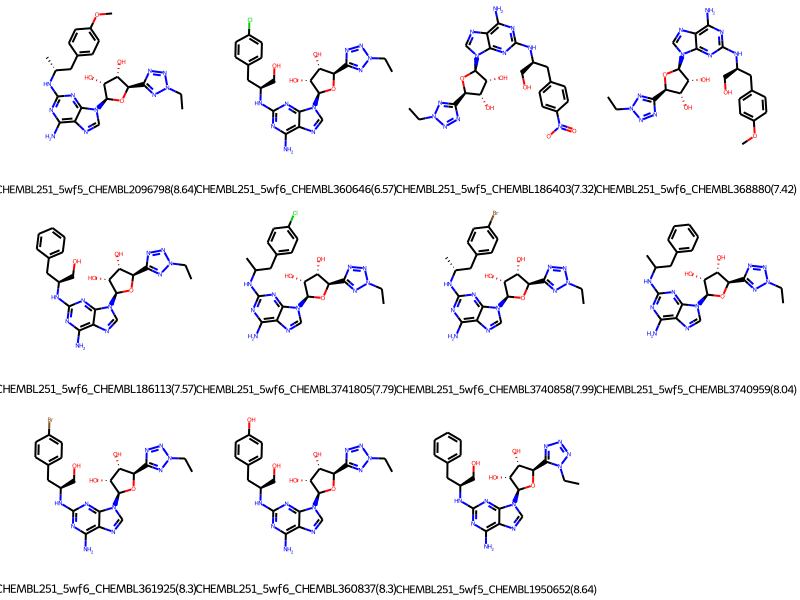

...

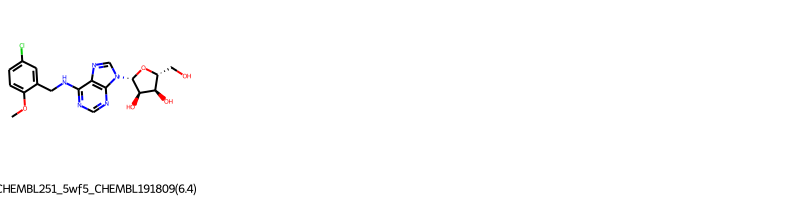

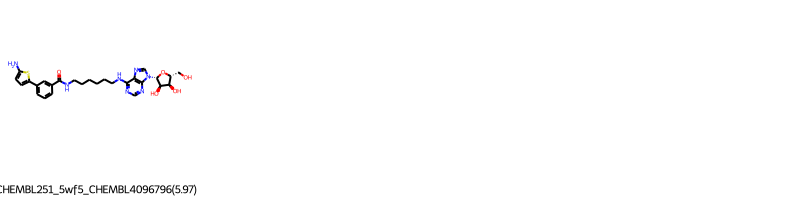

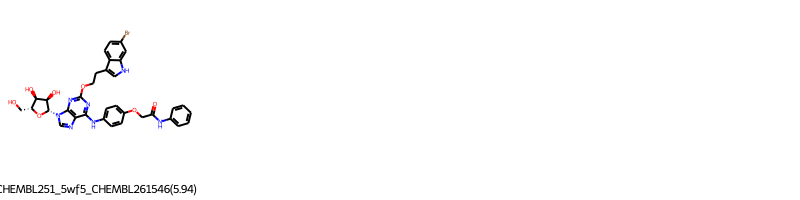

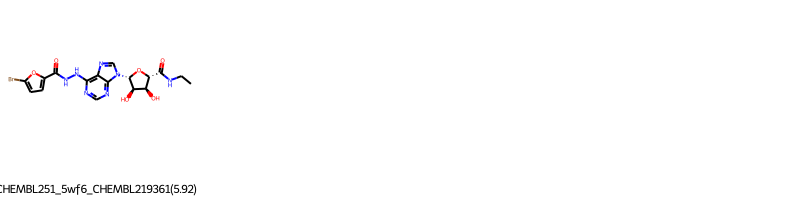

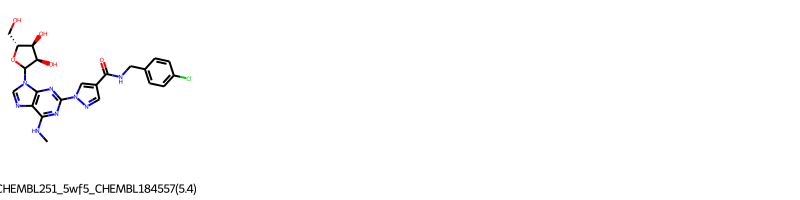

In [56]:
for i in range(len(clusters)):
    img = Draw.MolsToGridImage([
        gpcr_a_mols[clusters[i][j]] 
        for j in range(len(clusters[i]))
    ], legends=[
        gpcr_a_mols[clusters[i][j]].GetProp('_Name') 
        for j in range(len(clusters[i]))
    ], molsPerRow=4)
    display(img)

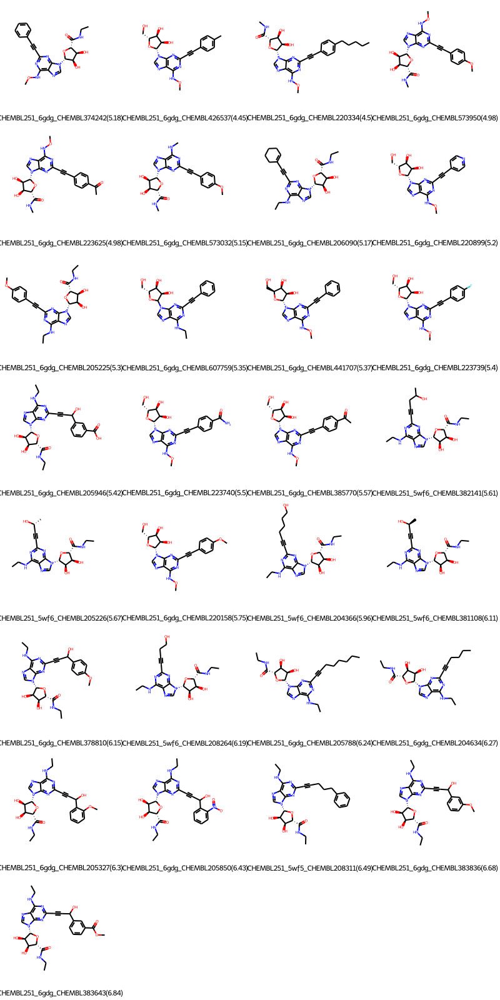

In [52]:
from IPython.display import display
img = Draw.MolsToGridImage([
    gpcr_a_mols[clusters[0][j]] 
    for j in range(len(clusters[0]))
], legends=[
    gpcr_a_mols[clusters[0][j]].GetProp('_Name') 
    for j in range(len(clusters[0]))
], molsPerRow=4)
display(img)

In [44]:
len(clusters[0])

29

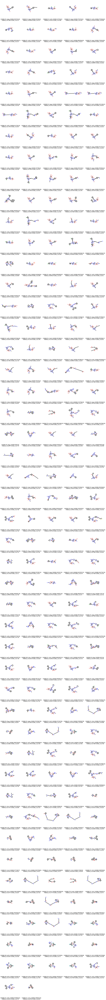

In [30]:

Draw.MolsToGridImage([Chem.MolFromSmiles(PLANet_hold_property[PLANet_hold_property['unique_identify']==ui]['Similar_compnd_smiles'].values[0]) for ui in gpcr_a['unique_identify']], legends=[f'{row.unique_identify}({row.y_true})\nPDBbind_cmx:{round(row.PDBbind_minimized_v18_subset_cmx_mean,2)}; PLANet_cmx:{round(row.PLANet_v18_cmx_mean,2)}' for row in gpcr_a.itertuples()], molsPerRow=5, returnPNG=False, maxMols=len(gpcr_a))